In [1]:
from typing import List
from tqdm import tqdm
from dataclasses import asdict
import pandas as pd

import matplotlib.pyplot as plt

import numpy as np
import torch

from chinese_checkers.simulation import GameSimulation, S3SimulationCatalog 
from chinese_checkers.model.BootstrapModel import BootstrapModel
from chinese_checkers.archive.experience import ExperienceData, S3ExperienceCatalog, ExperienceMetadata

from chinese_checkers.archive.cnn import CnnEncoderExperience, CnnEncoderState, CnnEncoderMove, DqlCnnAgent, DqlCnnModel

print("CUDA Available:", torch.cuda.is_available())

def print_err(error_values):
    epochs = [entry['epoch'] for entry in error_values]
    test_errors = [entry['test_error'] for entry in error_values]
    validation_errors = [entry['validation_error'] for entry in error_values]
    validation_errors_discounted = [entry['validation_error_discounted_returns'] for entry in error_values]  

    # Calculate log values
    log_test_errors = np.log(test_errors)
    log_validation_errors = np.log(validation_errors)
    log_validation_errors_discounted = np.log(validation_errors_discounted)

    # Set up the plot
    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    

    # Plot original error values
    axes[0].plot(epochs, test_errors, label='Test Error', linestyle=':', marker='o')
    axes[0].plot(epochs, validation_errors, label='Validation Error', linestyle='--')
    axes[0].plot(epochs, validation_errors_discounted, label='Validation Error (Discounted Returns)', linestyle='-')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Error Value')
    axes[0].set_title('Error Values over Epochs')
    axes[0].legend()
    axes[0].grid(True) 

    # Plot log-transformed error values
    axes[1].plot(epochs, log_test_errors, label='Log Test Error', linestyle=':', marker='o')
    axes[1].plot(epochs, log_validation_errors, label='Log Validation Error', linestyle='--')
    axes[1].plot(epochs, log_validation_errors_discounted, label='Log Validation Error (Discounted Returns)', linestyle='-')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Log Error Value')
    axes[1].set_title('Log of Error Values over Epochs')
    axes[1].legend()
    axes[1].grid(True) 

    # Save and show the plots
    plt.tight_layout()
    plt.savefig('training-error-with-log.png')
    plt.show()

CUDA Available: True


In [2]:
generator_name="CnnExperienceEncoder-v006"

catalog = S3ExperienceCatalog()
dataset_metadata: List[ExperienceMetadata] = catalog.list_datasets()
pd.DataFrame([asdict(m) for m in dataset_metadata if m.generator_name == generator_name])

,player_count,board_size,max_game_length,winning_player,name,version,generator_name,current_player
0,2,4,1000,0,bad-player-3-bootstrap-simulation,v0.0.1,CnnExperienceEncoder-v006,0
1,2,4,1000,0,bad-player-3-bootstrap-simulation,v0.0.1,CnnExperienceEncoder-v006,3
2,2,4,1000,3,bad-player-3-bootstrap-simulation,v0.0.1,CnnExperienceEncoder-v006,0
3,2,4,1000,3,bad-player-3-bootstrap-simulation,v0.0.1,CnnExperienceEncoder-v006,3
4,2,4,1000,0,bootstrap-p3-010-simulation,v0.0.1,CnnExperienceEncoder-v006,0
5,2,4,1000,0,bootstrap-p3-010-simulation,v0.0.1,CnnExperienceEncoder-v006,3
6,2,4,1000,3,bootstrap-p3-010-simulation,v0.0.1,CnnExperienceEncoder-v006,0
7,2,4,1000,3,bootstrap-p3-010-simulation,v0.0.1,CnnExperienceEncoder-v006,3
8,2,4,1000,0,bootstrap-simulation-p0d05-p0d25,v0.0.1,CnnExperienceEncoder-v006,0
9,2,4,1000,0,bootstrap-simulation-p0d05-p0d25,v0.0.1,CnnExperienceEncoder-v006,3


In [3]:
player_count = 2
current_player = "0"
board_size = 4

In [4]:
# Initialize tqdm with detailed postfix for metadata info
experiences: List[ExperienceData] = []
progress_bar = tqdm(dataset_metadata, desc="Loading datasets")

for metadata in progress_bar:
    # Dynamically set postfix with metadata name and generator name
    progress_bar.set_postfix(name=metadata.name, generator=metadata.generator_name, total=len(experiences))
    
    if (
        metadata.player_count == str(player_count)
        and metadata.current_player == current_player
        and metadata.generator_name == generator_name
        and metadata.board_size == str(board_size)
    ):
        experiences.extend(catalog.load_random_batch(metadata, 50))

print(f"Found {len(experiences)} datasets for player_count: {player_count}, and current_player: {current_player}.")

Loading datasets: 100%|██████████| 72/72 [15:53<00:00, 13.24s/it, generator=CnnExperienceEncoder-v005, name=bootstrap-0d01-vs-dql-v004, total=209755]       

Found 209755 datasets for player_count: 2, and current_player: 0.


In [5]:
p0_win_count = len([e for e in experiences if e.metadata.winning_player =="0"])
p3_win_count = len([e for e in experiences if e.metadata.winning_player =="3"])
no_win_count = len([e for e in experiences if not e.metadata.winning_player in ["0", "3"]])

print(f"p0_win_count {p0_win_count}, p3_win_count {p3_win_count}, no_win_count {no_win_count}")

p0_win_count 105381, p3_win_count 104374, no_win_count 0


In [6]:
sim_catalog = S3SimulationCatalog()
sim_metadata: List[GameSimulation] = [
    m 
    for m in sim_catalog.list_datasets()
    if m.winning_player in ["0", "3"]
        and m.name == "bootstrap-simulation-short"
]
pd.DataFrame([asdict(m) for m in sim_metadata])

,player_count,board_size,max_game_length,winning_player,name,version
0,2,4,200,0,bootstrap-simulation-short,v0.0.1
1,2,4,200,3,bootstrap-simulation-short,v0.0.1


In [9]:
simulations: List[GameSimulation] = []
progress_bar = tqdm(sim_metadata, desc="Loading datasets")

for metadata in progress_bar:
    # Dynamically set postfix with metadata name and generator name
    progress_bar.set_postfix(name=metadata.name, total=len(simulations))
    simulations.extend(sim_catalog.load_dataset(metadata))

print(f"Found {len(simulations)} datasets for player_count: {player_count}, and current_player: {current_player}.")

Loading datasets: 100%|██████████| 2/2 [00:01<00:00,  1.16it/s, name=bootstrap-simulation-short, total=177]

Found 359 datasets for player_count: 2, and current_player: 0.


In [10]:
state_encoder = CnnEncoderState(board_size)
move_encoder = CnnEncoderMove(board_size)
cnn_encoder = CnnEncoderExperience("v006")
model_version = "v008-50batch"
# Define model parameters
gamma = 0.99
lr = 0.0001
batch_size = 2**7
model_save_path = f"dql_cnn_model_{model_version}.pth"

Starting training...


Training Progress:   0%|          | 0/200 [08:22<?, ?it/s, Test Error=5732.6306, Validation Error=5733.3663, Validation Error (Discounted)=3776036.3766]

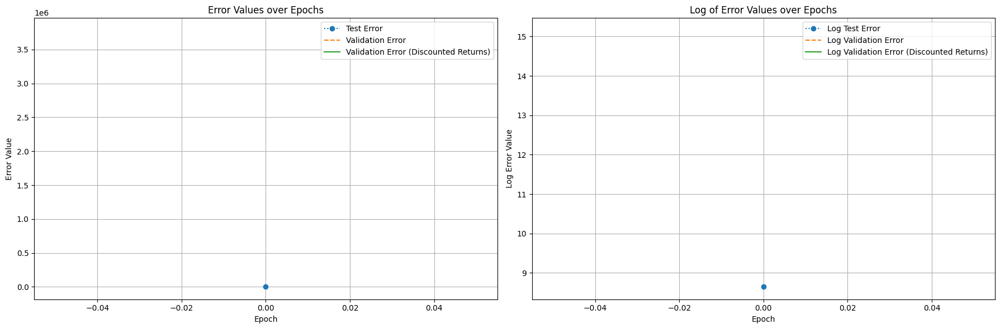

Training Progress:   0%|          | 1/200 [18:02<27:49:20, 503.32s/it, Test Error=329834.6872, Validation Error=329867.3688, Validation Error (Discounted)=86621172332.5824]

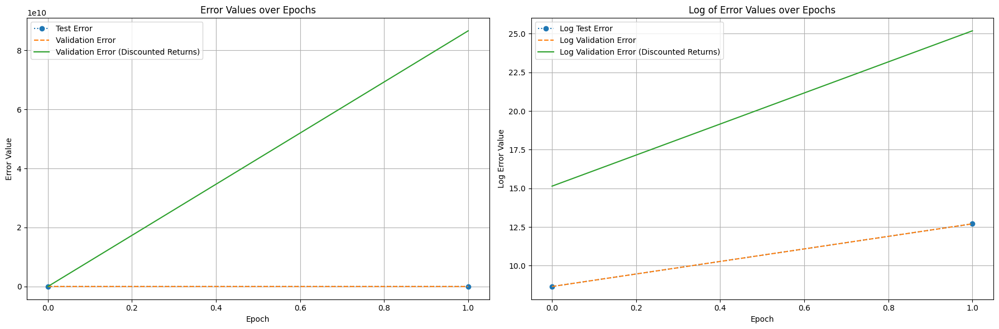

Training Progress:   1%|          | 2/200 [27:43<30:09:52, 548.45s/it, Test Error=6786512.9061, Validation Error=6787155.9183, Validation Error (Discounted)=44321901616319.8359]

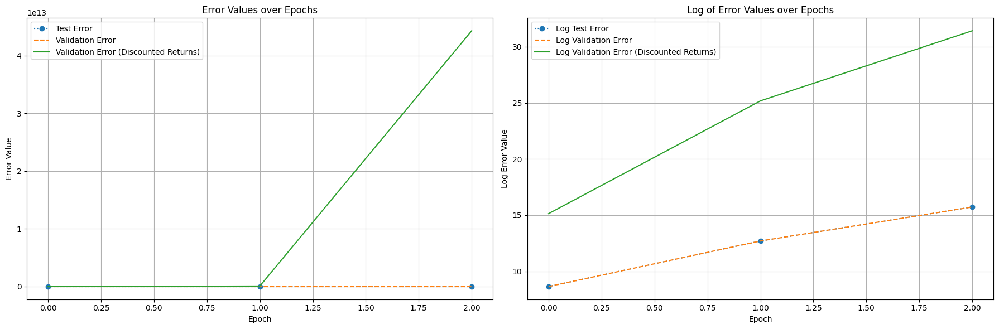

Training Progress:   2%|▏         | 3/200 [37:23<30:48:39, 563.04s/it, Test Error=44756171.4580, Validation Error=44760351.7348, Validation Error (Discounted)=1990353502382485.0000]

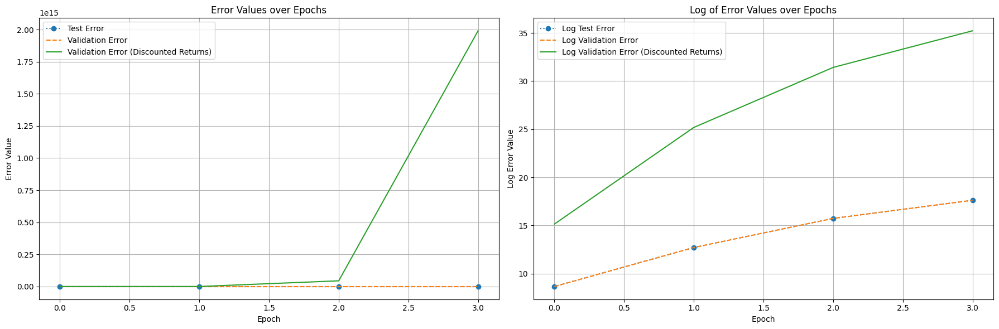

Training Progress:   2%|▏         | 4/200 [47:03<31:01:13, 569.76s/it, Test Error=201392444.7139, Validation Error=201410911.5008, Validation Error (Discounted)=40725257133724000.0000]

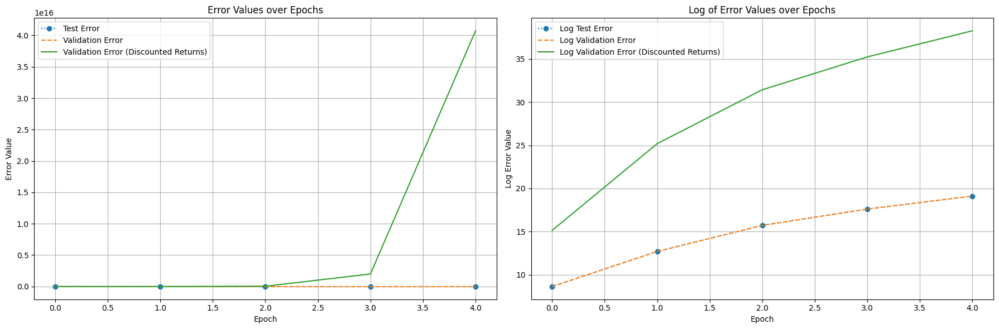

Training Progress:   2%|▎         | 5/200 [56:44<31:04:02, 573.55s/it, Test Error=651376978.4993, Validation Error=651436133.8750, Validation Error (Discounted)=427763640609226816.0000]

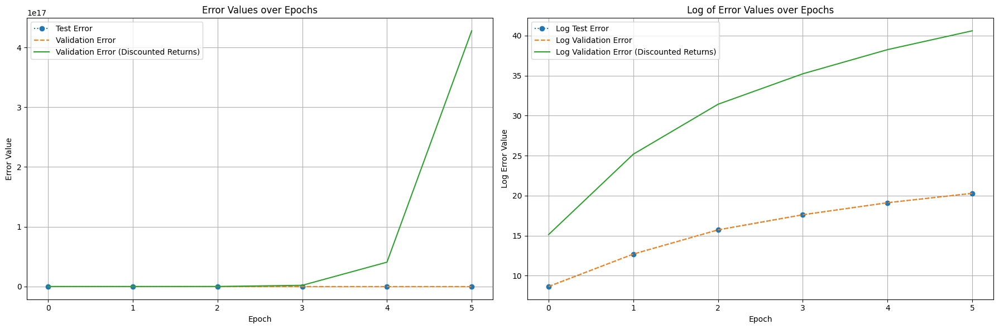

Training Progress:   3%|▎         | 6/200 [1:06:24<31:02:03, 575.90s/it, Test Error=1737557313.9024, Validation Error=1737713305.8168, Validation Error (Discounted)=3049506185683805696.0000]

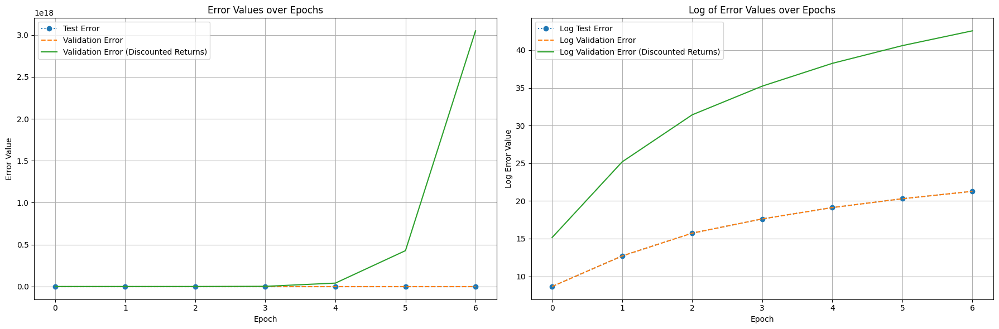

Training Progress:   4%|▎         | 7/200 [1:16:05<30:57:21, 577.42s/it, Test Error=3952266256.0919, Validation Error=3952616834.6347, Validation Error (Discounted)=15792688187572717568.0000]

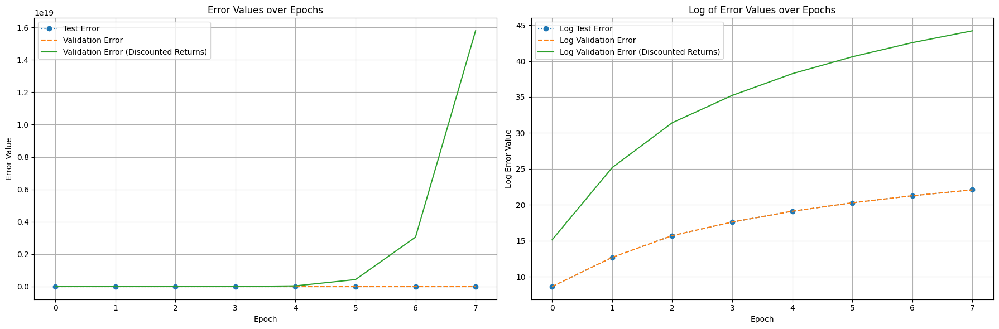

Training Progress:   4%|▍         | 8/200 [1:25:45<30:51:45, 578.67s/it, Test Error=7894997930.5914, Validation Error=7895698865.7952, Validation Error (Discounted)=63058505948073533440.0000]

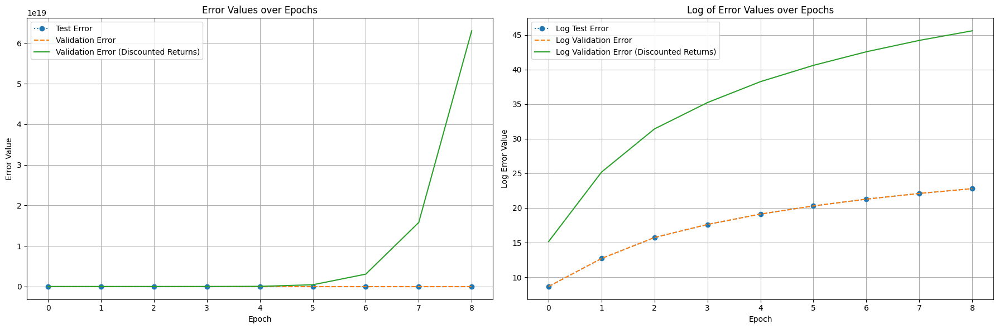

Training Progress:   4%|▍         | 9/200 [1:35:26<30:43:22, 579.07s/it, Test Error=14747207647.0961, Validation Error=14748505378.3380, Validation Error (Discounted)=220084752206371192832.0000]

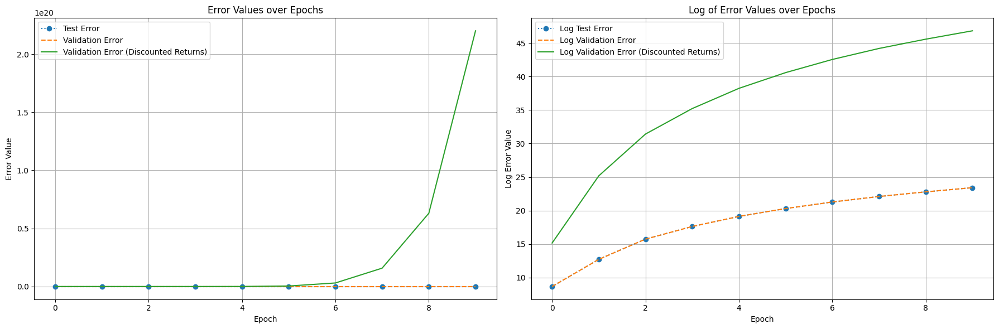

Training Progress:   5%|▌         | 10/200 [1:45:08<30:34:46, 579.40s/it, Test Error=25942529991.3213, Validation Error=25944799246.1453, Validation Error (Discounted)=681195072677913165824.0000]

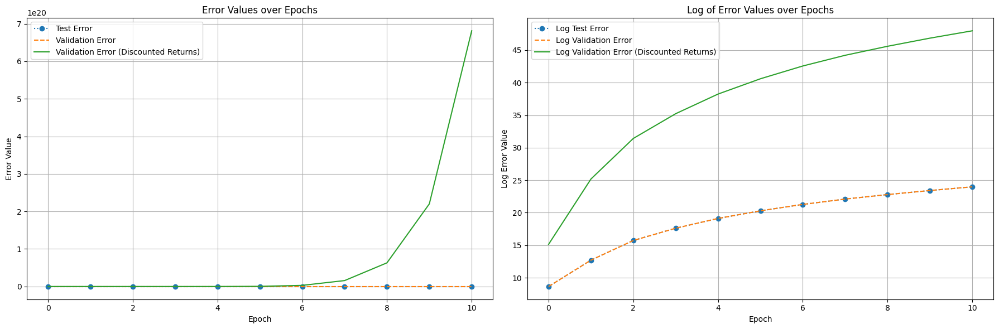

Training Progress:   6%|▌         | 11/200 [1:54:45<30:27:40, 580.22s/it, Test Error=42767762062.2704, Validation Error=42771486825.3755, Validation Error (Discounted)=1851481597339166834688.0000]

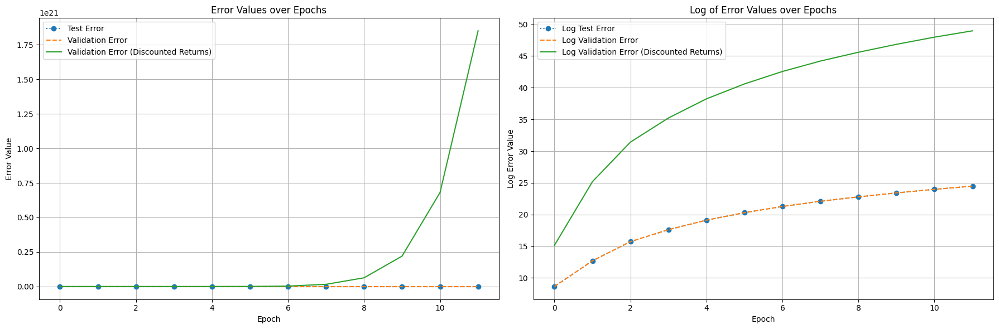

Training Progress:   6%|▌         | 12/200 [2:04:24<30:15:21, 579.37s/it, Test Error=67568511513.8374, Validation Error=67574377521.0385, Validation Error (Discounted)=4621930450027088445440.0000]

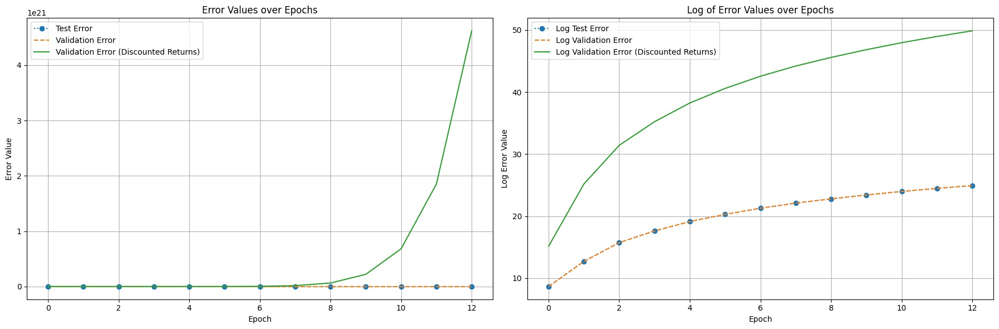

Training Progress:   6%|▋         | 13/200 [2:14:03<30:05:25, 579.28s/it, Test Error=102785248085.5978, Validation Error=102794145188.4524, Validation Error (Discounted)=10695624448059547582464.0000]

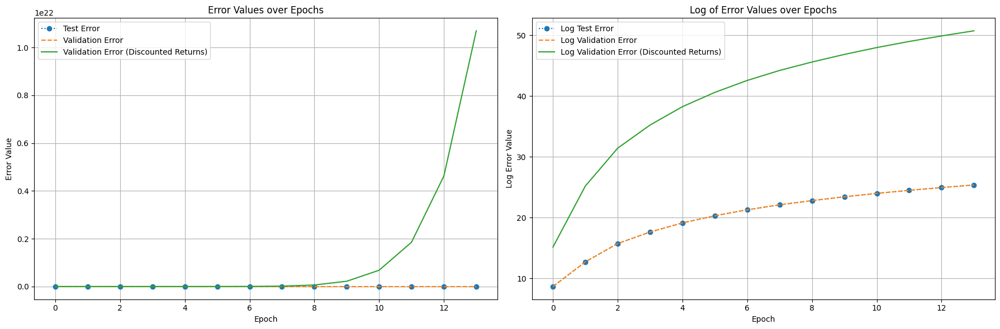

Training Progress:   7%|▋         | 14/200 [2:23:41<29:55:30, 579.20s/it, Test Error=152199162979.2732, Validation Error=152212295268.7499, Validation Error (Discounted)=23452035565702715801600.0000]

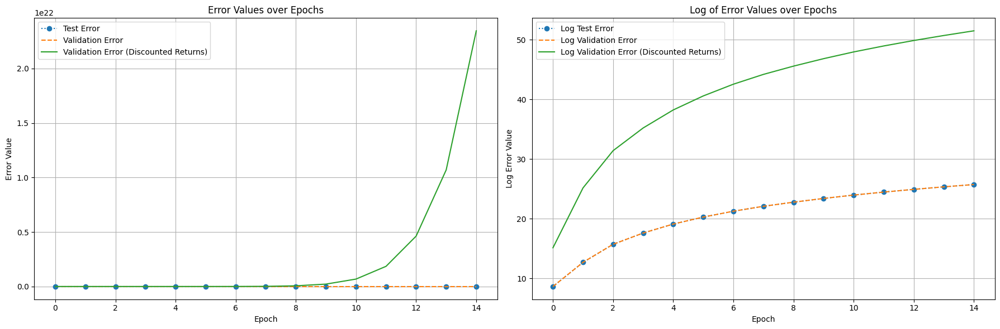

Training Progress:   8%|▊         | 15/200 [2:33:20<29:44:51, 578.87s/it, Test Error=219233387191.9617, Validation Error=219252253139.9776, Validation Error (Discounted)=48660316234122545594368.0000]

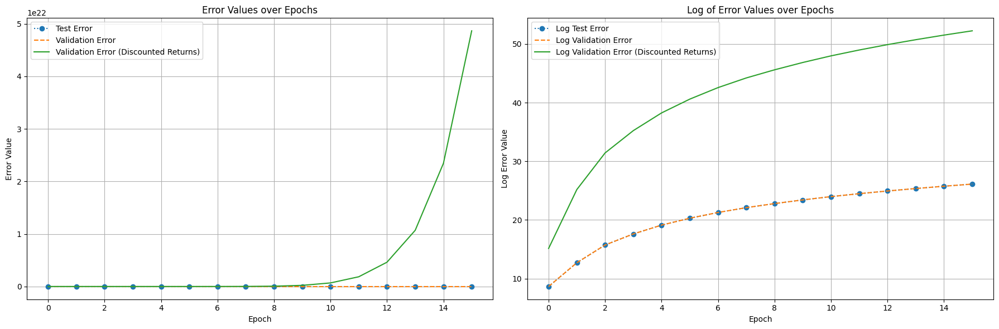

Training Progress:   8%|▊         | 16/200 [2:42:51<29:35:16, 578.89s/it, Test Error=309393680499.4566, Validation Error=309420268423.5883, Validation Error (Discounted)=96913653379671519133696.0000]

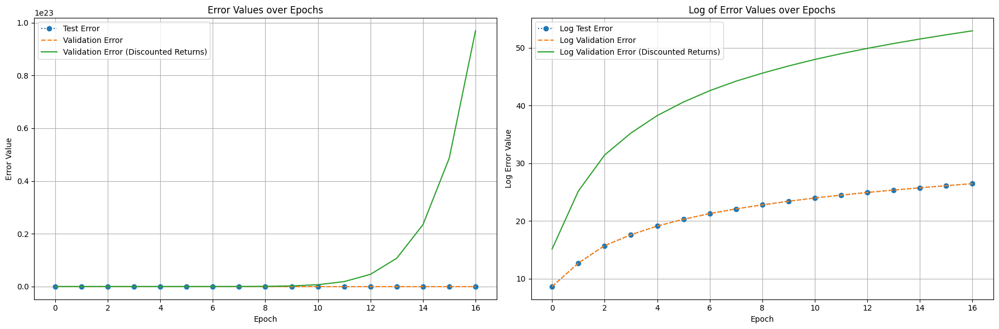

Training Progress:   8%|▊         | 17/200 [2:52:04<29:17:53, 576.36s/it, Test Error=428531058643.5260, Validation Error=428567786557.0480, Validation Error (Discounted)=185918934603630064435200.0000]

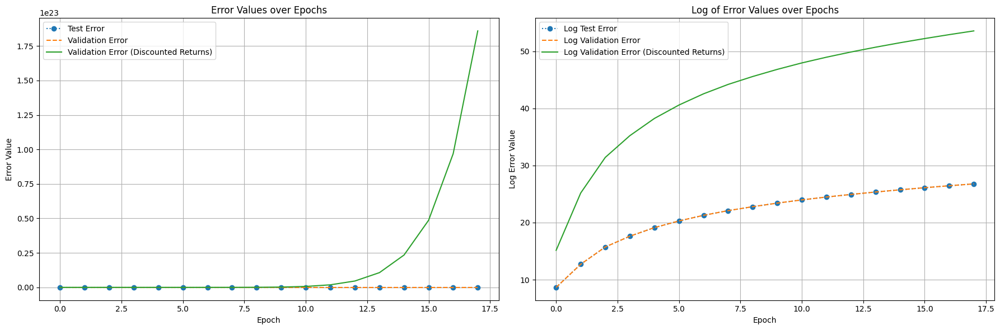

Training Progress:   9%|▉         | 18/200 [3:01:20<28:47:10, 569.40s/it, Test Error=583517512662.8213, Validation Error=583567397422.9760, Validation Error (Discounted)=344714374883781092835328.0000]

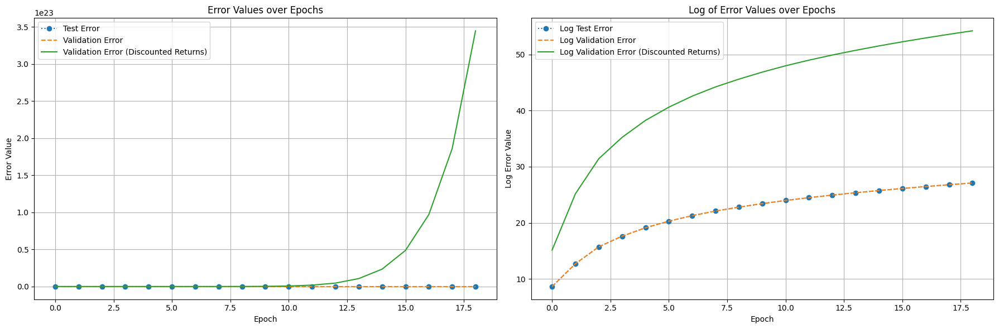

Training Progress:  10%|▉         | 19/200 [3:11:00<28:25:39, 565.41s/it, Test Error=782398190102.1760, Validation Error=782464921433.9182, Validation Error (Discounted)=619749120672274831114240.0000]

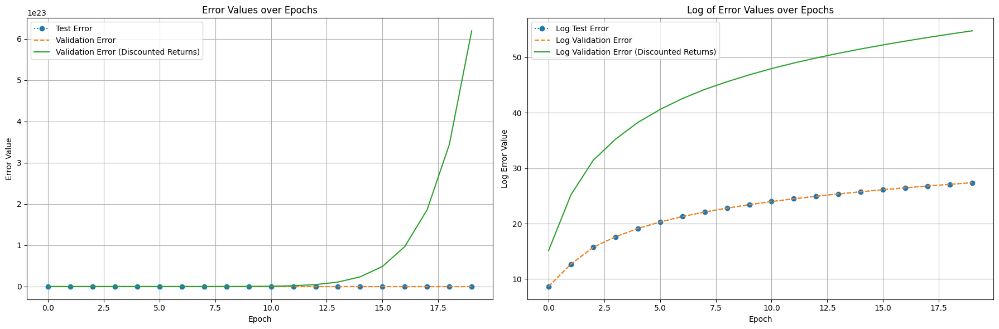

Training Progress:  10%|█         | 20/200 [3:20:41<28:29:13, 569.74s/it, Test Error=1033853279000.1836, Validation Error=1033941189664.4402, Validation Error (Discounted)=1082099419775989511618560.0000]

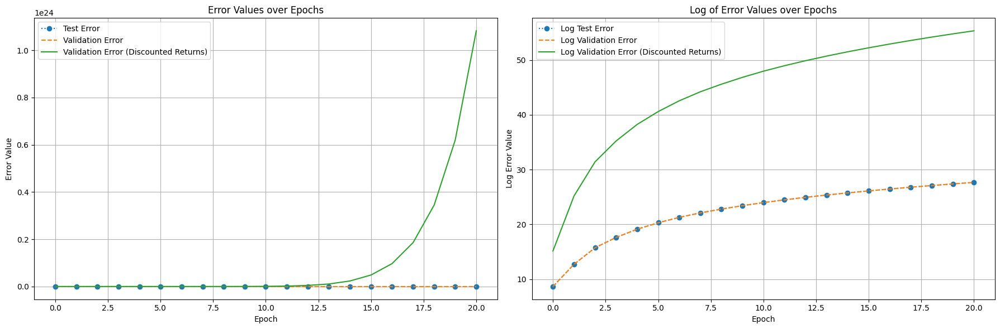

Training Progress:  10%|█         | 21/200 [3:26:16<28:30:19, 573.29s/it, Test Error=1343446653365.5635, Validation Error=1343560742626.0679, Validation Error (Discounted)=1827202257742392343920640.0000]

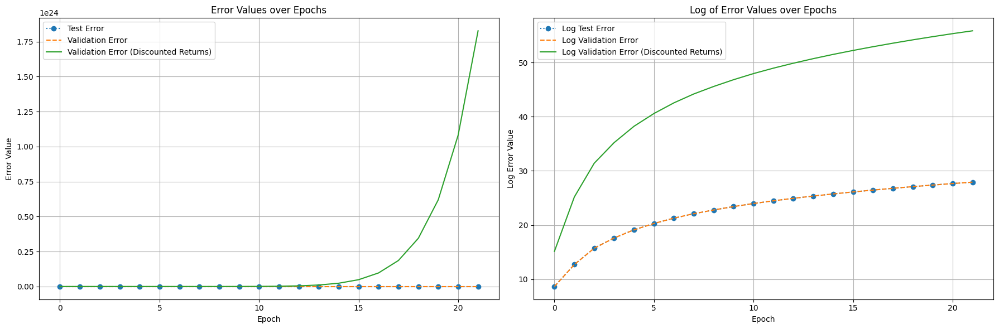

Training Progress:  11%|█         | 22/200 [3:31:40<24:47:54, 501.54s/it, Test Error=1732669489777.2720, Validation Error=1732816268220.7031, Validation Error (Discounted)=3039283404741912614141952.0000]

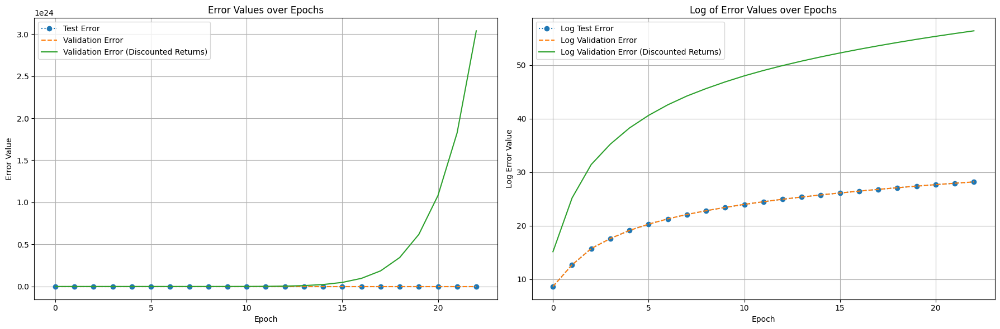

Training Progress:  12%|█▏        | 23/200 [3:37:04<22:02:23, 448.27s/it, Test Error=2213000007336.8032, Validation Error=2213187215123.9121, Validation Error (Discounted)=4957977267400027083374592.0000]

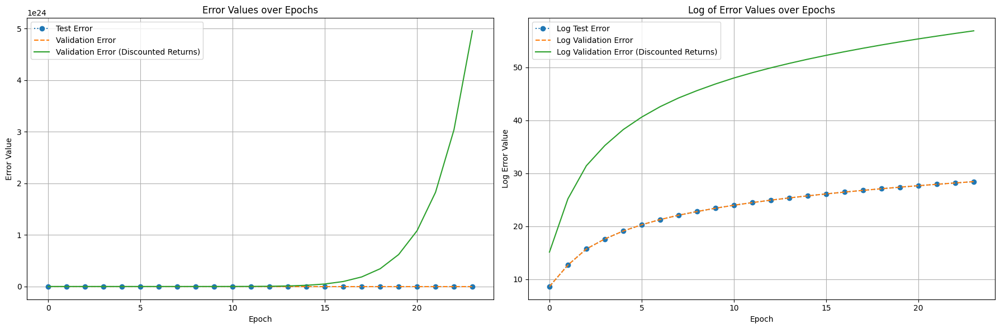

Training Progress:  12%|█▏        | 24/200 [3:42:27<20:05:37, 411.01s/it, Test Error=2789927467248.1401, Validation Error=2790163364621.4434, Validation Error (Discounted)=7879850085999361340211200.0000]

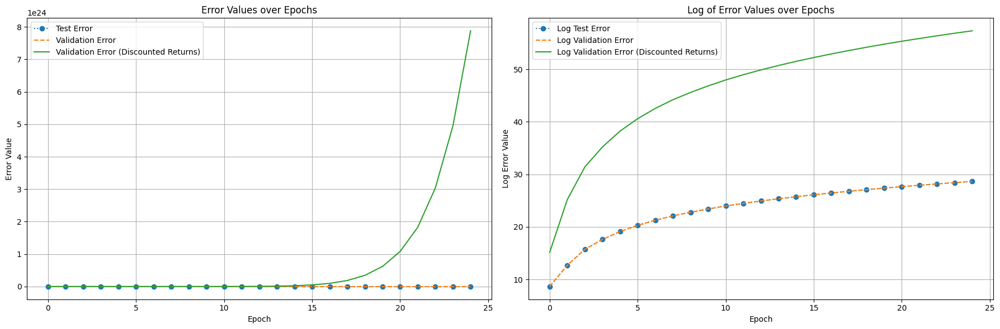

Training Progress:  12%|█▎        | 25/200 [3:47:52<18:42:18, 384.79s/it, Test Error=3489203361506.2632, Validation Error=3489497987427.7432, Validation Error (Discounted)=12324841404004953183223808.0000]

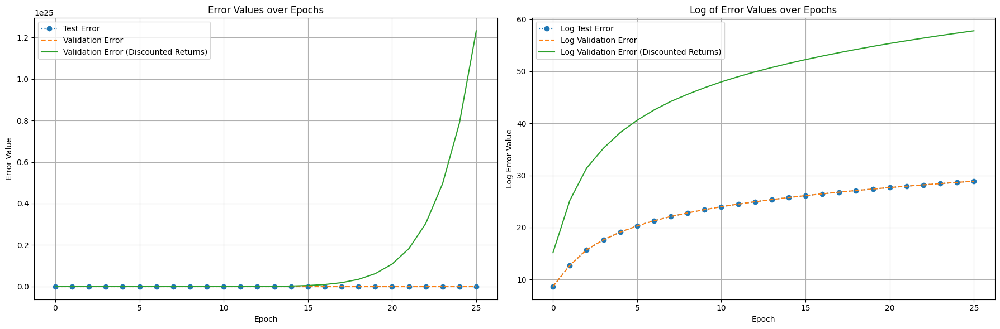

Training Progress:  13%|█▎        | 26/200 [3:53:17<17:43:38, 366.78s/it, Test Error=4325743177535.3608, Validation Error=4326108224478.1929, Validation Error (Discounted)=18942907551613539412082688.0000]

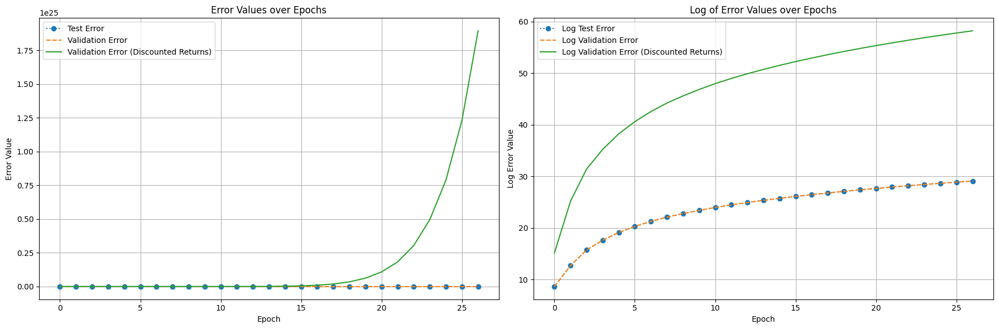

Training Progress:  14%|█▎        | 27/200 [3:58:41<17:00:55, 354.08s/it, Test Error=5333400670966.9385, Validation Error=5333850130246.1465, Validation Error (Discounted)=28795832175753347471507456.0000]

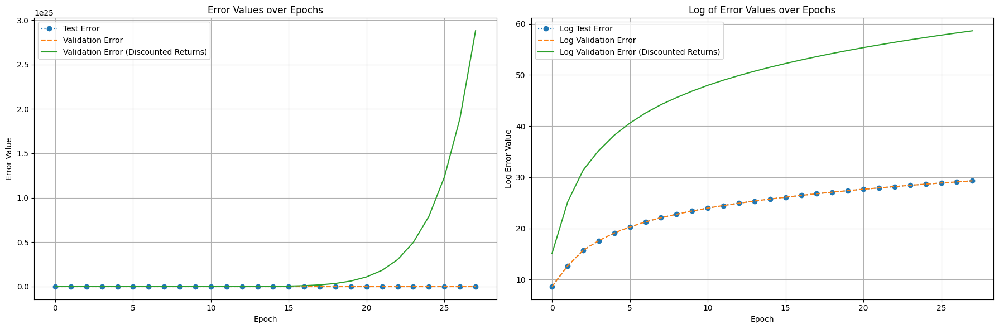

Training Progress:  14%|█▍        | 28/200 [4:04:05<16:29:36, 345.21s/it, Test Error=6529361092576.1699, Validation Error=6529910682193.1494, Validation Error (Discounted)=43157821309321081916489728.0000]

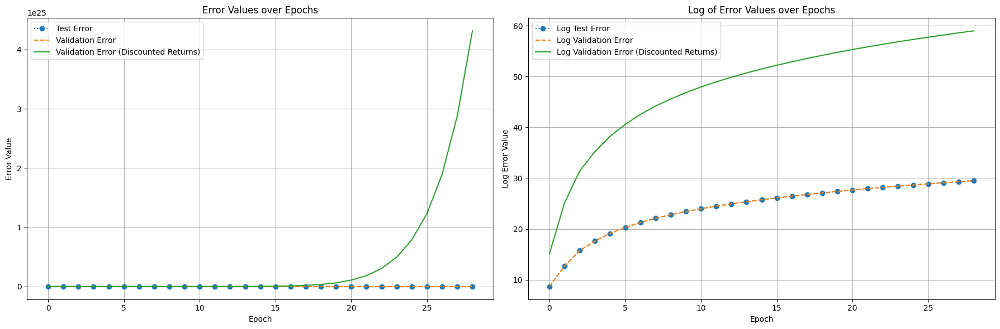

Training Progress:  14%|█▍        | 29/200 [4:09:29<16:05:51, 338.90s/it, Test Error=7939620680922.2451, Validation Error=7940288312071.5361, Validation Error (Discounted)=63814028357296487640596480.0000]

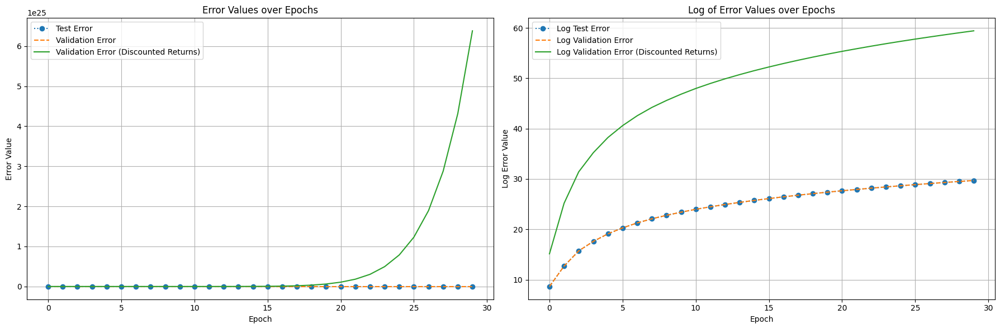

Training Progress:  15%|█▌        | 30/200 [4:14:54<15:47:10, 334.29s/it, Test Error=9585847846960.8672, Validation Error=9586653840742.1602, Validation Error (Discounted)=93019491295380083392380928.0000]

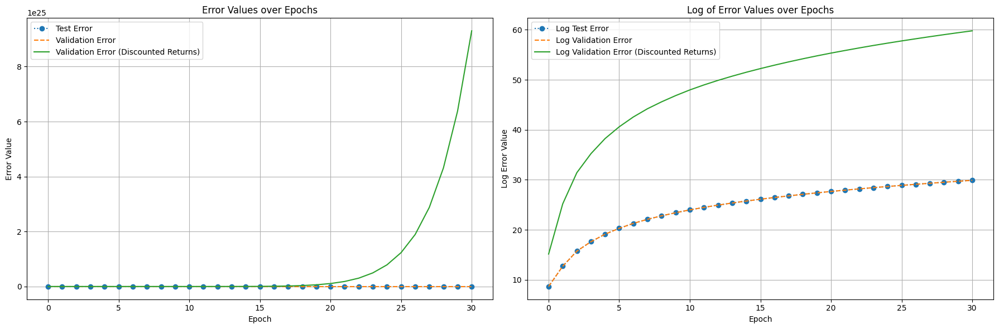

Training Progress:  16%|█▌        | 31/200 [4:20:17<15:33:30, 331.42s/it, Test Error=11523744356669.6641, Validation Error=11524712602402.3379, Validation Error (Discounted)=134429121813448412826173440.0000]

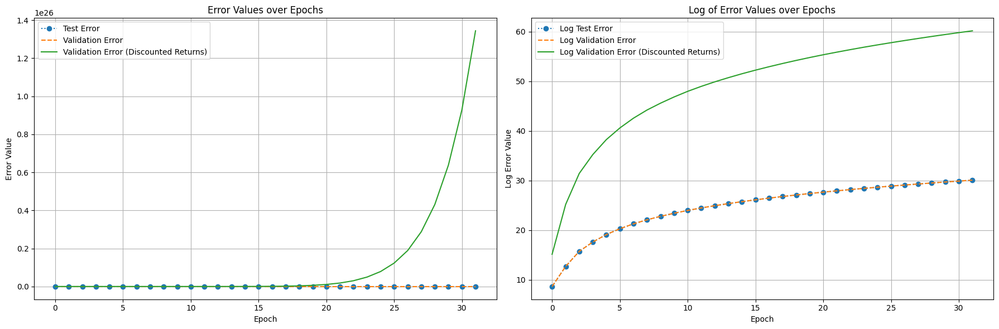

Training Progress:  16%|█▌        | 32/200 [4:25:41<15:21:18, 329.04s/it, Test Error=13814821401169.1484, Validation Error=13815980659626.2012, Validation Error (Discounted)=193194063876365230612152320.0000]

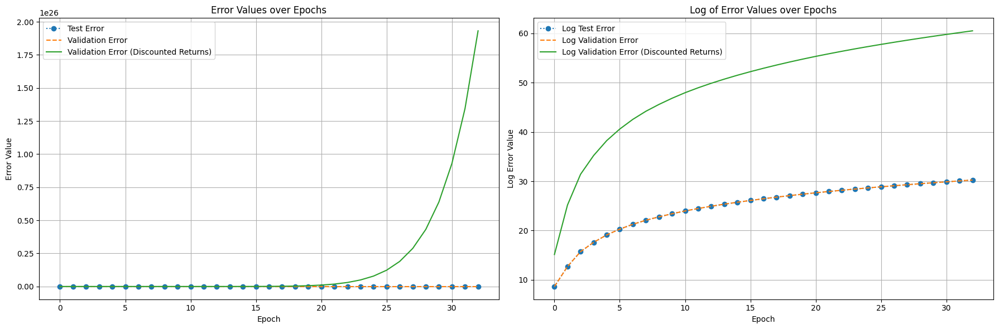

Training Progress:  16%|█▋        | 33/200 [4:31:07<15:11:30, 327.49s/it, Test Error=16433914241665.8711, Validation Error=16435292658643.2578, Validation Error (Discounted)=273389202535946093619838976.0000]

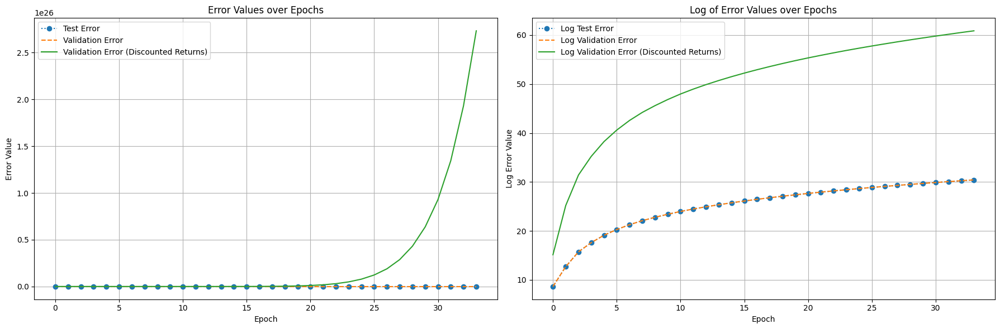

Training Progress:  17%|█▋        | 34/200 [4:36:32<15:04:45, 327.02s/it, Test Error=19487584907266.2461, Validation Error=19489218197579.7188, Validation Error (Discounted)=384422492008792982661627904.0000]

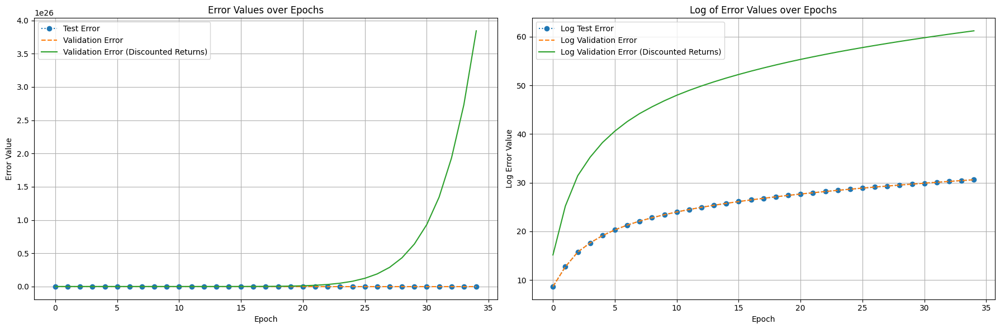

Training Progress:  18%|█▊        | 35/200 [4:41:57<14:57:52, 326.50s/it, Test Error=22992039285997.5781, Validation Error=22993965825951.5352, Validation Error (Discounted)=535121364223771010052128768.0000]

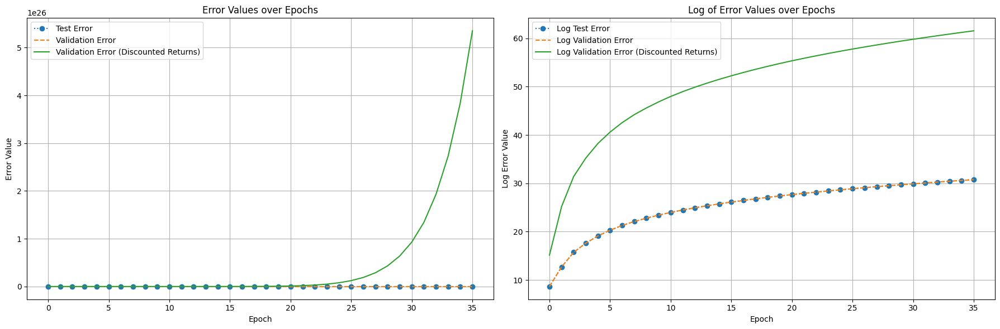

Training Progress:  18%|█▊        | 36/200 [4:47:21<14:50:57, 325.96s/it, Test Error=27000090532266.6289, Validation Error=27002352002994.5234, Validation Error (Discounted)=737942766093599481148735488.0000]

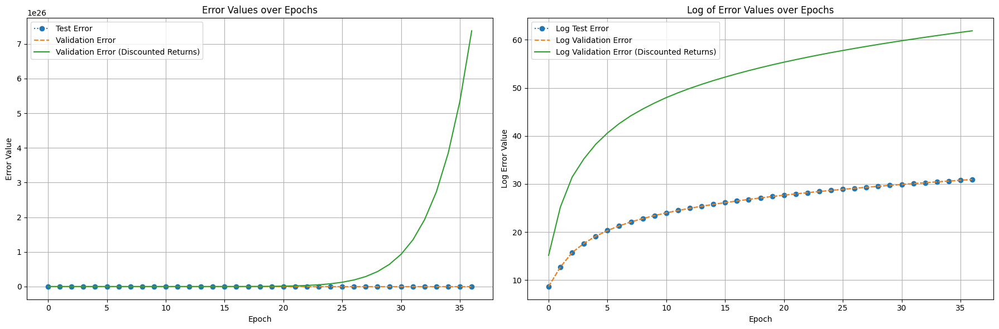

Training Progress:  18%|█▊        | 37/200 [4:52:45<14:43:42, 325.29s/it, Test Error=31626574881466.1094, Validation Error=31629221348428.9648, Validation Error (Discounted)=1012494663144708260501651456.0000]

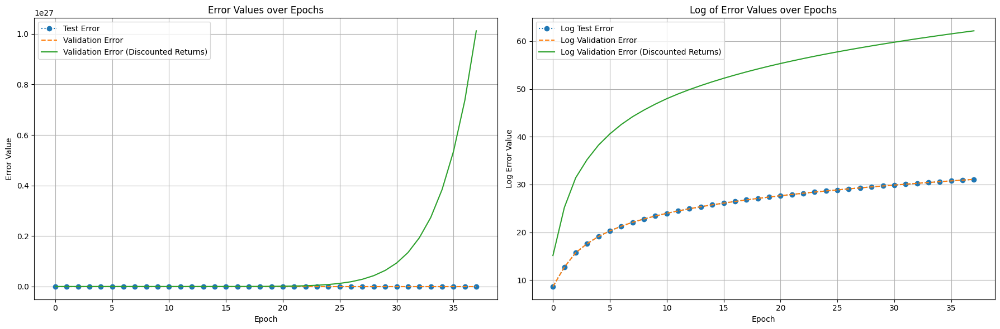

Training Progress:  19%|█▉        | 38/200 [4:58:26<14:37:19, 324.94s/it, Test Error=36882428379940.1406, Validation Error=36885511448231.7812, Validation Error (Discounted)=1376972015626616824349589504.0000]

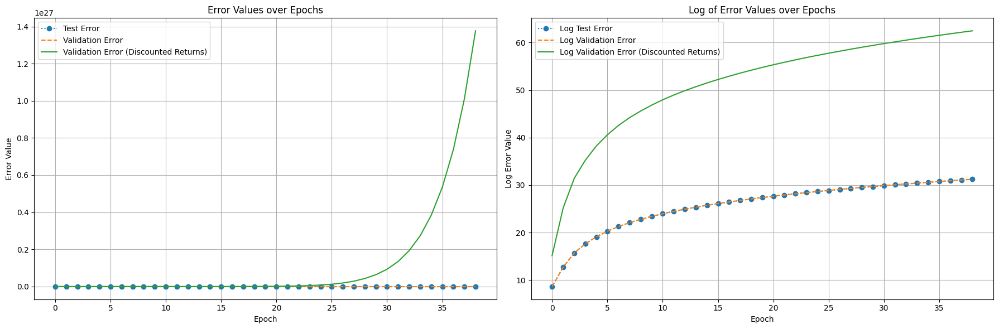

Training Progress:  20%|█▉        | 39/200 [5:04:36<14:45:21, 329.94s/it, Test Error=42852402998009.0391, Validation Error=42855982686776.4453, Validation Error (Discounted)=1858806302827164431967846400.0000]

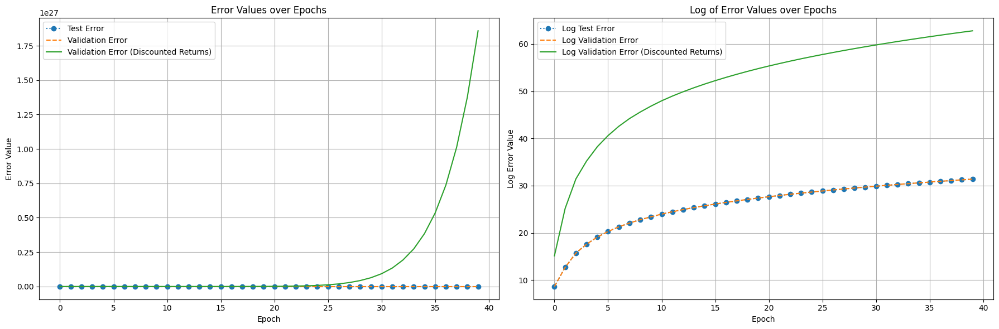

Training Progress:  20%|██        | 40/200 [5:10:51<15:11:27, 341.80s/it, Test Error=49590624216874.6094, Validation Error=49594763779913.4141, Validation Error (Discounted)=2489297998882919037565665280.0000]

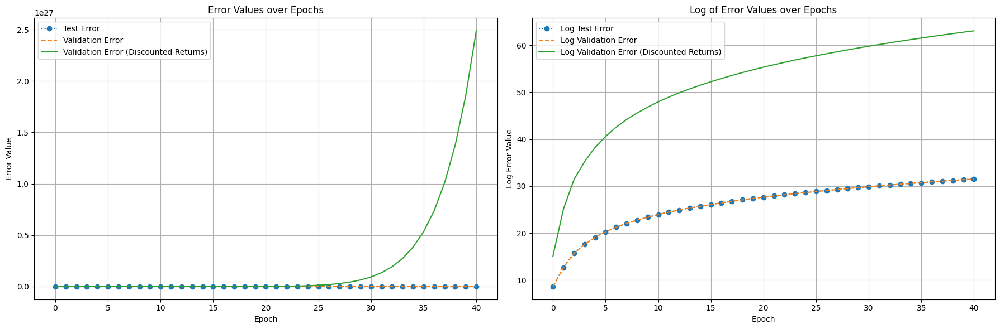

Training Progress:  20%|██        | 41/200 [5:16:58<15:32:10, 351.77s/it, Test Error=57201900528406.6719, Validation Error=57206672811692.0781, Validation Error (Discounted)=3312039665052211797093777408.0000]

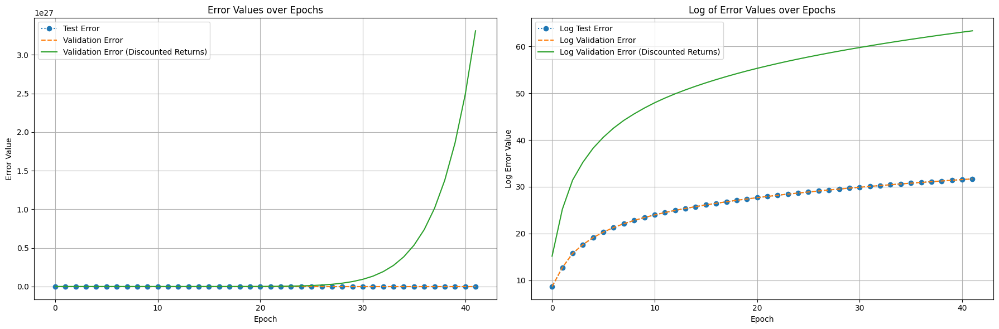

Training Progress:  21%|██        | 42/200 [5:23:13<15:38:51, 356.53s/it, Test Error=65740398793553.9375, Validation Error=65745882587333.0312, Validation Error (Discounted)=4374589443221783861771894784.0000]

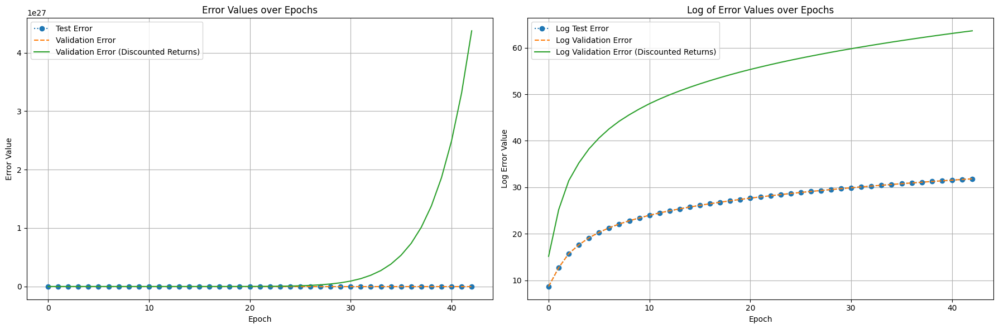

Training Progress:  22%|██▏       | 43/200 [5:29:25<15:47:18, 362.03s/it, Test Error=75303900057813.3438, Validation Error=75310179613071.8750, Validation Error (Discounted)=5739906983551541120421855232.0000]

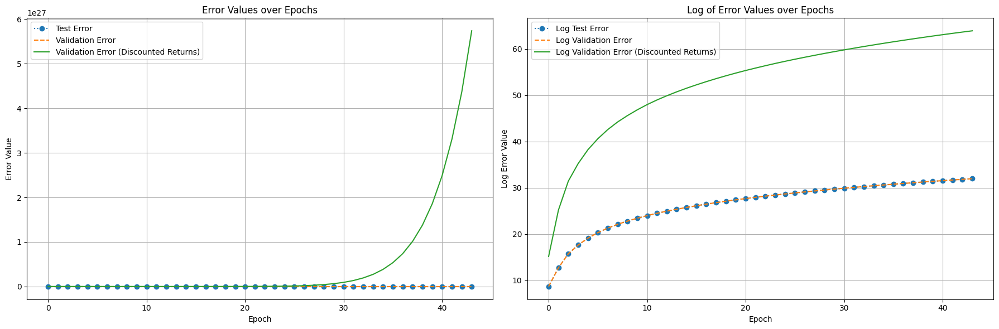

Training Progress:  22%|██▏       | 44/200 [5:35:30<15:49:06, 365.04s/it, Test Error=85952180745743.9531, Validation Error=85959345760608.9062, Validation Error (Discounted)=7477975995363534493789978624.0000]

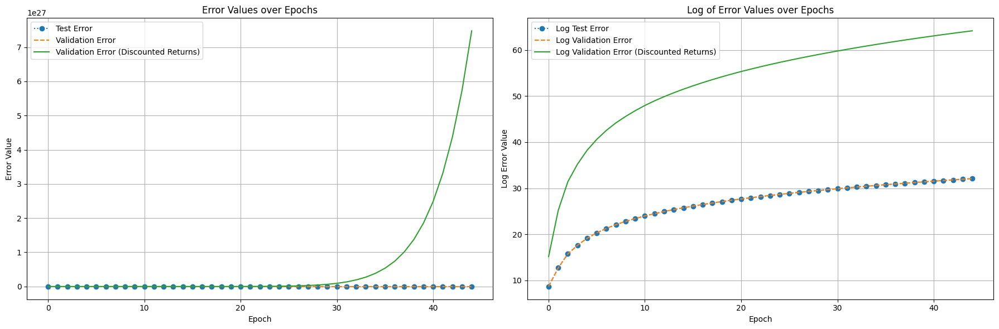

Training Progress:  22%|██▎       | 45/200 [5:41:46<15:42:53, 364.99s/it, Test Error=98044760288620.6562, Validation Error=98052926234227.7812, Validation Error (Discounted)=9730116679695090450071289856.0000]

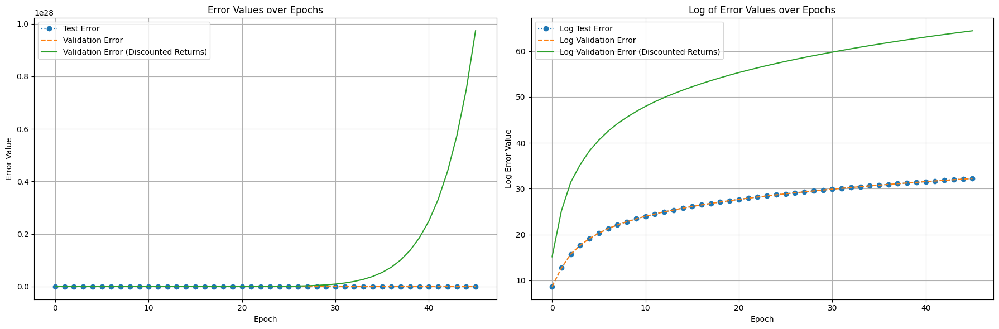

Training Progress:  23%|██▎       | 46/200 [5:48:00<15:45:12, 368.26s/it, Test Error=111280840369005.7656, Validation Error=111290109369123.9062, Validation Error (Discounted)=12534573461857660917927378944.0000]

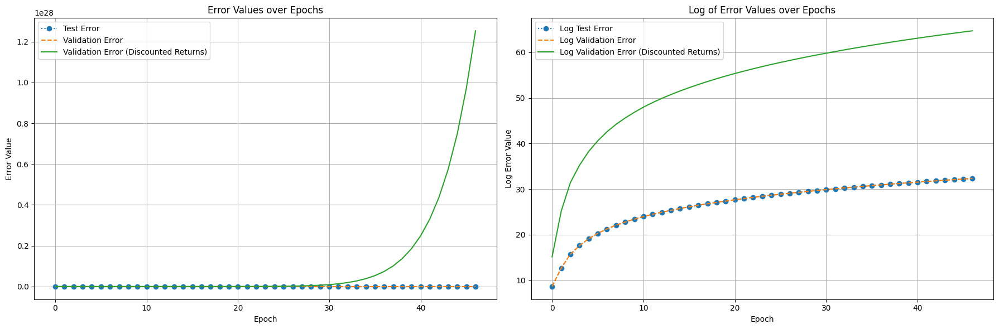

Training Progress:  24%|██▎       | 47/200 [5:54:13<15:43:23, 369.96s/it, Test Error=125987081432491.5312, Validation Error=125997572599215.4375, Validation Error (Discounted)=16066331436554195770938490880.0000]

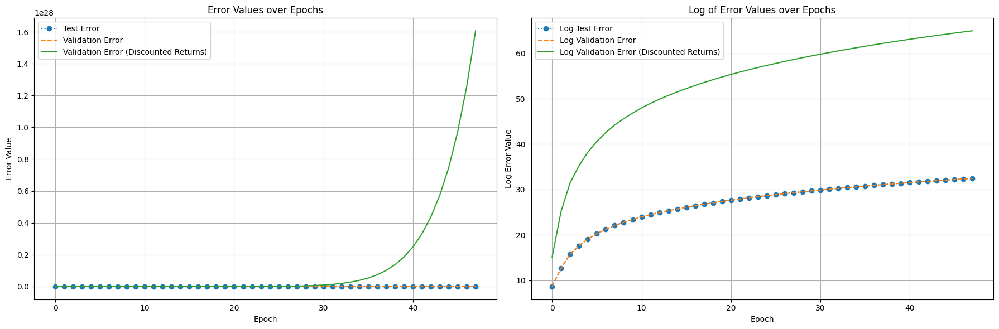

Training Progress:  24%|██▍       | 48/200 [6:00:24<15:39:34, 370.89s/it, Test Error=142322214754067.8750, Validation Error=142334062153804.2500, Validation Error (Discounted)=20502374982845508004159160320.0000]

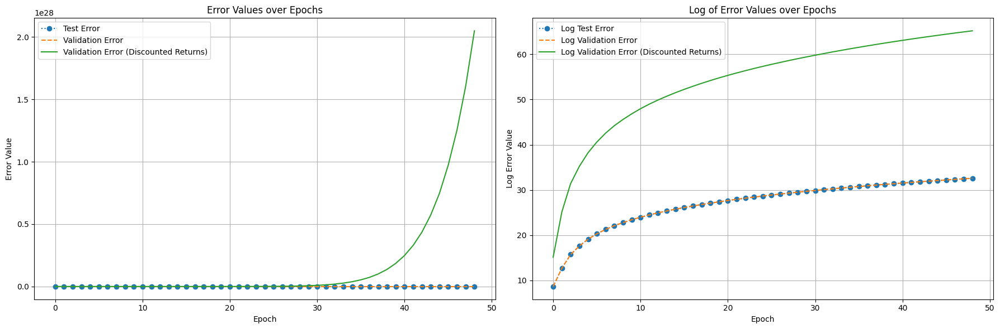

Training Progress:  24%|██▍       | 49/200 [6:06:34<15:33:21, 370.87s/it, Test Error=160435437122990.7188, Validation Error=160448790481624.4375, Validation Error (Discounted)=26052917929830225643009212416.0000]

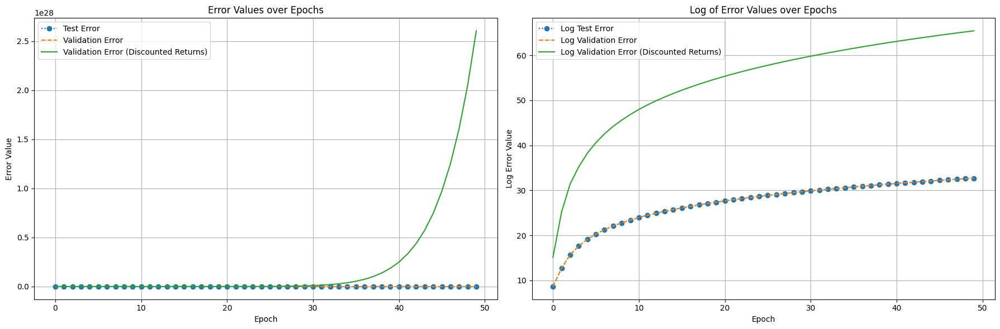

Training Progress:  25%|██▌       | 50/200 [6:12:38<15:26:37, 370.65s/it, Test Error=180466018350069.7812, Validation Error=180481026605085.2812, Validation Error (Discounted)=32964361101230757429152579584.0000]

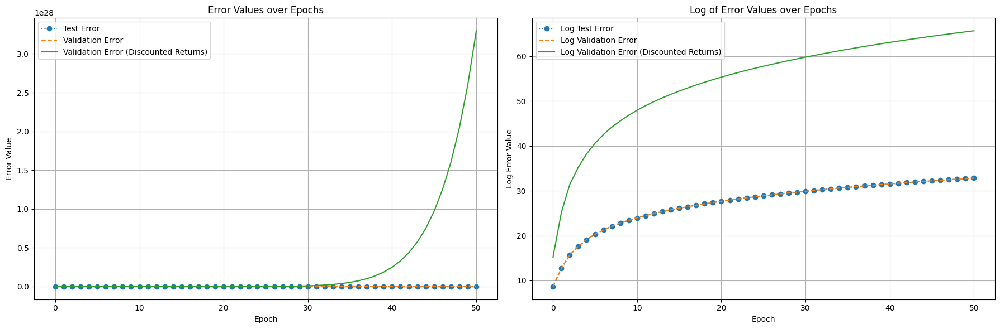

Training Progress:  26%|██▌       | 51/200 [6:18:47<15:15:07, 368.50s/it, Test Error=202361967699968.6250, Validation Error=202378801284271.0000, Validation Error (Discounted)=41448657875119888031805341696.0000]

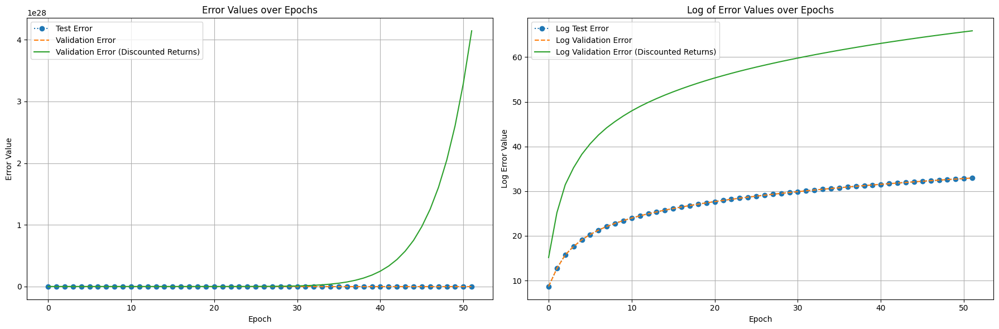

Training Progress:  26%|██▌       | 52/200 [6:24:55<15:09:49, 368.85s/it, Test Error=226462836226084.6562, Validation Error=226481668208528.6562, Validation Error (Discounted)=51909313069896883453644767232.0000]

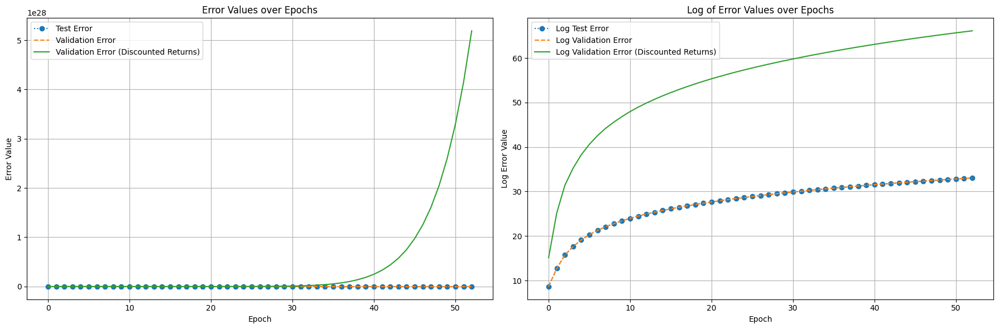

Training Progress:  26%|██▋       | 53/200 [6:31:03<15:03:03, 368.59s/it, Test Error=253098621012378.9062, Validation Error=253119662943816.1562, Validation Error (Discounted)=64838008037747791888962813952.0000]

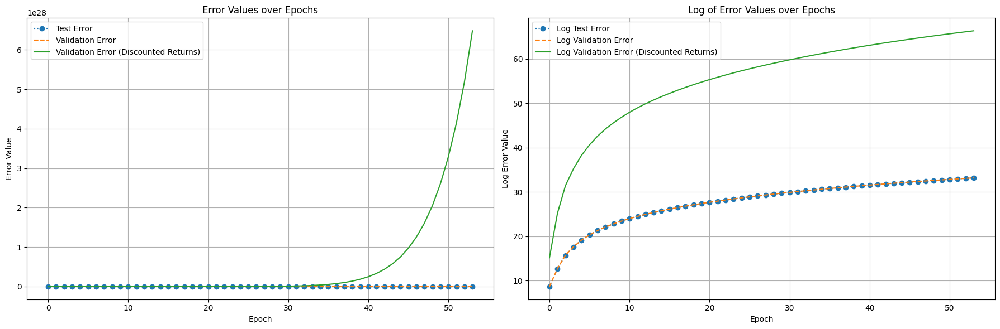

Training Progress:  27%|██▋       | 54/200 [6:37:08<14:56:16, 368.33s/it, Test Error=282153590034612.5625, Validation Error=282177037884251.7500, Validation Error (Discounted)=80578659548886346575122530304.0000]

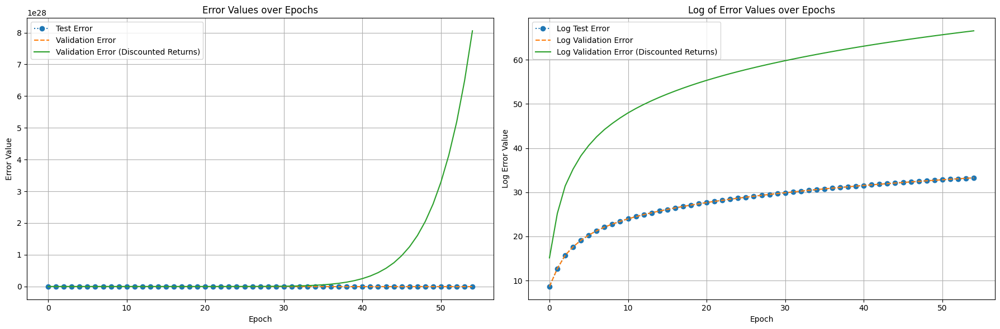

Training Progress:  28%|██▊       | 55/200 [6:43:19<14:48:06, 367.49s/it, Test Error=314127122754757.5000, Validation Error=314153215324278.6250, Validation Error (Discounted)=99875117469256658640972021760.0000]

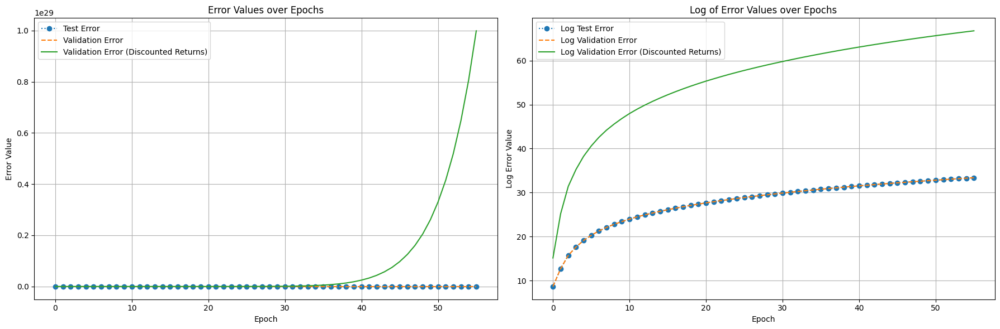

Training Progress:  28%|██▊       | 56/200 [6:49:30<14:44:11, 368.41s/it, Test Error=348710340043462.1875, Validation Error=348739299557091.3125, Validation Error (Discounted)=123076461081678460276504002560.0000]

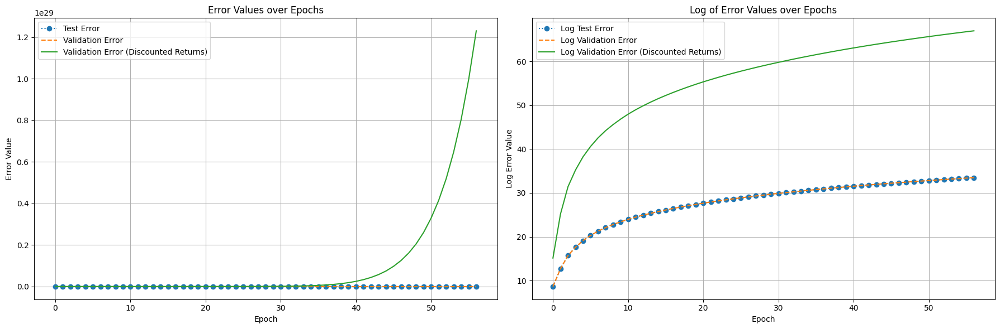

Training Progress:  28%|██▊       | 57/200 [6:55:42<14:39:40, 369.10s/it, Test Error=386692607713144.3125, Validation Error=386724707760959.0625, Validation Error (Discounted)=151347670056764541908505591808.0000]

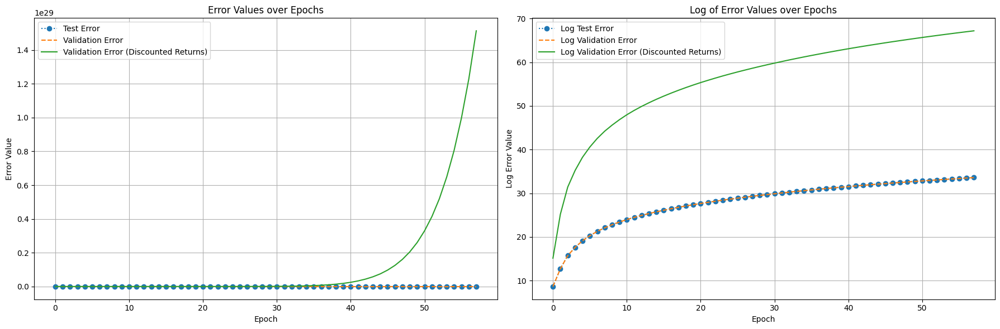

Training Progress:  29%|██▉       | 58/200 [7:01:53<14:35:30, 369.93s/it, Test Error=427961269821382.3750, Validation Error=427996783685719.0000, Validation Error (Discounted)=185375861976486886261179547648.0000]

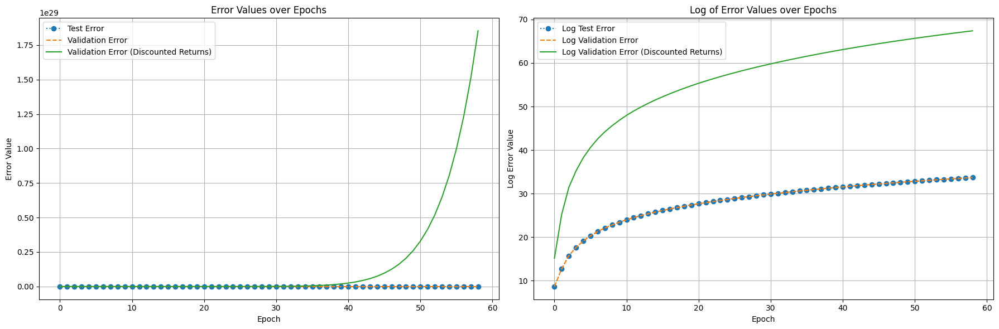

Training Progress:  30%|██▉       | 59/200 [7:07:57<14:30:27, 370.41s/it, Test Error=472738516259114.8750, Validation Error=472777730314224.8750, Validation Error (Discounted)=226195098938412850359767662592.0000]

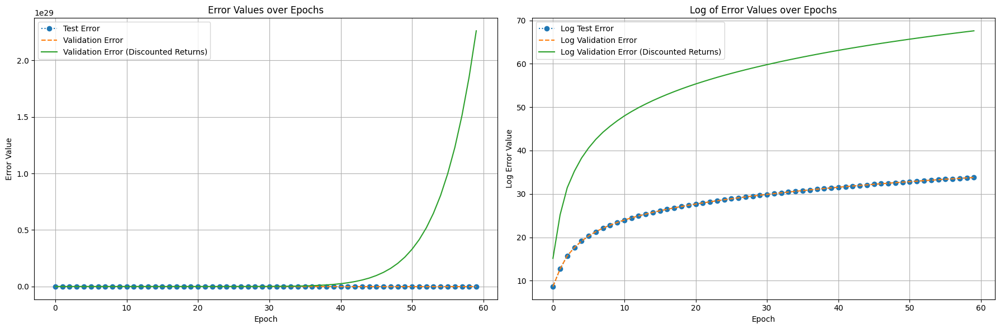

Training Progress:  30%|███       | 60/200 [7:13:59<14:19:34, 368.39s/it, Test Error=521341933478407.2500, Validation Error=521385175876213.5625, Validation Error (Discounted)=275096537602056575296873693184.0000]

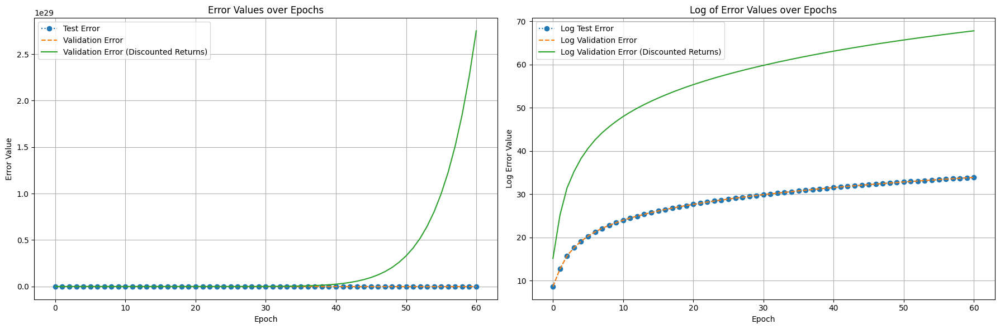

Training Progress:  30%|███       | 61/200 [7:20:02<14:09:04, 366.50s/it, Test Error=573857730773557.1250, Validation Error=573905315560459.7500, Validation Error (Discounted)=333308507518820231808460783616.0000]

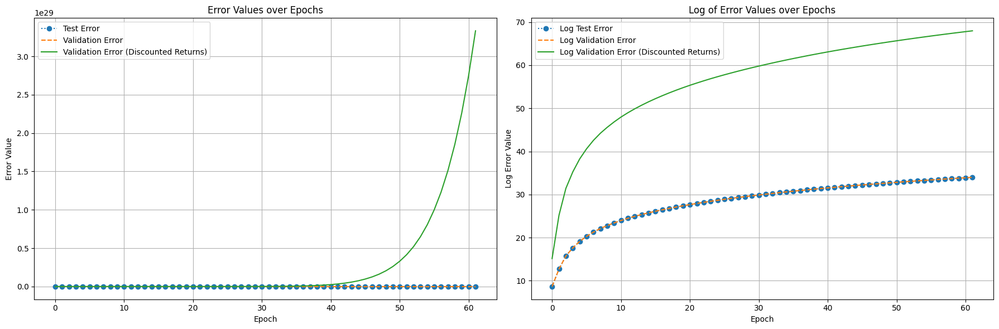

Training Progress:  31%|███       | 62/200 [7:26:19<14:00:35, 365.47s/it, Test Error=631756190206286.7500, Validation Error=631808518197218.3750, Validation Error (Discounted)=403955696882332136878494449664.0000]

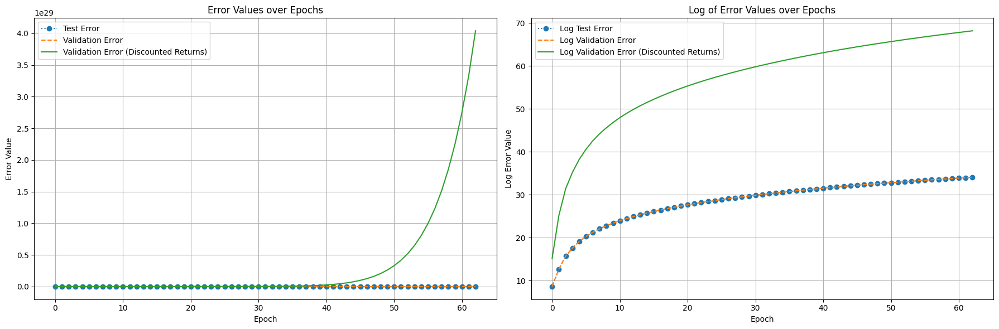

Training Progress:  32%|███▏      | 63/200 [7:32:20<14:02:38, 369.04s/it, Test Error=693292856332624.3750, Validation Error=693350283243277.0000, Validation Error (Discounted)=486481443436747072533048590336.0000]

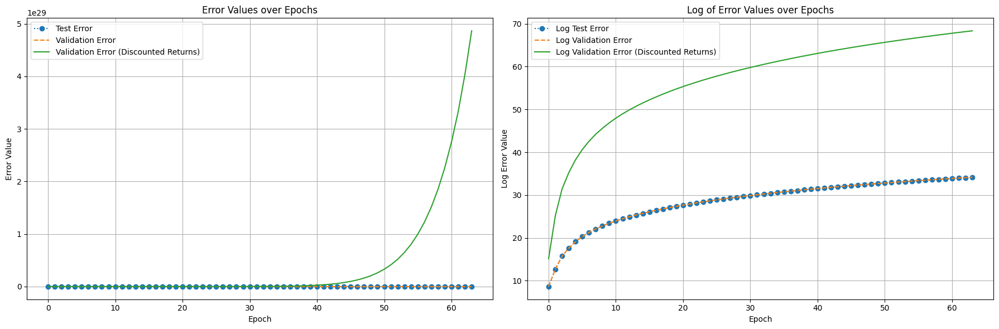

Training Progress:  32%|███▏      | 64/200 [7:38:29<13:50:55, 366.58s/it, Test Error=760079778555917.5000, Validation Error=760142694817994.5000, Validation Error (Discounted)=584723954891299624932234756096.0000]

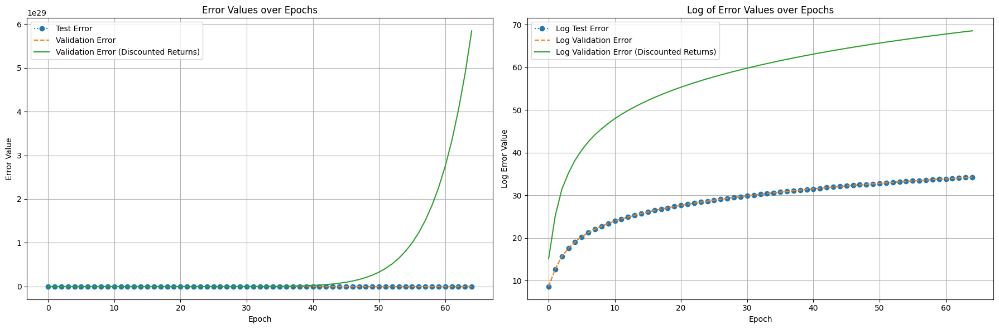

Training Progress:  32%|███▎      | 65/200 [7:44:33<13:46:29, 367.33s/it, Test Error=831186773539465.8750, Validation Error=831255587069952.2500, Validation Error (Discounted)=699239276493250044937958850560.0000]

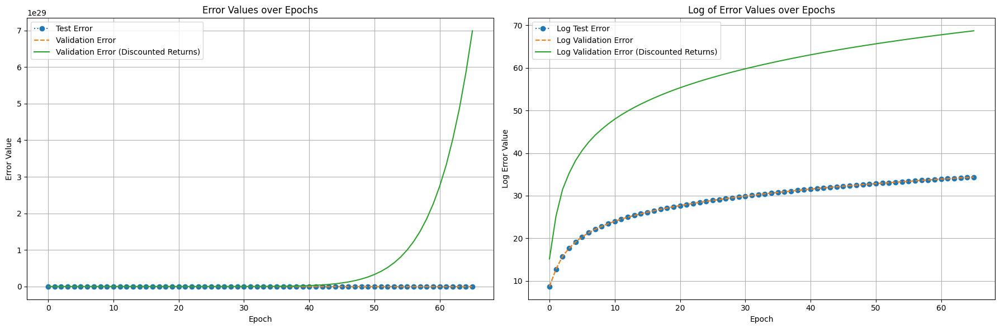

Training Progress:  33%|███▎      | 66/200 [7:50:45<13:37:40, 366.13s/it, Test Error=908205643213206.3750, Validation Error=908280826605612.8750, Validation Error (Discounted)=834832333522308110177875787776.0000]

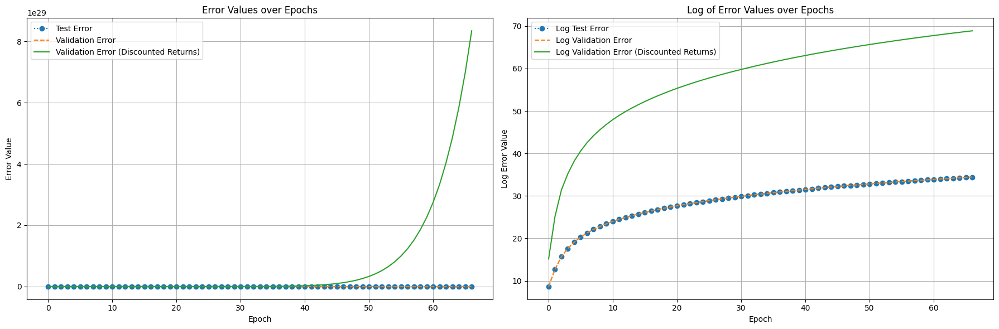

Training Progress:  34%|███▎      | 67/200 [7:56:49<13:35:34, 367.93s/it, Test Error=991431932417888.0000, Validation Error=991513997757030.3750, Validation Error (Discounted)=994847119294657512346218397696.0000]

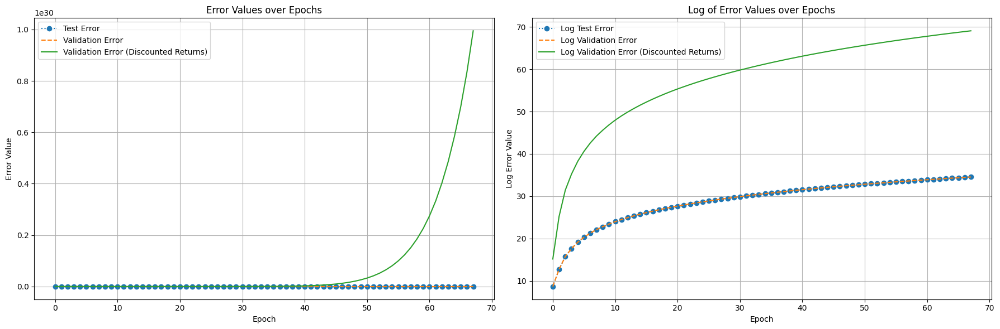

Training Progress:  34%|███▍      | 68/200 [8:03:01<13:27:12, 366.91s/it, Test Error=1081713549599637.6250, Validation Error=1081803033189335.5000, Validation Error (Discounted)=1184278686049060441960466087936.0000]

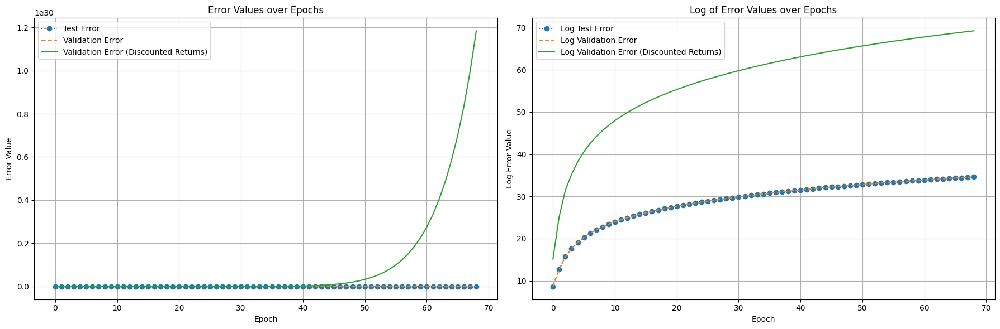

Training Progress:  34%|███▍      | 69/200 [8:09:08<13:24:23, 368.42s/it, Test Error=1178110201862758.7500, Validation Error=1178207628046302.0000, Validation Error (Discounted)=1404749862244409787126439215104.0000]

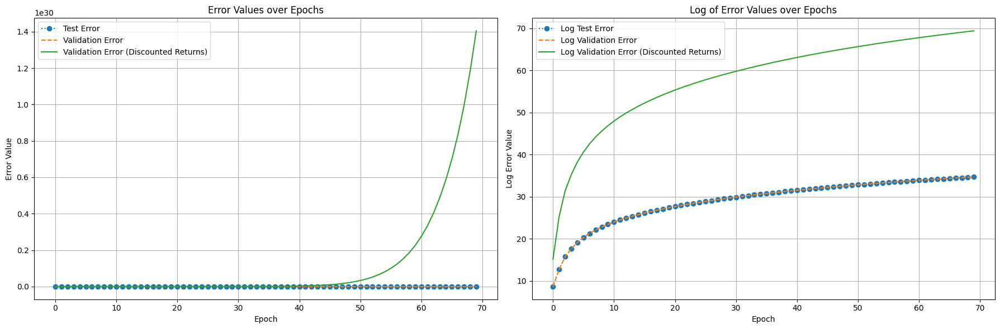

Training Progress:  35%|███▌      | 70/200 [8:15:16<13:17:14, 367.95s/it, Test Error=1280582465906652.7500, Validation Error=1280688363480885.2500, Validation Error (Discounted)=1659746793975394531900041199616.0000]

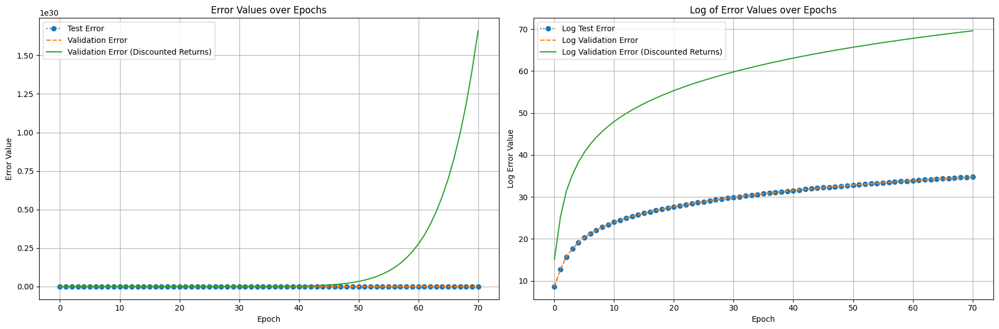

Training Progress:  36%|███▌      | 71/200 [8:21:18<13:11:22, 368.08s/it, Test Error=1391654307934812.0000, Validation Error=1391769331868633.2500, Validation Error (Discounted)=1960143128392370718947611246592.0000]

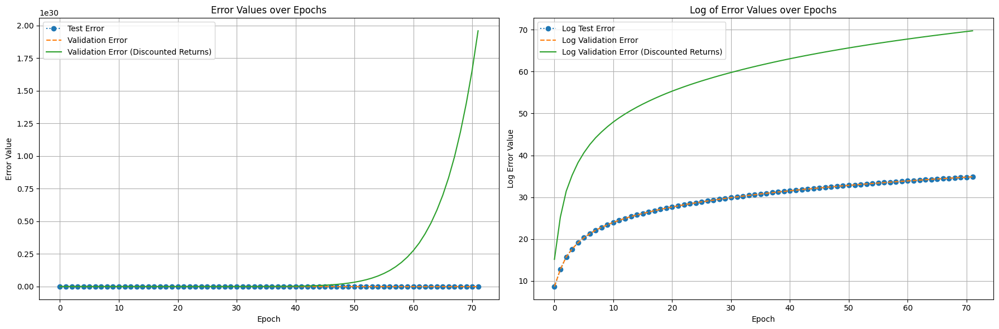

Training Progress:  36%|███▌      | 72/200 [8:27:22<13:01:22, 366.27s/it, Test Error=1509968045128296.7500, Validation Error=1510092791139450.2500, Validation Error (Discounted)=2307590722116727663403093458944.0000]

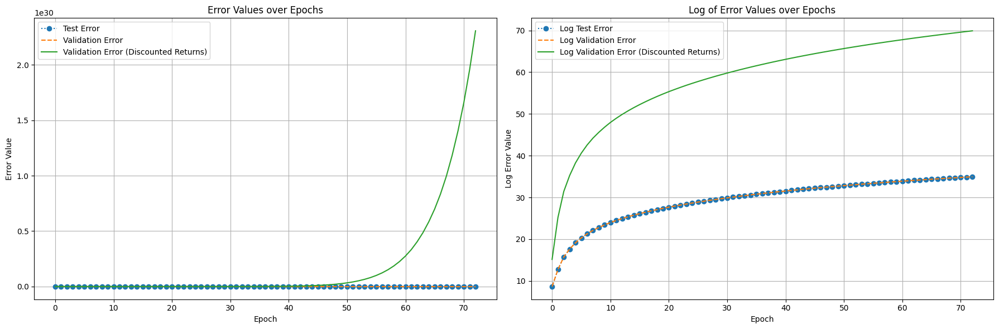

Training Progress:  36%|███▋      | 73/200 [8:33:34<12:53:50, 365.59s/it, Test Error=1637223429912470.0000, Validation Error=1637358663253326.0000, Validation Error (Discounted)=2712931668222728552320283443200.0000]

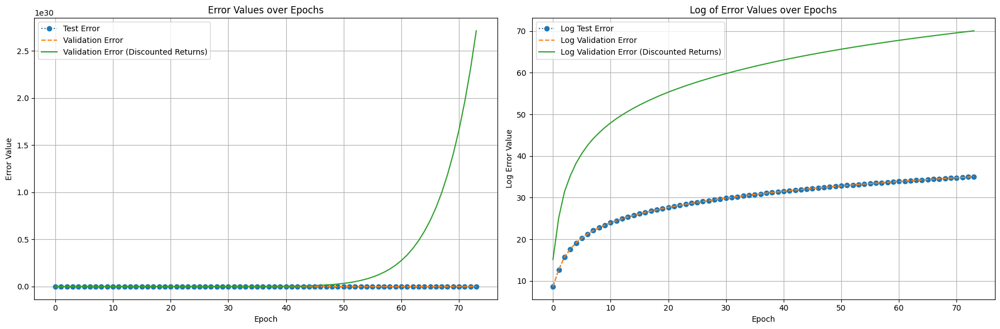

Training Progress:  37%|███▋      | 74/200 [8:39:46<12:51:35, 367.43s/it, Test Error=1771093220549236.5000, Validation Error=1771239545368338.5000, Validation Error (Discounted)=3174715532500772291561348136960.0000]

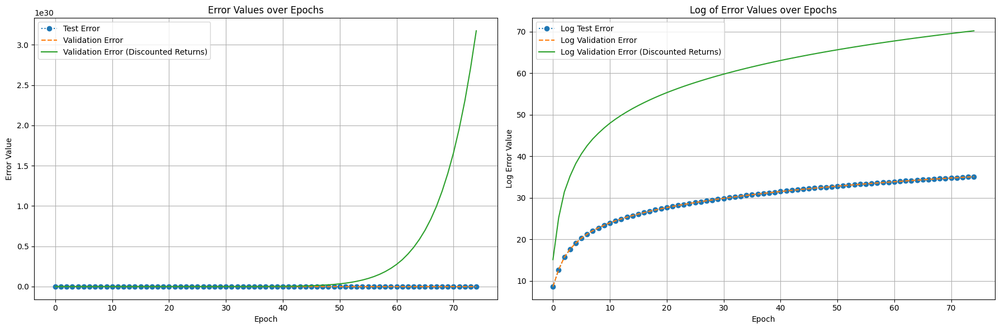

Training Progress:  38%|███▊      | 75/200 [8:45:58<12:48:08, 368.71s/it, Test Error=1915630634358194.0000, Validation Error=1915788911795313.7500, Validation Error (Discounted)=3714019090953151183281897603072.0000]

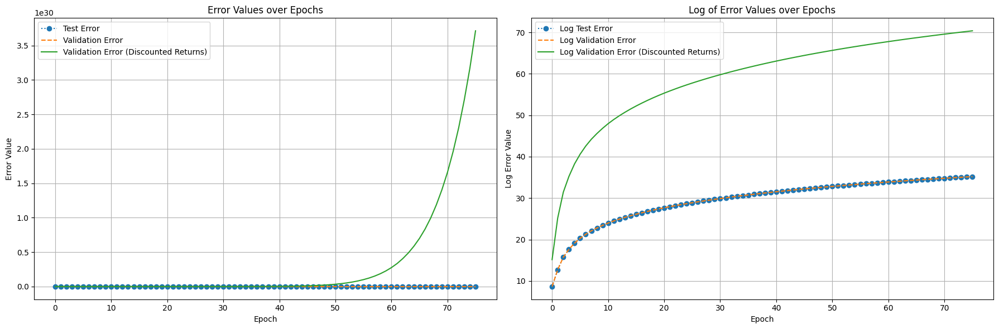

Training Progress:  38%|███▊      | 76/200 [8:52:01<12:44:20, 369.84s/it, Test Error=2070343560399941.5000, Validation Error=2070514546894721.2500, Validation Error (Discounted)=4338153838183197892044340068352.0000]

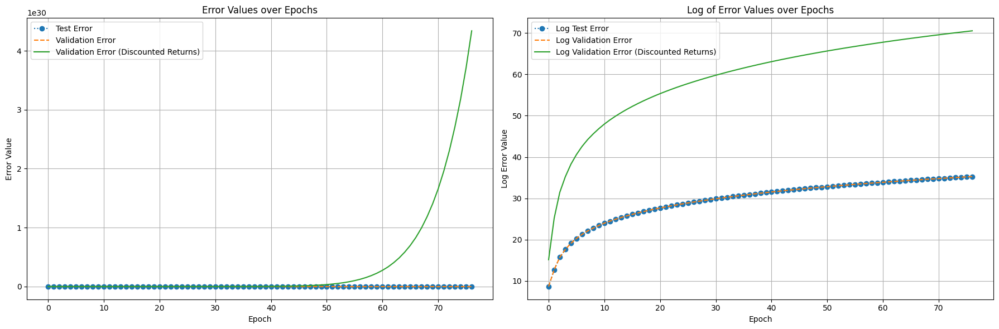

Training Progress:  38%|███▊      | 77/200 [8:58:13<12:33:39, 367.64s/it, Test Error=2234040230622437.2500, Validation Error=2234224753074746.7500, Validation Error (Discounted)=5051290948995958717077086273536.0000]

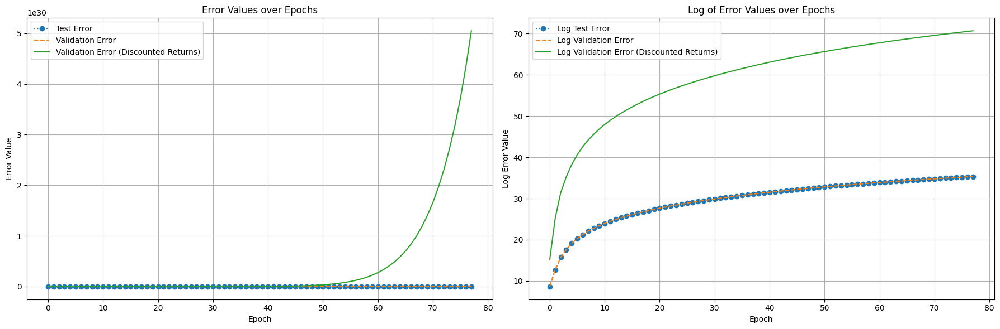

Training Progress:  39%|███▉      | 78/200 [9:04:25<12:30:20, 369.02s/it, Test Error=2407983529385985.5000, Validation Error=2408182436166820.0000, Validation Error (Discounted)=5868483765563793146112859176960.0000]

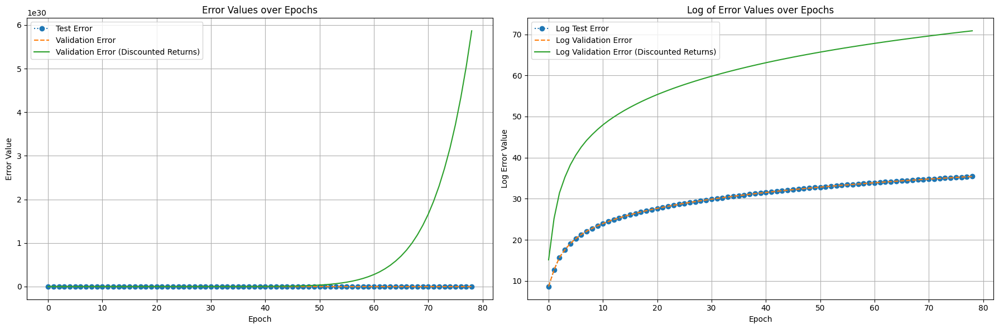

Training Progress:  40%|███▉      | 79/200 [9:10:36<12:25:55, 369.88s/it, Test Error=2594003865031915.0000, Validation Error=2594218099897367.5000, Validation Error (Discounted)=6810157339348762098805225029632.0000]

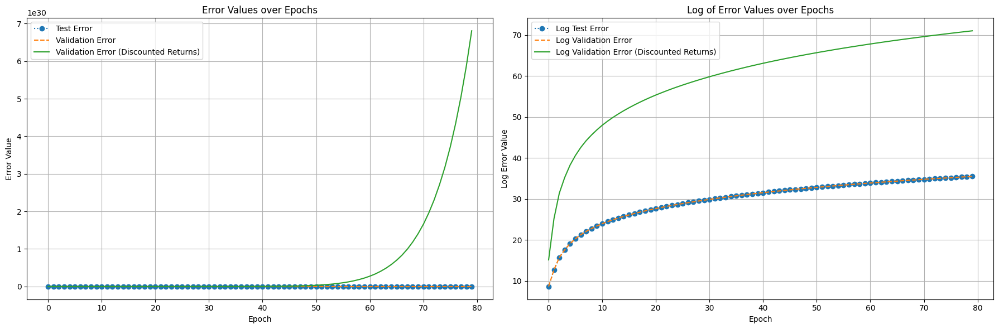

Training Progress:  40%|████      | 80/200 [9:16:38<12:20:42, 370.36s/it, Test Error=2792835439524904.0000, Validation Error=2793066060163845.0000, Validation Error (Discounted)=7894133200006405649033506848768.0000]

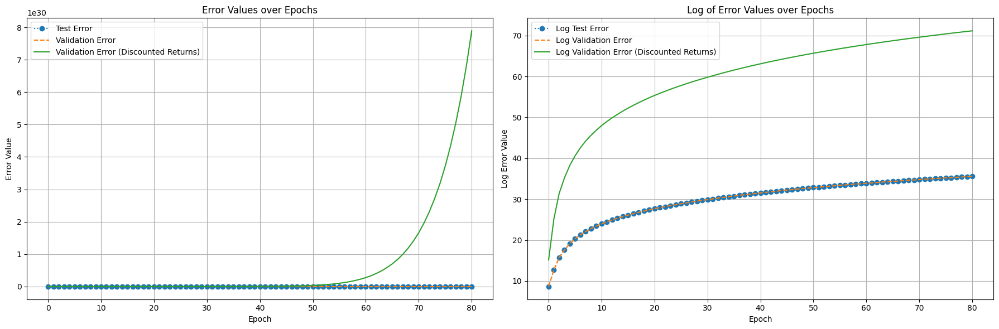

Training Progress:  40%|████      | 81/200 [9:22:55<12:09:11, 367.66s/it, Test Error=3001128177539030.5000, Validation Error=3001375921974597.0000, Validation Error (Discounted)=9115553585947740673195299045376.0000]

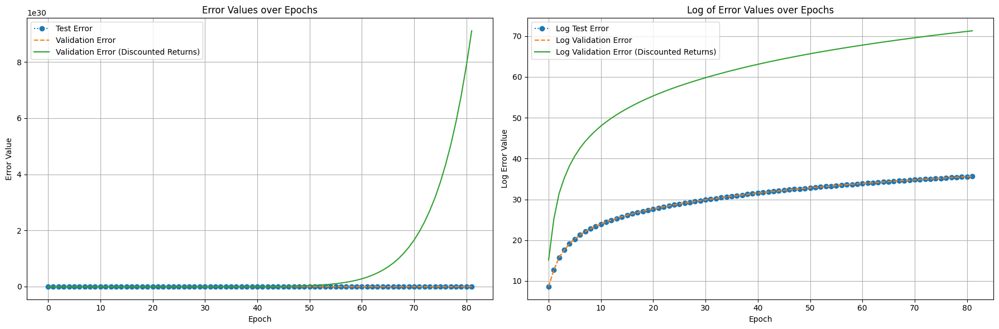

Training Progress:  41%|████      | 82/200 [9:29:01<12:08:32, 370.45s/it, Test Error=3224747934600459.5000, Validation Error=3225014095692891.0000, Validation Error (Discounted)=10524571903641416500906377084928.0000]

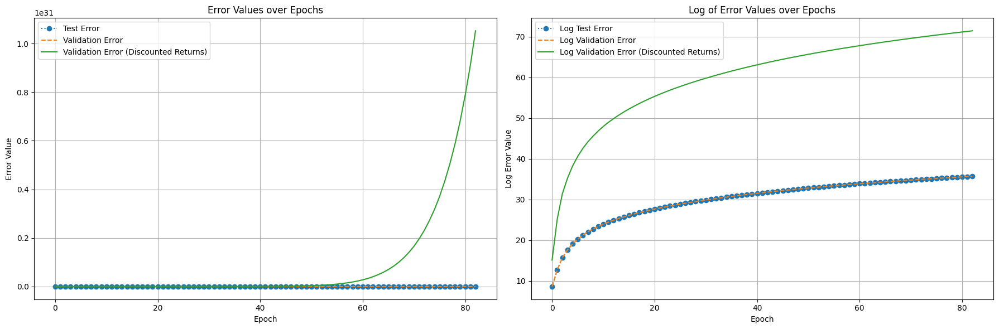

Training Progress:  42%|████▏     | 83/200 [9:35:02<11:59:47, 369.12s/it, Test Error=3461599590640368.0000, Validation Error=3461885249053375.0000, Validation Error (Discounted)=12127381518186870285706492641280.0000]

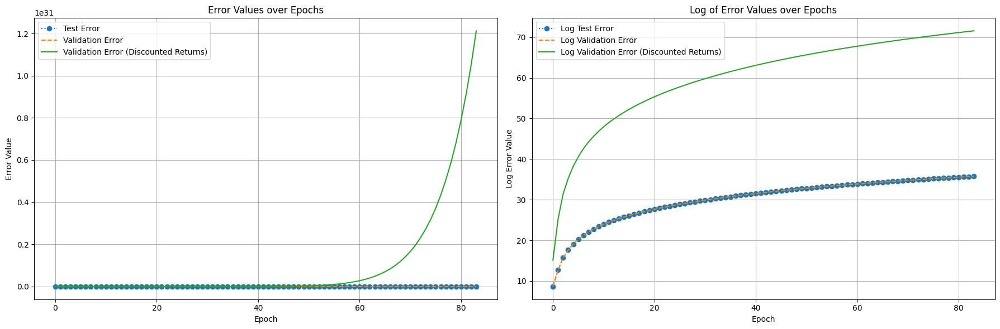

Training Progress:  42%|████▏     | 84/200 [9:41:03<11:49:17, 366.88s/it, Test Error=3711102365627081.0000, Validation Error=3711408670811319.0000, Validation Error (Discounted)=13938562420406498017987268706304.0000]

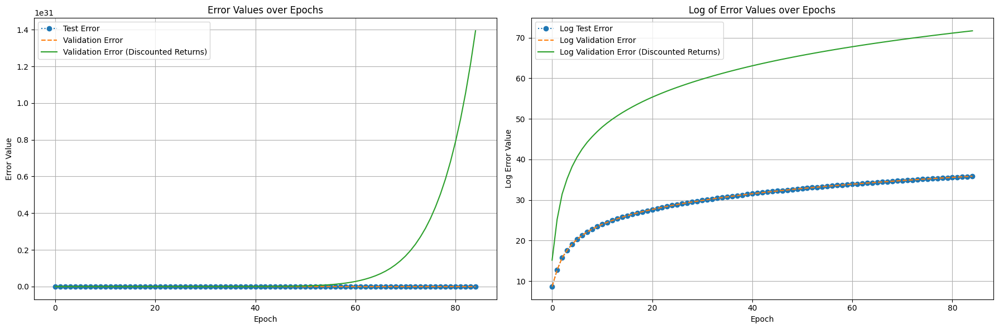

Training Progress:  42%|████▎     | 85/200 [9:47:12<11:39:42, 365.07s/it, Test Error=3976270181853242.5000, Validation Error=3976598204282356.0000, Validation Error (Discounted)=16001497131554098369733479890944.0000]

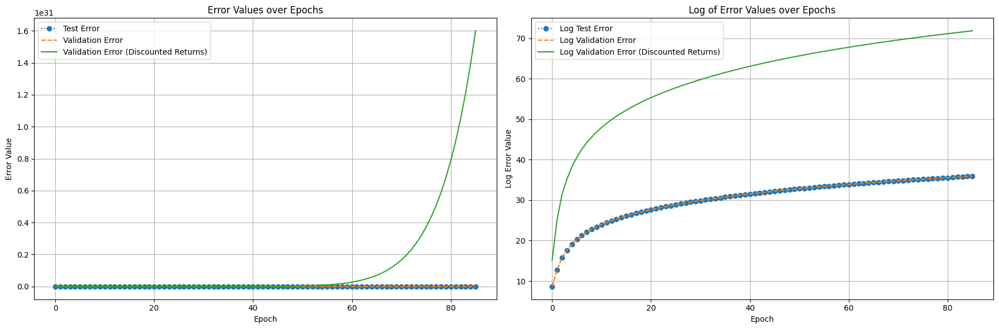

Training Progress:  43%|████▎     | 86/200 [9:53:20<11:35:53, 366.25s/it, Test Error=4259105181909851.0000, Validation Error=4259456485120710.0000, Validation Error (Discounted)=18358811292993712086610222252032.0000]

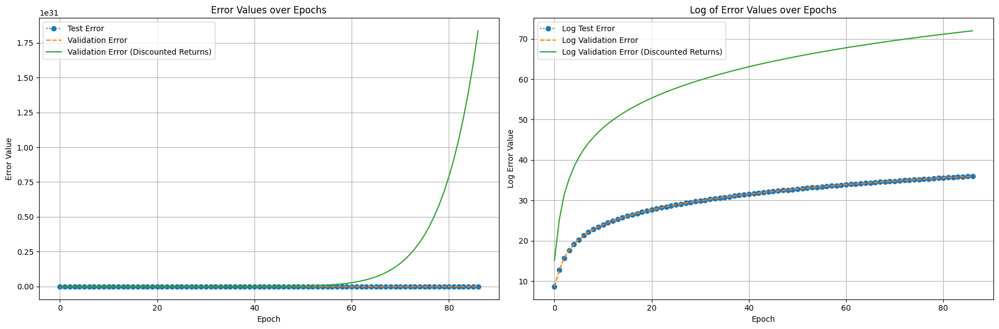

Training Progress:  44%|████▎     | 87/200 [9:59:20<11:30:26, 366.61s/it, Test Error=4557695527264696.0000, Validation Error=4558071395551166.0000, Validation Error (Discounted)=21023136510515177993851973402624.0000]

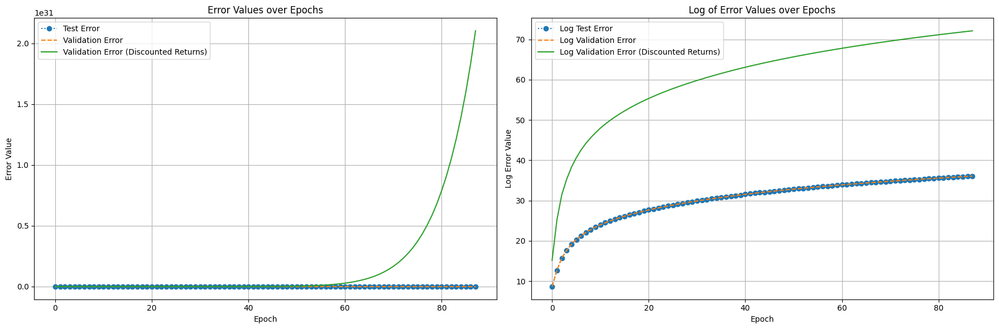

Training Progress:  44%|████▍     | 88/200 [10:05:33<11:21:01, 364.84s/it, Test Error=4871190270957104.0000, Validation Error=4871591867968745.0000, Validation Error (Discounted)=24014612023687056257316504469504.0000]

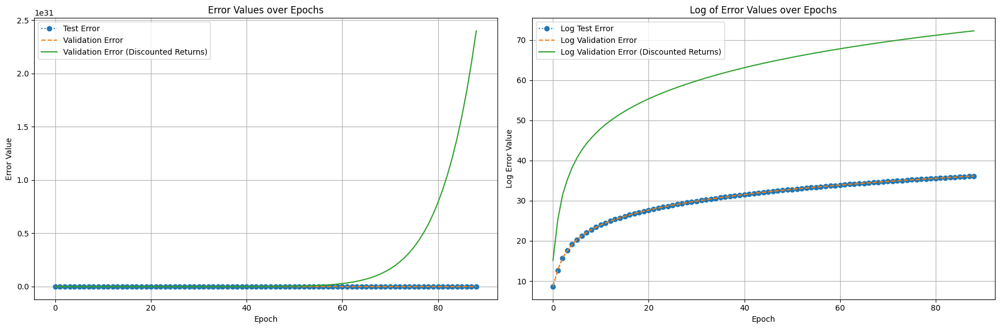

Training Progress:  44%|████▍     | 89/200 [10:11:33<11:19:24, 367.25s/it, Test Error=5203054837964202.0000, Validation Error=5203483802430016.0000, Validation Error (Discounted)=27398224498422143836585054961664.0000]

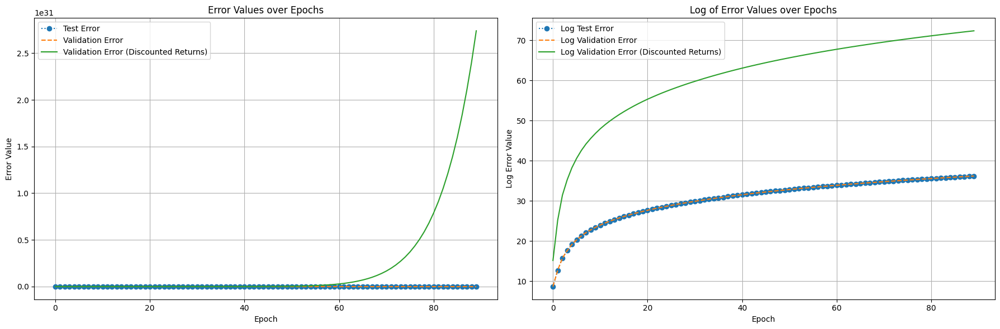

Training Progress:  45%|████▌     | 90/200 [10:17:45<11:09:13, 365.03s/it, Test Error=5553054110737278.0000, Validation Error=5553511928652050.0000, Validation Error (Discounted)=31208249040698316482615044997120.0000]

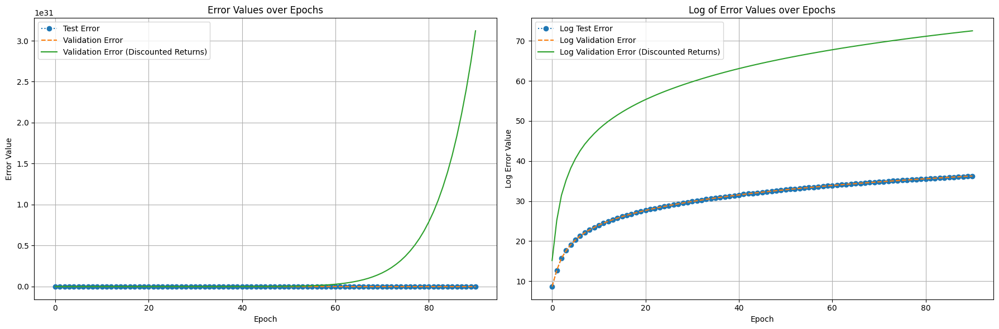

Training Progress:  46%|████▌     | 91/200 [10:23:49<11:06:35, 366.93s/it, Test Error=5923267112393654.0000, Validation Error=5923755468048937.0000, Validation Error (Discounted)=35508181669053715274995561660416.0000]

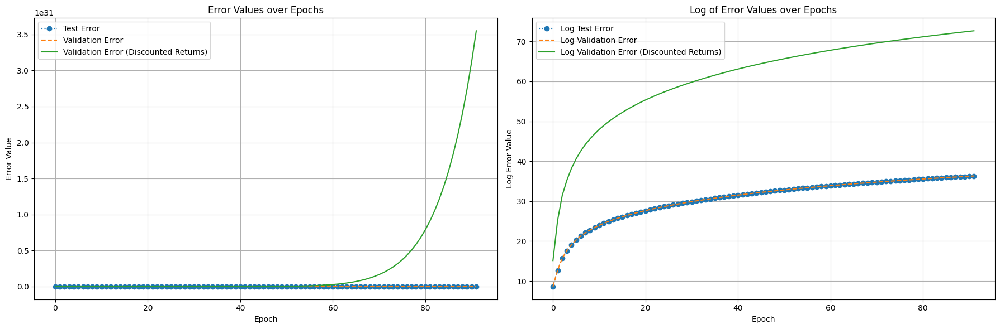

Training Progress:  46%|████▌     | 92/200 [10:29:52<10:59:19, 366.29s/it, Test Error=6312948848063340.0000, Validation Error=6313469282523470.0000, Validation Error (Discounted)=40333783677648056354744087609344.0000]

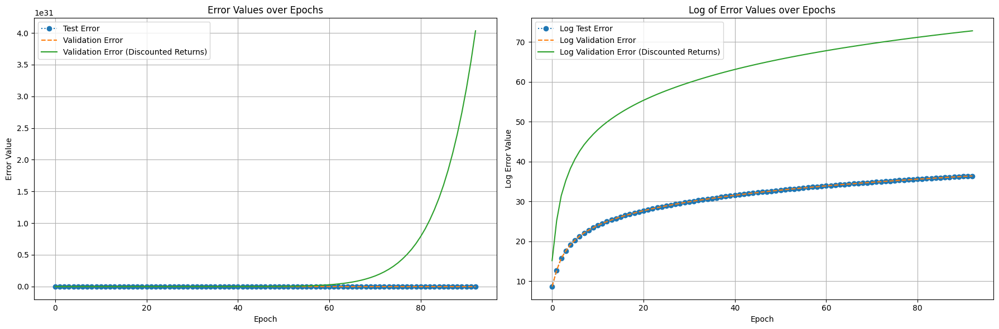

Training Progress:  46%|████▋     | 93/200 [10:36:08<10:51:21, 365.25s/it, Test Error=6724623886349107.0000, Validation Error=6725178163973641.0000, Validation Error (Discounted)=45765691120700032310703231598592.0000]

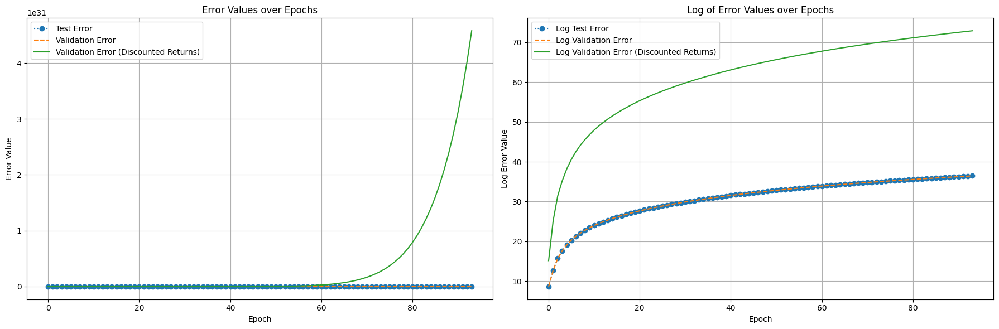

Training Progress:  47%|████▋     | 94/200 [10:42:18<10:50:54, 368.44s/it, Test Error=7158463605555376.0000, Validation Error=7159053601630020.0000, Validation Error (Discounted)=51861514293500406764348062564352.0000]

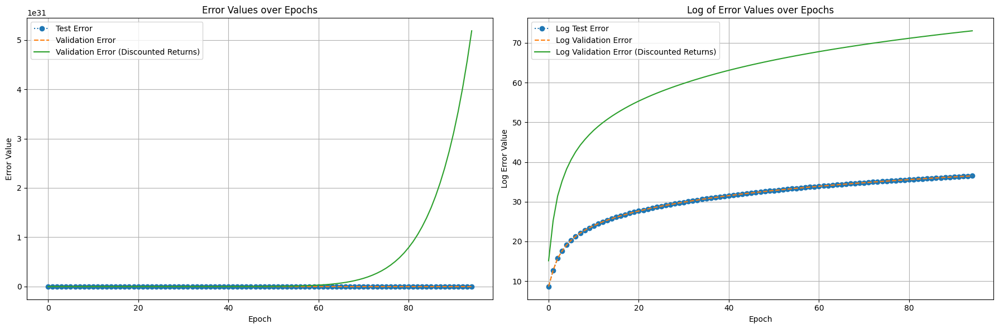

Training Progress:  48%|████▊     | 95/200 [10:48:27<10:45:38, 368.93s/it, Test Error=7617381983249620.0000, Validation Error=7618009603726259.0000, Validation Error (Discounted)=58724031246463789591010545238016.0000]

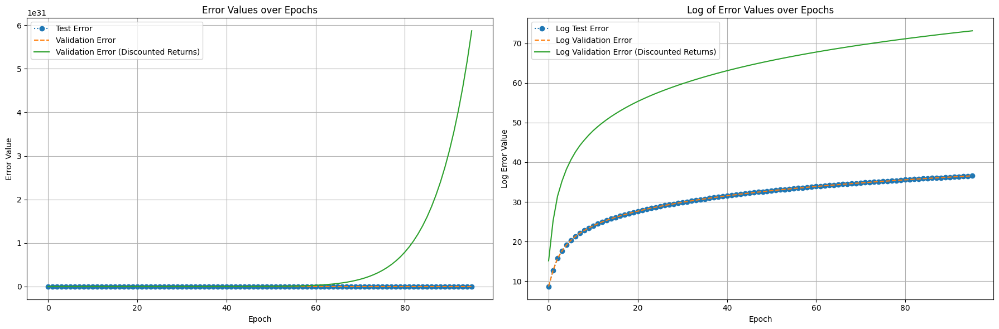

Training Progress:  48%|████▊     | 96/200 [10:54:40<10:39:29, 368.94s/it, Test Error=8098795151554955.0000, Validation Error=8099462300321869.0000, Validation Error (Discounted)=66380794353601427609494422028288.0000]

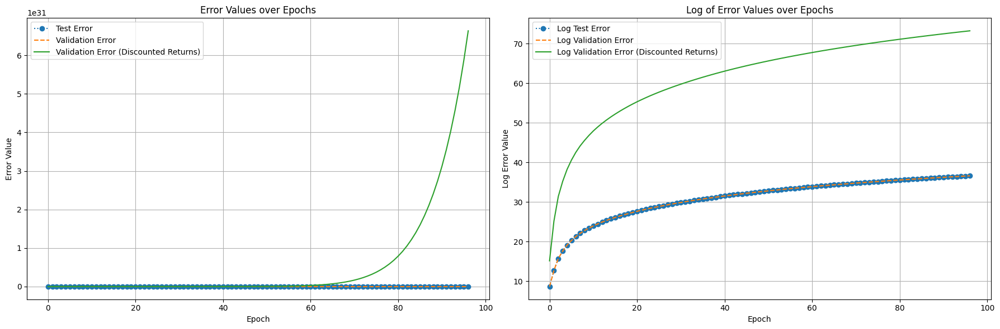

Training Progress:  48%|████▊     | 97/200 [11:00:42<10:35:12, 370.02s/it, Test Error=8601971487514858.0000, Validation Error=8602680039025910.0000, Validation Error (Discounted)=74885481342731765897713353228288.0000]

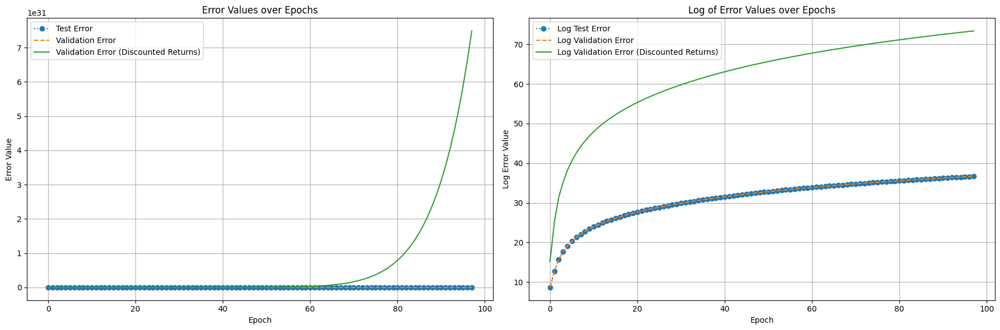

Training Progress:  49%|████▉     | 98/200 [11:06:45<10:25:03, 367.68s/it, Test Error=9127319663318234.0000, Validation Error=9128071635606438.0000, Validation Error (Discounted)=84311529708936675564149448638464.0000]

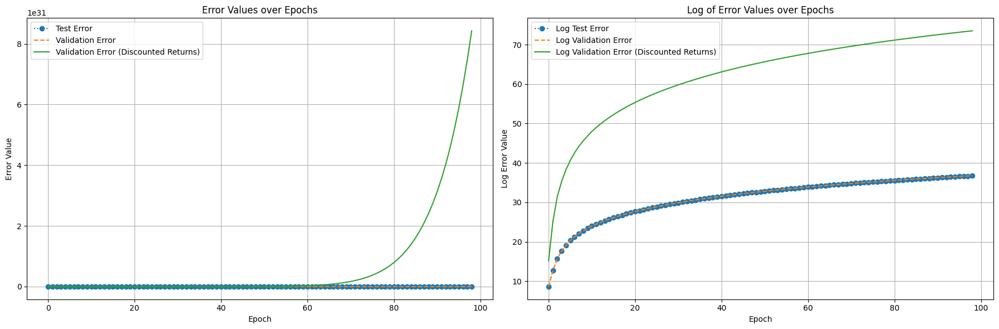

Training Progress:  50%|████▉     | 99/200 [11:12:45<10:16:45, 366.39s/it, Test Error=9688380990154144.0000, Validation Error=9689179048924802.0000, Validation Error (Discounted)=94995343728737136654976232194048.0000]

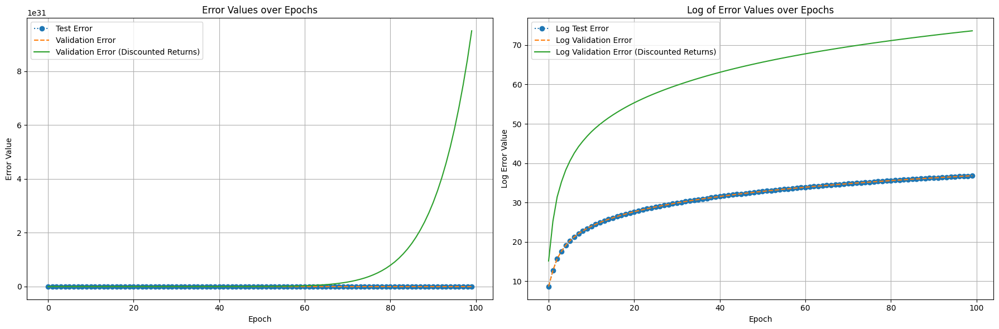

Training Progress:  50%|█████     | 100/200 [11:18:56<10:07:15, 364.35s/it, Test Error=10274984849261112.0000, Validation Error=10275831165183870.0000, Validation Error (Discounted)=106846798980669135171804605710336.0000]

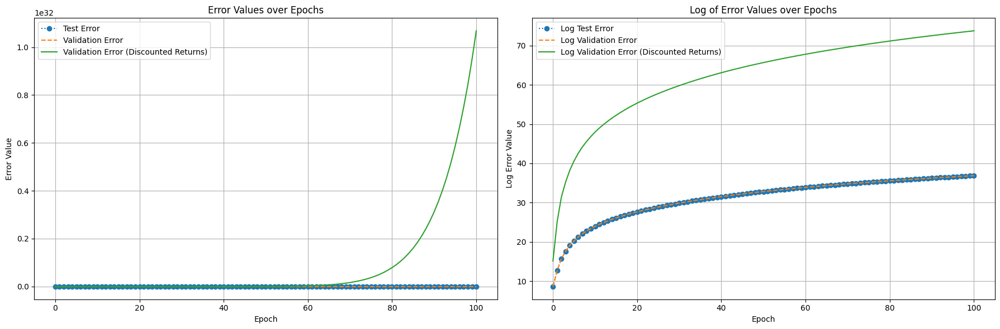

Training Progress:  50%|█████     | 101/200 [11:25:09<10:04:34, 366.41s/it, Test Error=10894765022943654.0000, Validation Error=10895661843515178.0000, Validation Error (Discounted)=120125091436191502924261185552384.0000]

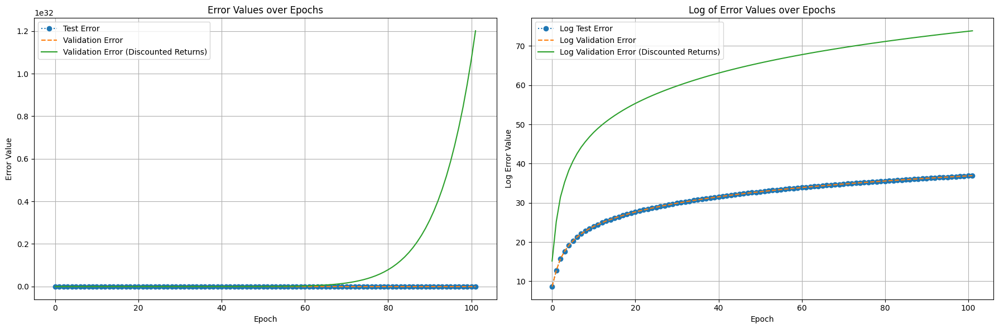

Training Progress:  51%|█████     | 102/200 [11:31:21<10:01:43, 368.41s/it, Test Error=11535613163071274.0000, Validation Error=11536562922223252.0000, Validation Error (Discounted)=134671816162919202182769818992640.0000]

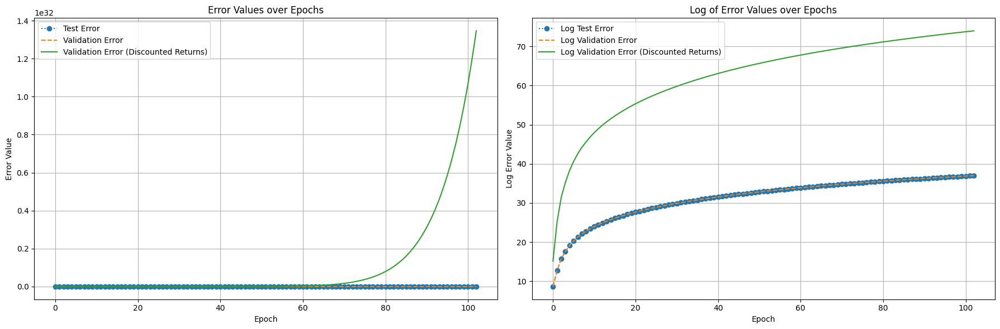

Training Progress:  52%|█████▏    | 103/200 [11:37:25<9:57:04, 369.32s/it, Test Error=12211128199120568.0000, Validation Error=12212133476049918.0000, Validation Error (Discounted)=150906179324466932515144883765248.0000] 

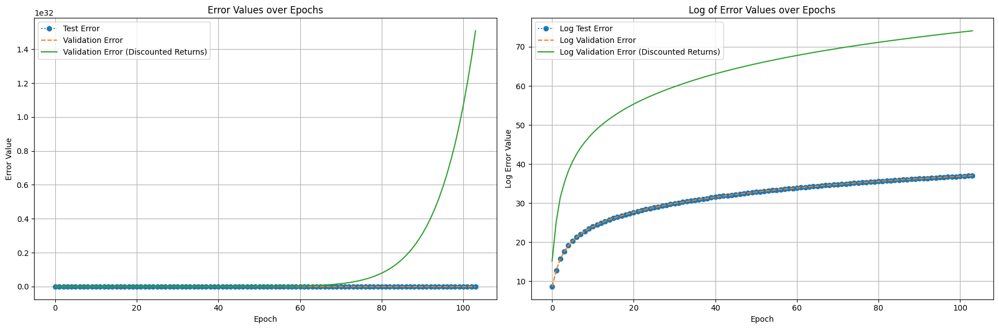

Training Progress:  52%|█████▏    | 104/200 [11:43:26<9:48:22, 367.73s/it, Test Error=12923305593414326.0000, Validation Error=12924369278158170.0000, Validation Error (Discounted)=169021150915181202399063896489984.0000]

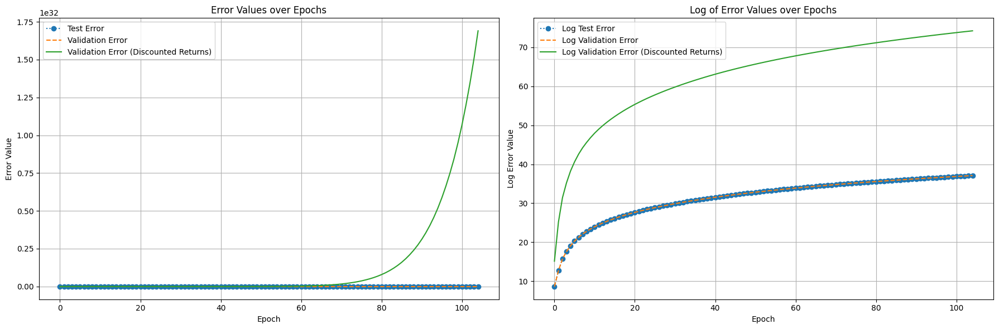

Training Progress:  52%|█████▎    | 105/200 [11:49:29<9:39:22, 365.92s/it, Test Error=13670319755903196.0000, Validation Error=13671444542631832.0000, Validation Error (Discounted)=189125682429995581380417797750784.0000]

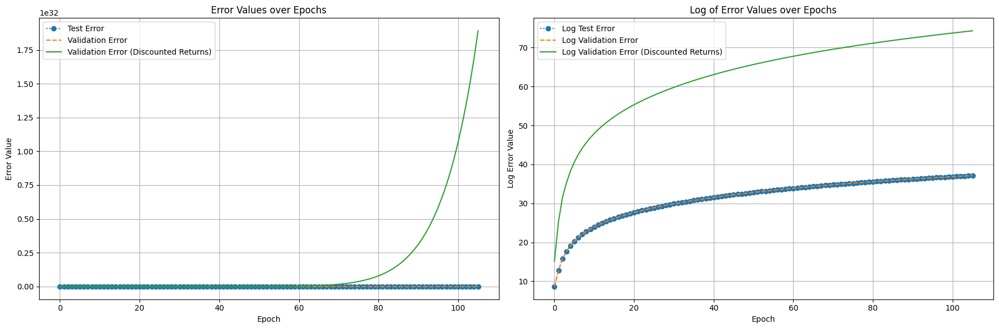

Training Progress:  53%|█████▎    | 106/200 [11:55:42<9:31:38, 364.88s/it, Test Error=14446348030824110.0000, Validation Error=14447536771521088.0000, Validation Error (Discounted)=211208091402741725404159696437248.0000]

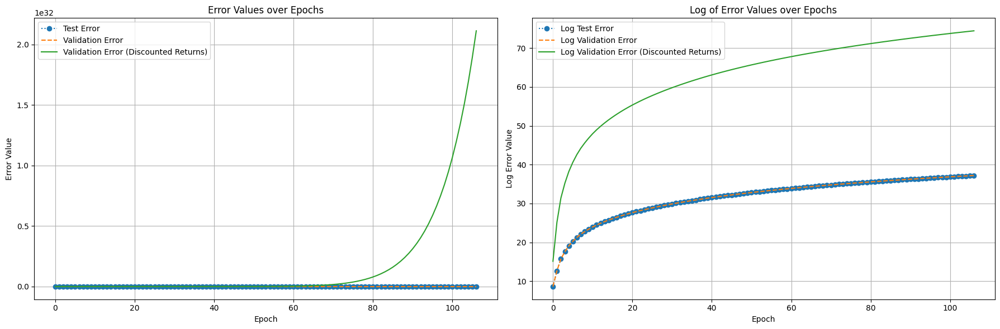

Training Progress:  54%|█████▎    | 107/200 [12:01:53<9:29:18, 367.29s/it, Test Error=15260453248136026.0000, Validation Error=15261708801618794.0000, Validation Error (Discounted)=235682605478780917194217423372288.0000]

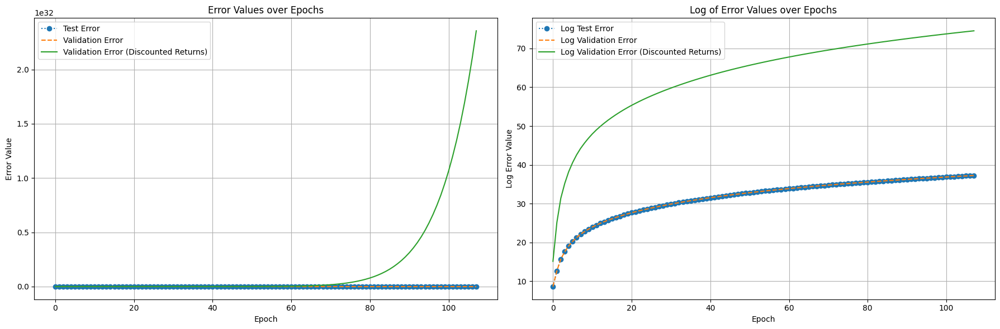

Training Progress:  54%|█████▍    | 108/200 [12:08:05<9:25:08, 368.57s/it, Test Error=16115149785518158.0000, Validation Error=16116475475239186.0000, Validation Error (Discounted)=262822102567899117548644268507136.0000]

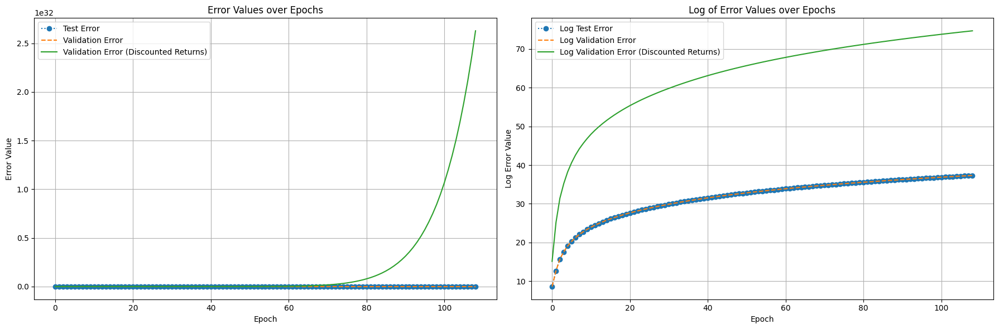

Training Progress:  55%|█████▍    | 109/200 [12:14:17<9:20:20, 369.46s/it, Test Error=17004309793185122.0000, Validation Error=17005708246447400.0000, Validation Error (Discounted)=292623923302888663983225040797696.0000]

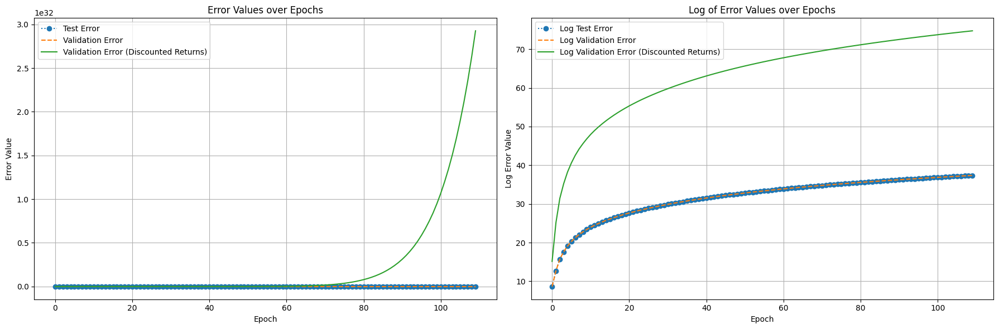

Training Progress:  55%|█████▌    | 110/200 [12:20:24<9:15:28, 370.32s/it, Test Error=17940027847596220.0000, Validation Error=17941503253198392.0000, Validation Error (Discounted)=325715864762754944292908703940608.0000]

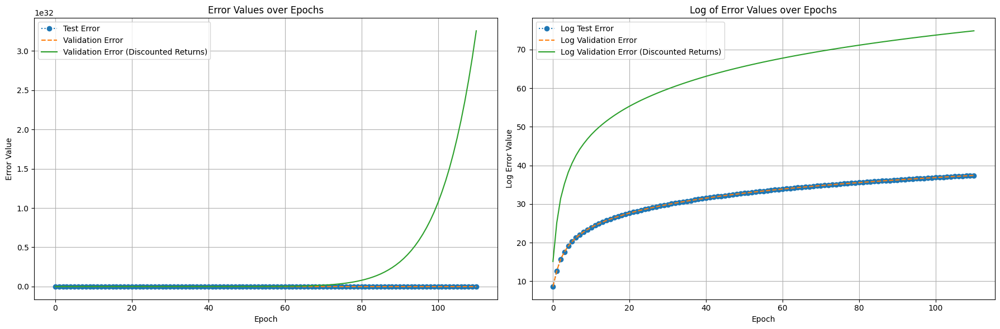

Training Progress:  56%|█████▌    | 111/200 [12:26:38<9:07:57, 369.41s/it, Test Error=18914081070156728.0000, Validation Error=18915636156144260.0000, Validation Error (Discounted)=362045387749464938062942046257152.0000]

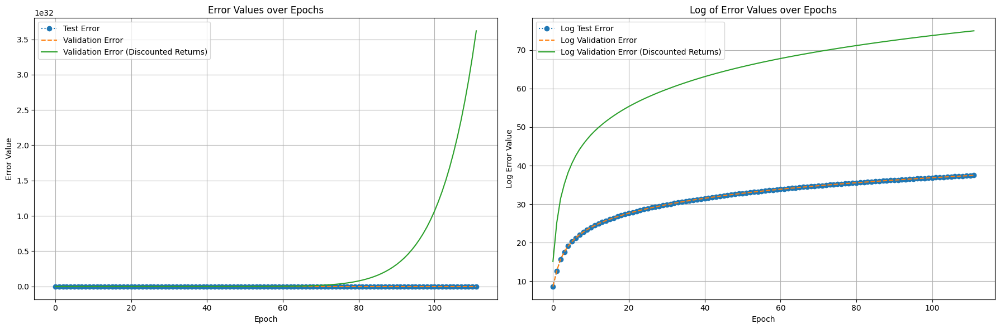

Training Progress:  56%|█████▌    | 112/200 [12:32:45<9:03:27, 370.54s/it, Test Error=19936346343796060.0000, Validation Error=19937985176827580.0000, Validation Error (Discounted)=402238013191071161974564520460288.0000]

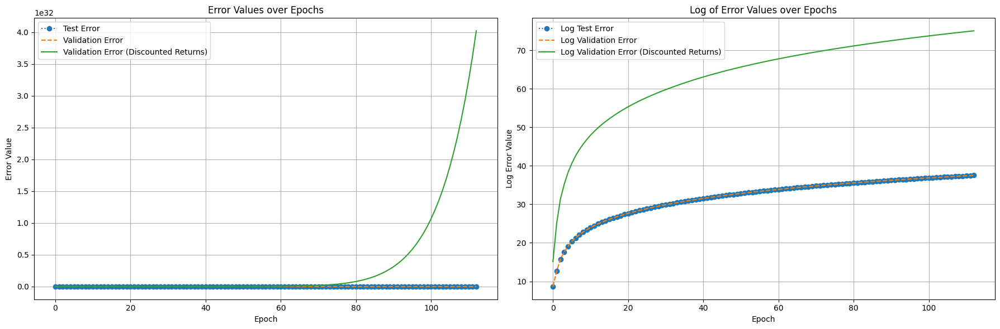

Training Progress:  56%|█████▋    | 113/200 [12:38:47<8:56:09, 369.77s/it, Test Error=20994230832413624.0000, Validation Error=20995956806027496.0000, Validation Error (Discounted)=446057617535756169826774565257216.0000]

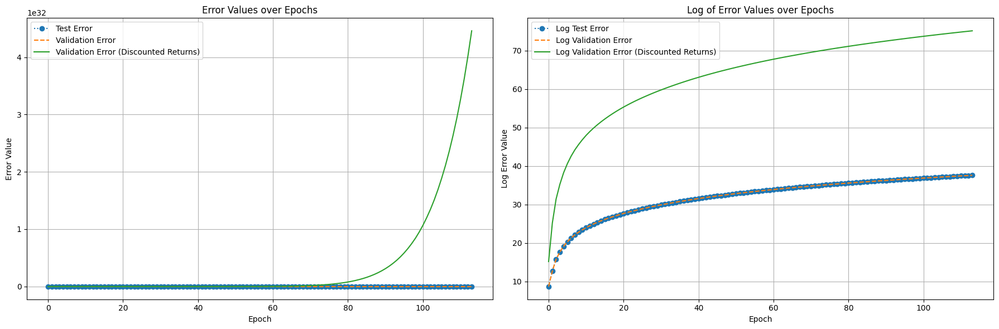

Training Progress:  57%|█████▋    | 114/200 [12:44:51<8:46:33, 367.36s/it, Test Error=22106122721234560.0000, Validation Error=22107939648377568.0000, Validation Error (Discounted)=494555643546060223692282414497792.0000]

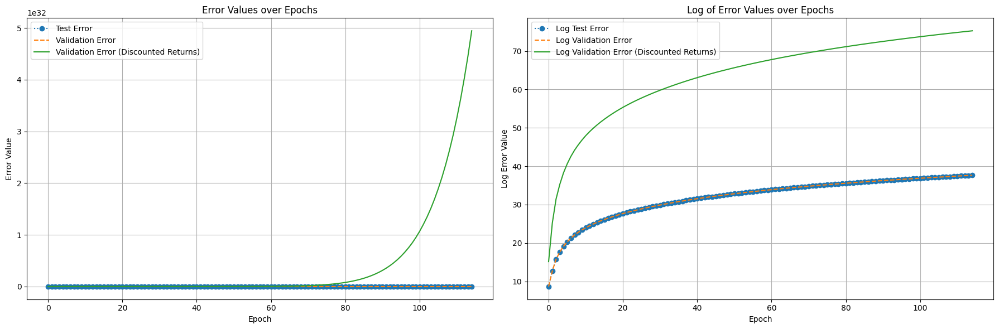

Training Progress:  57%|█████▊    | 115/200 [12:51:03<8:38:52, 366.27s/it, Test Error=23267001325125672.0000, Validation Error=23268913264905868.0000, Validation Error (Discounted)=547860100194829750824962191523840.0000]

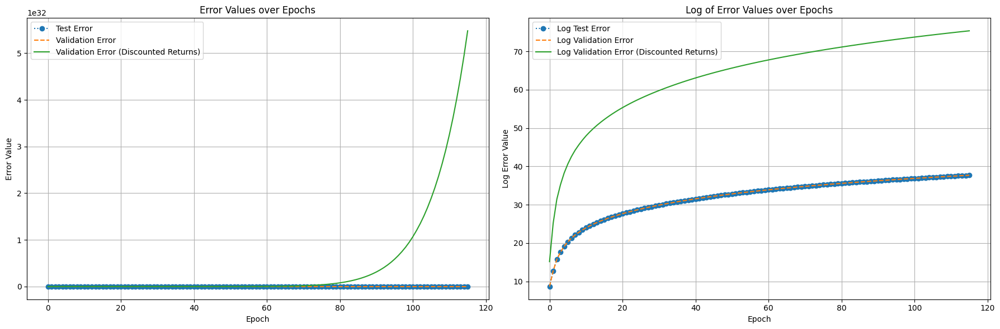

Training Progress:  58%|█████▊    | 116/200 [12:57:05<8:35:02, 367.88s/it, Test Error=24475048430071368.0000, Validation Error=24477059223590184.0000, Validation Error (Discounted)=606226250895458797723696314187776.0000]

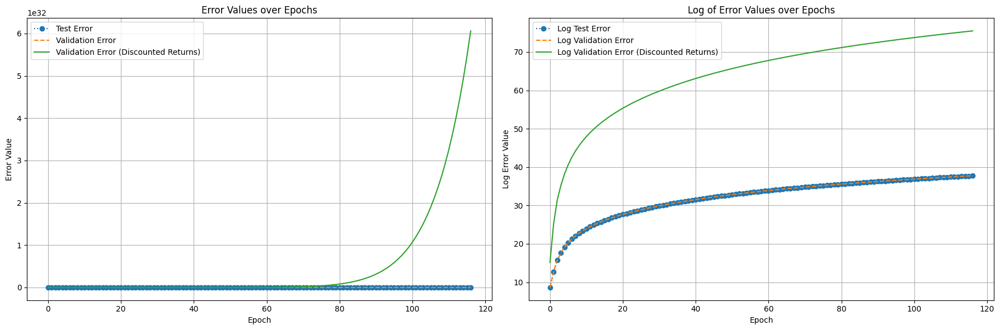

Training Progress:  58%|█████▊    | 117/200 [13:03:18<8:26:33, 366.19s/it, Test Error=25736367732130560.0000, Validation Error=25738482237678784.0000, Validation Error (Discounted)=670321333837120706268321229570048.0000]

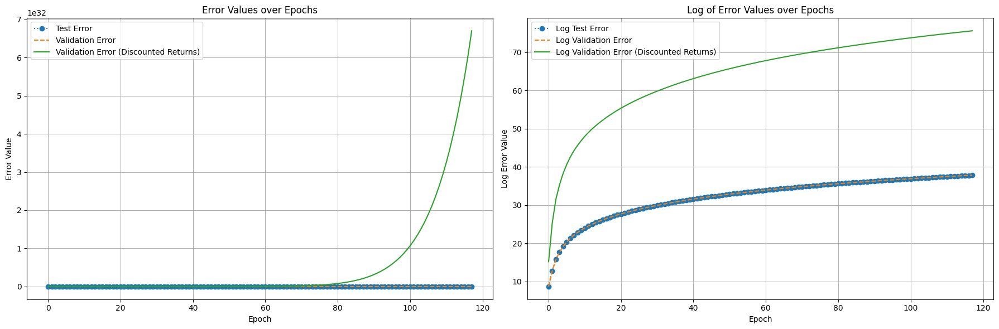

Training Progress:  59%|█████▉    | 118/200 [13:09:29<8:23:19, 368.28s/it, Test Error=27044500453013068.0000, Validation Error=27046721660231320.0000, Validation Error (Discounted)=740194876492005818619160896208896.0000]

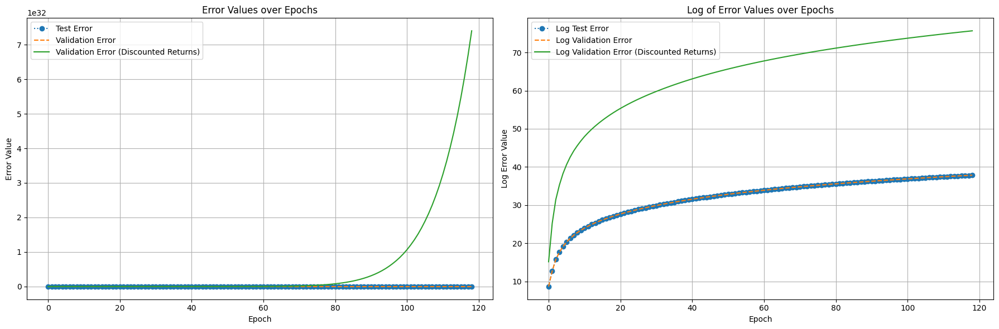

Training Progress:  60%|█████▉    | 119/200 [13:15:32<8:18:21, 369.16s/it, Test Error=28408950705381888.0000, Validation Error=28411284376107884.0000, Validation Error (Discounted)=816766051019358360207513125650432.0000]

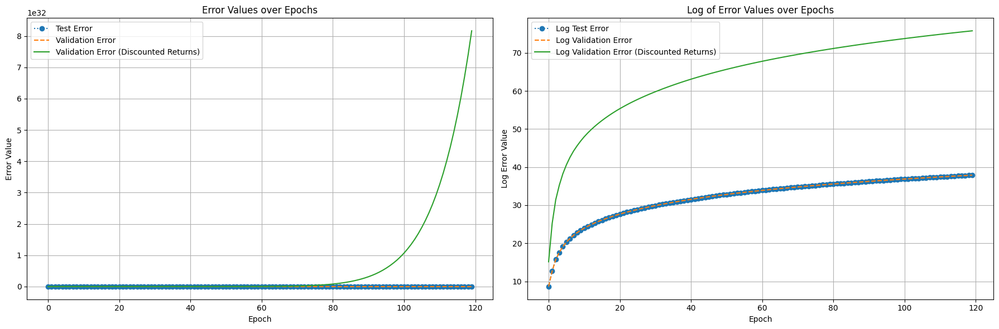

Training Progress:  60%|██████    | 120/200 [13:21:39<8:09:47, 367.35s/it, Test Error=29831783360313740.0000, Validation Error=29834234091230312.0000, Validation Error (Discounted)=900627620037580658971577069600768.0000]

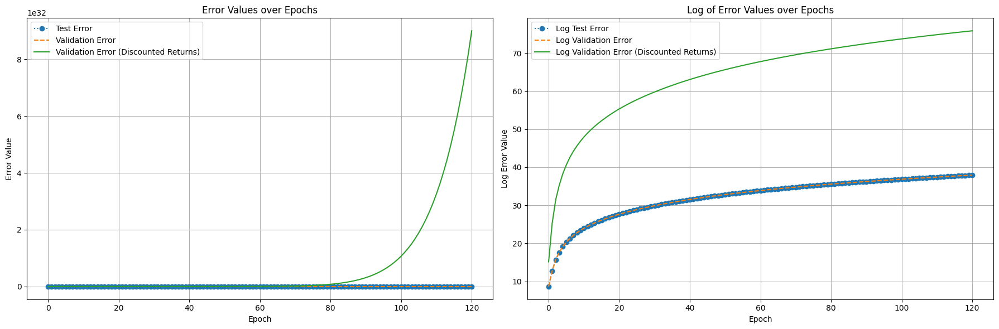

Training Progress:  60%|██████    | 121/200 [13:27:51<8:03:32, 367.24s/it, Test Error=31323663761509404.0000, Validation Error=31326236359614680.0000, Validation Error (Discounted)=992958700856435863096500481425408.0000]

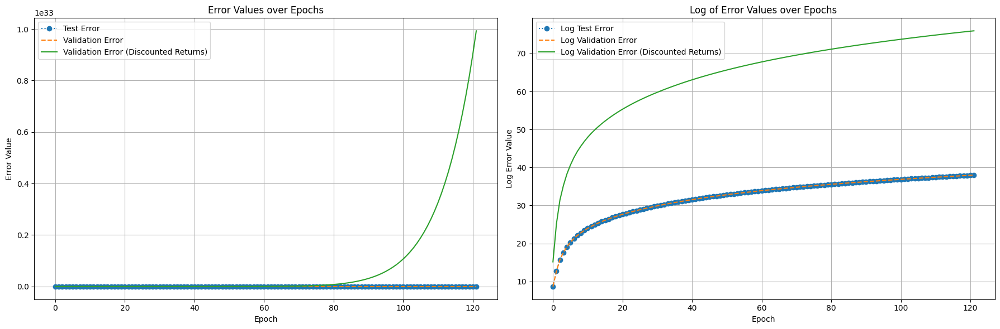

Training Progress:  61%|██████    | 122/200 [13:33:55<7:59:05, 368.53s/it, Test Error=32863393261379036.0000, Validation Error=32866092099167992.0000, Validation Error (Discounted)=1092974895533283261776898983723008.0000]

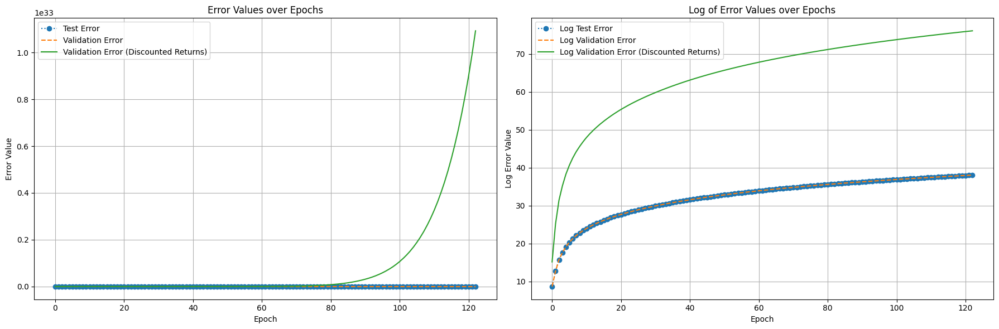

Training Progress:  62%|██████▏   | 123/200 [13:39:59<7:51:23, 367.32s/it, Test Error=34478935891908992.0000, Validation Error=34481767235123708.0000, Validation Error (Discounted)=1203077965996983990594511317237760.0000]

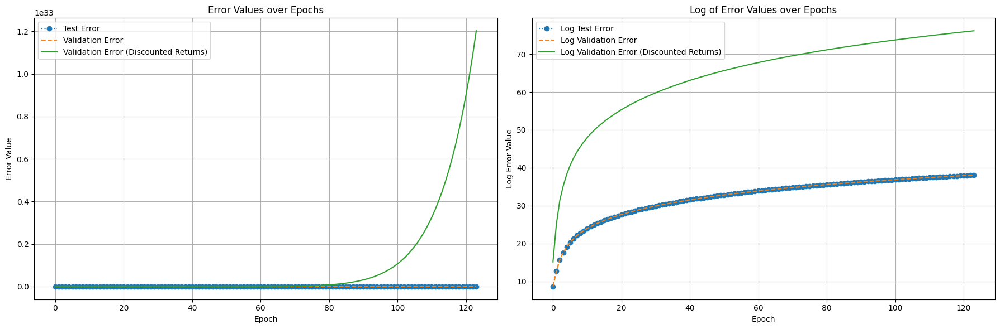

Training Progress:  62%|██████▏   | 124/200 [13:46:41<7:43:41, 366.07s/it, Test Error=36154877651308456.0000, Validation Error=36157846823418640.0000, Validation Error (Discounted)=1322877004437514663269914401308672.0000]

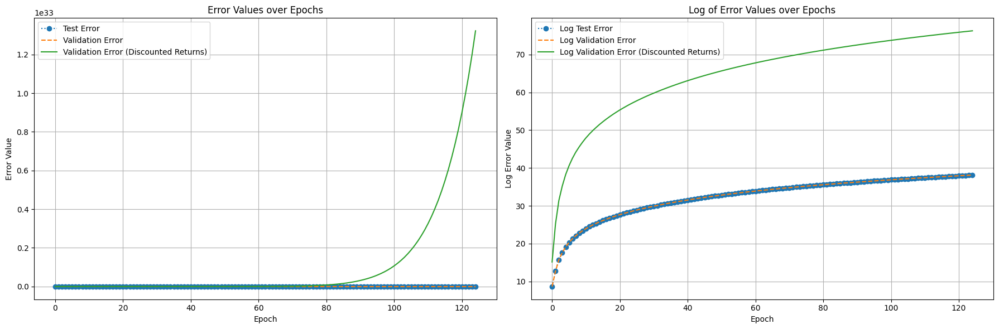

Training Progress:  62%|██████▎   | 125/200 [13:52:55<7:51:21, 377.08s/it, Test Error=37881010550768888.0000, Validation Error=37884120532776800.0000, Validation Error (Discounted)=1452202201158048021105038680129536.0000]

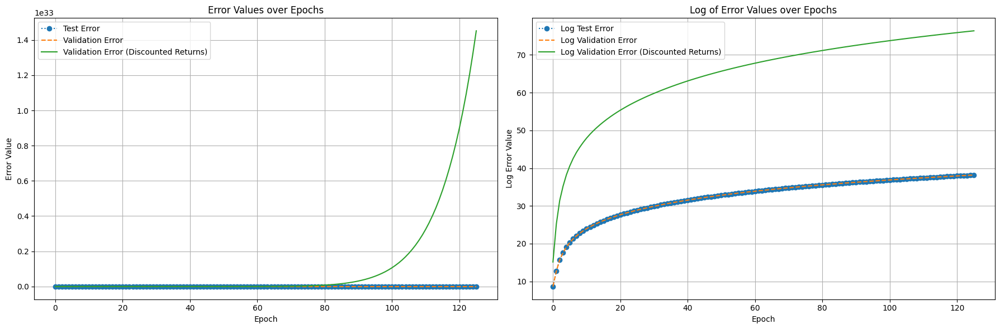

Training Progress:  63%|██████▎   | 126/200 [13:59:07<7:43:50, 376.09s/it, Test Error=39685361962882984.0000, Validation Error=39688619980898848.0000, Validation Error (Discounted)=1593837125144839922582712529977344.0000]

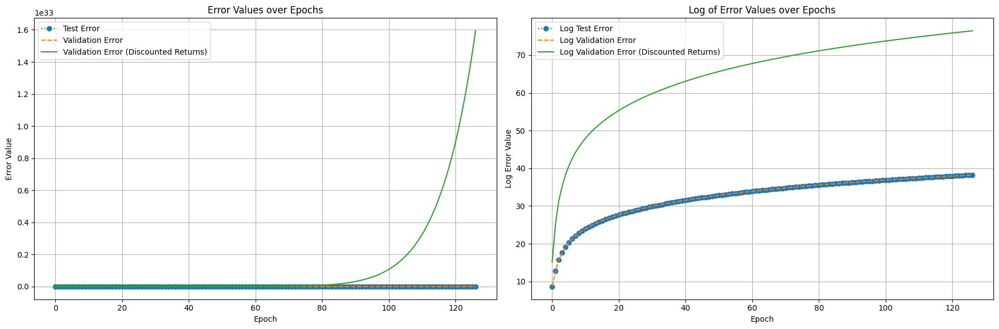

Training Progress:  64%|██████▎   | 127/200 [14:05:20<7:35:57, 374.76s/it, Test Error=41560942275370080.0000, Validation Error=41564354208508552.0000, Validation Error (Discounted)=1748052671638555389318024189181952.0000]

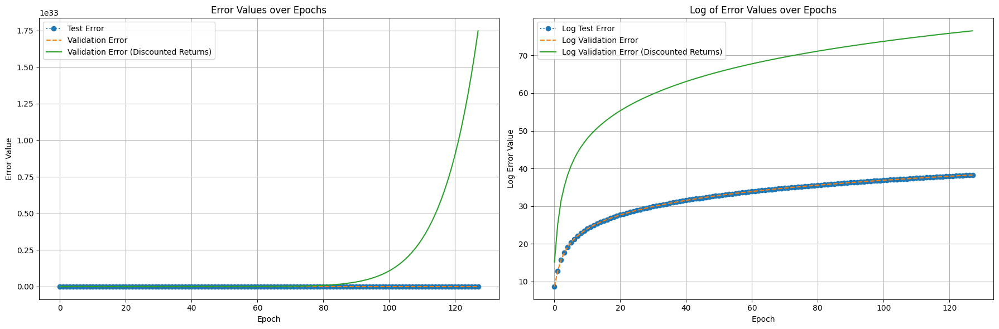

Training Progress:  64%|██████▍   | 128/200 [14:11:28<7:29:01, 374.18s/it, Test Error=43518189082820664.0000, Validation Error=43521761342217032.0000, Validation Error (Discounted)=1916565094682694092562321870159872.0000]

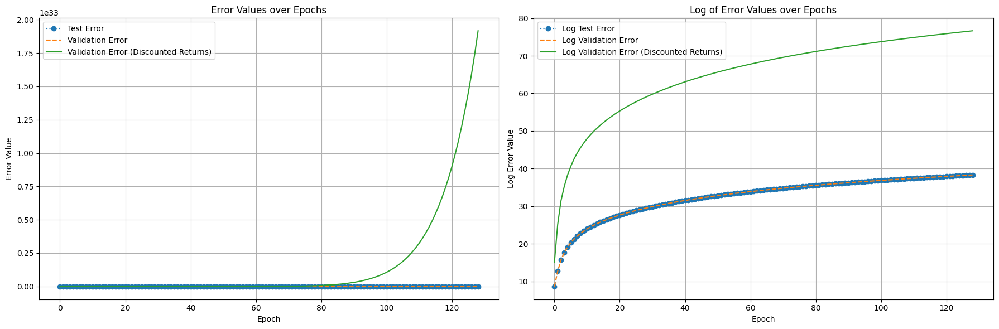

Training Progress:  64%|██████▍   | 129/200 [14:17:32<7:20:39, 372.38s/it, Test Error=45544225121244408.0000, Validation Error=45547963601204040.0000, Validation Error (Discounted)=2099178152261821953171030500442112.0000]

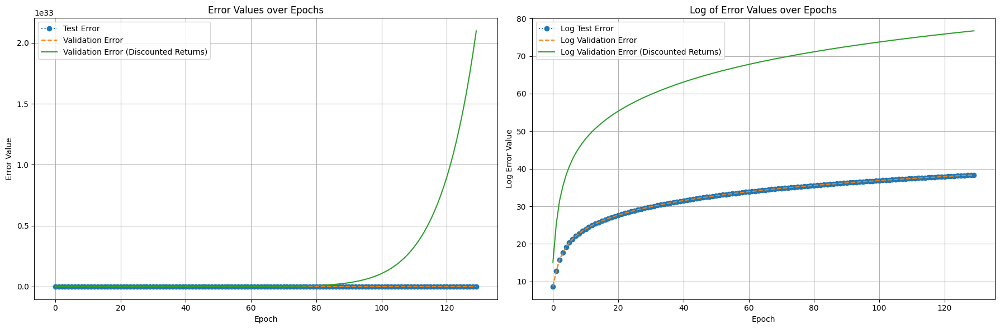

Training Progress:  65%|██████▌   | 130/200 [14:23:40<7:11:30, 369.86s/it, Test Error=47648061501289216.0000, Validation Error=47651972411833560.0000, Validation Error (Discounted)=2297597382245322746278338386460672.0000]

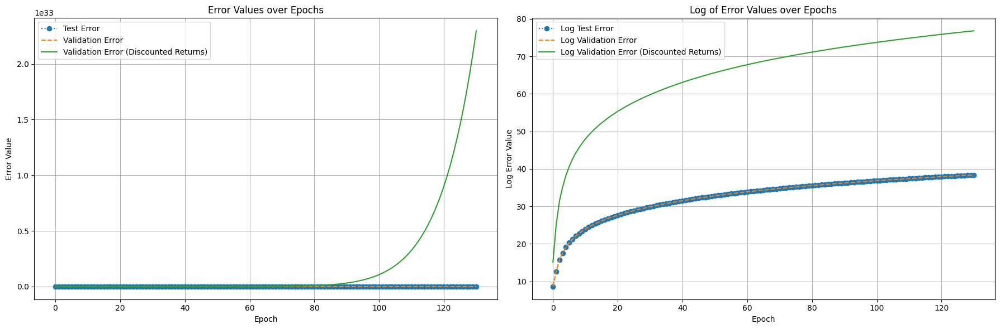

Training Progress:  66%|██████▌   | 131/200 [14:29:42<7:04:41, 369.30s/it, Test Error=49829098689196120.0000, Validation Error=49833188104078096.0000, Validation Error (Discounted)=2512749488470935388236246742466560.0000]

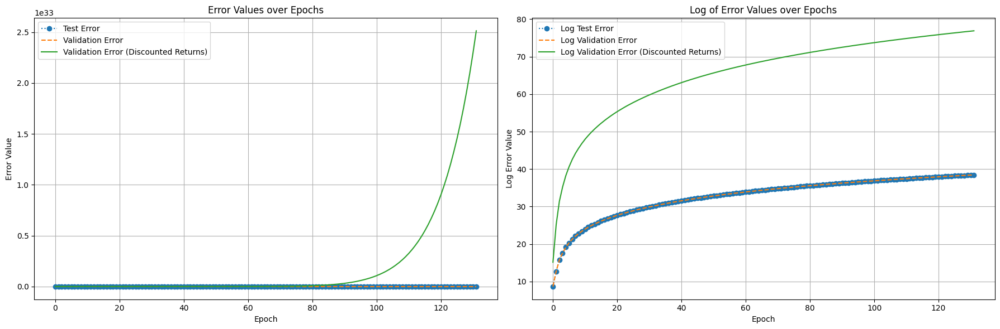

Training Progress:  66%|██████▌   | 132/200 [14:35:45<6:56:07, 367.17s/it, Test Error=52108162116779504.0000, Validation Error=52112438261330904.0000, Validation Error (Discounted)=2747859009006389808357691214528512.0000]

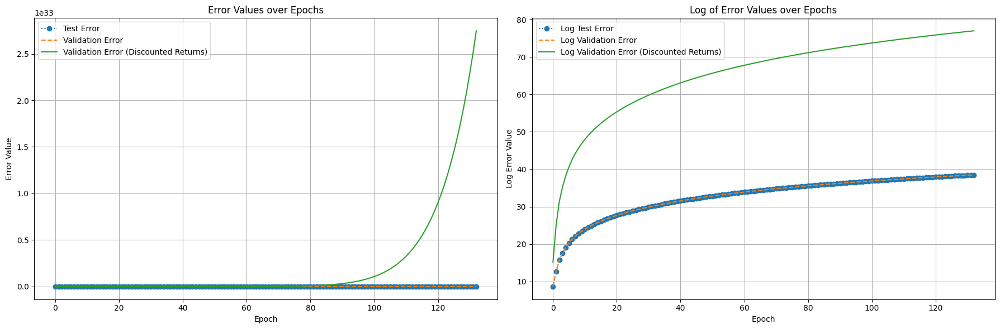

Training Progress:  66%|██████▋   | 133/200 [14:41:46<6:48:36, 365.91s/it, Test Error=54473239176587104.0000, Validation Error=54477708251768696.0000, Validation Error (Discounted)=3002950423192904403658848308559872.0000]

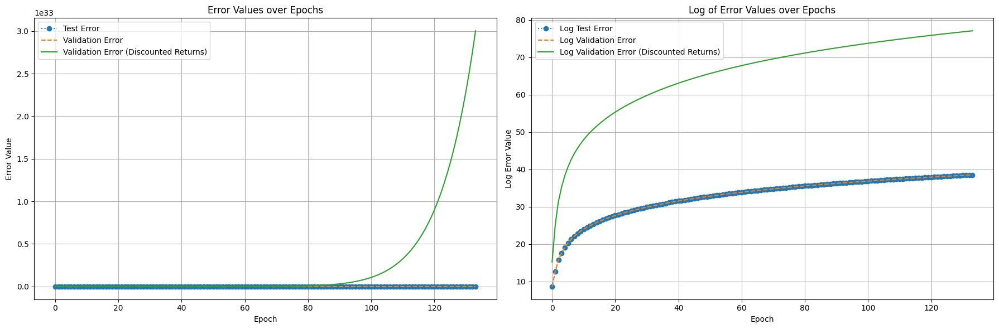

Training Progress:  67%|██████▋   | 134/200 [14:47:47<6:41:01, 364.57s/it, Test Error=56901056981771840.0000, Validation Error=56905725763564880.0000, Validation Error (Discounted)=3276588668572564825104817779113984.0000]

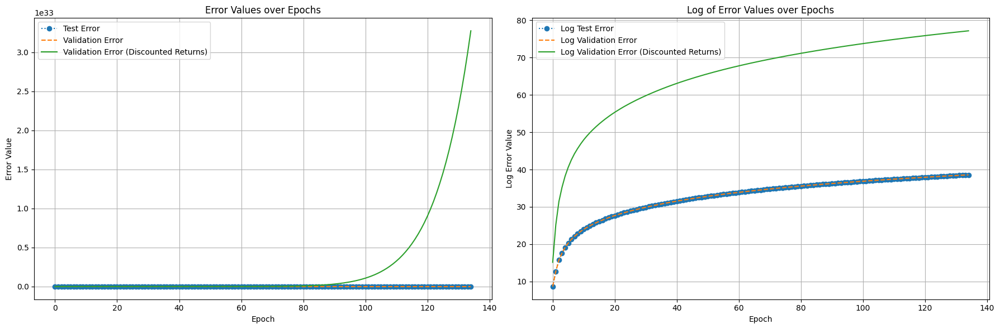

Training Progress:  68%|██████▊   | 135/200 [14:53:48<6:34:03, 363.75s/it, Test Error=59436884991141216.0000, Validation Error=59441760898604896.0000, Validation Error (Discounted)=3575127651435974800911193021087744.0000]

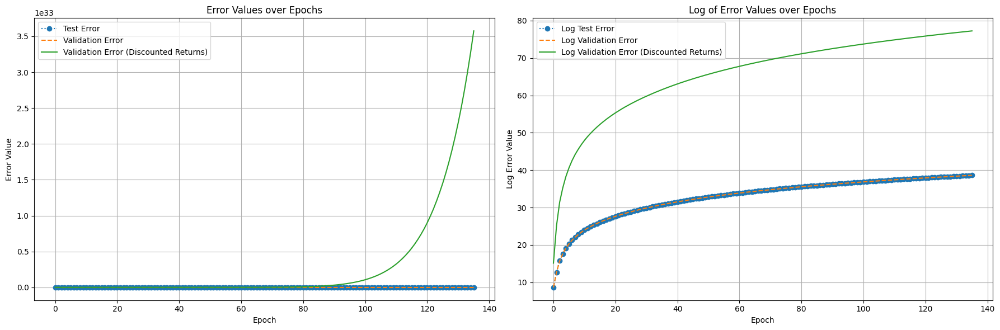

Training Progress:  68%|██████▊   | 136/200 [14:59:55<6:26:39, 362.49s/it, Test Error=62056938578294696.0000, Validation Error=62062028860971592.0000, Validation Error (Discounted)=3897251892949868971051000470175744.0000]

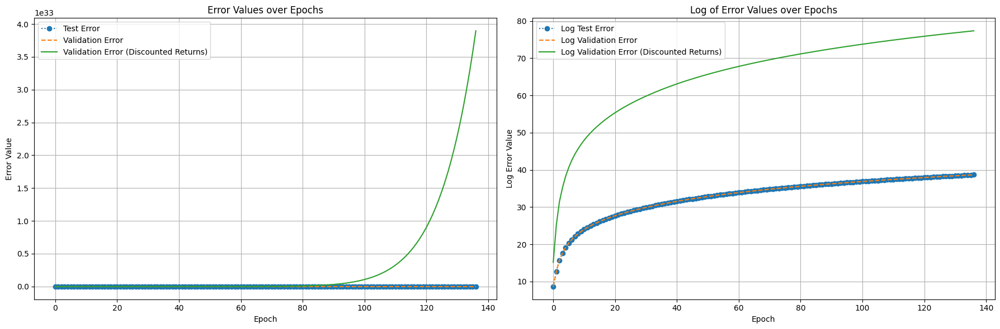

Training Progress:  68%|██████▊   | 137/200 [15:05:59<6:22:05, 363.89s/it, Test Error=64760738975750944.0000, Validation Error=64766050653185680.0000, Validation Error (Discounted)=4244243583551709737008315043414016.0000]

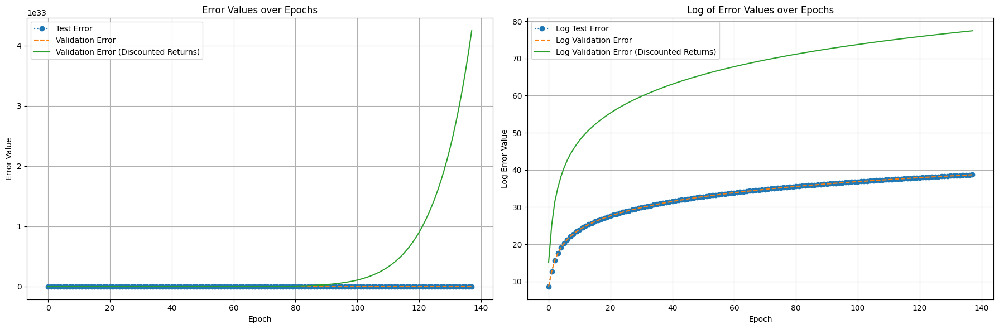

Training Progress:  69%|██████▉   | 138/200 [15:12:01<6:16:11, 364.06s/it, Test Error=67564804296938752.0000, Validation Error=67570345841916952.0000, Validation Error (Discounted)=4619743155839330018298858617962496.0000]

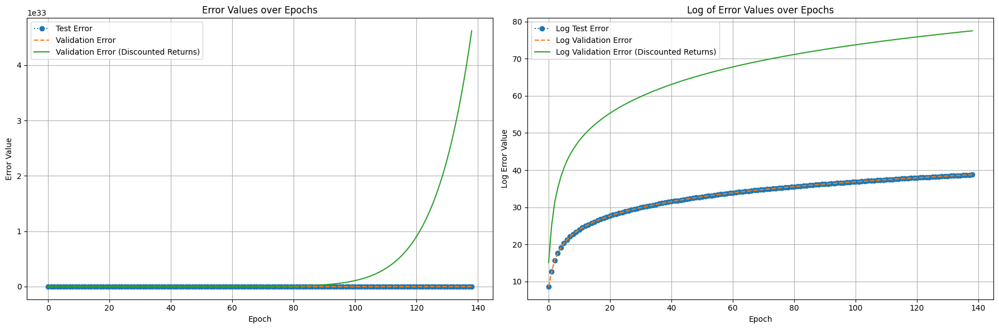

Training Progress:  70%|██████▉   | 139/200 [15:18:03<6:09:19, 363.26s/it, Test Error=70501288222299216.0000, Validation Error=70507068864250120.0000, Validation Error (Discounted)=5030023205465611542407115561762816.0000]

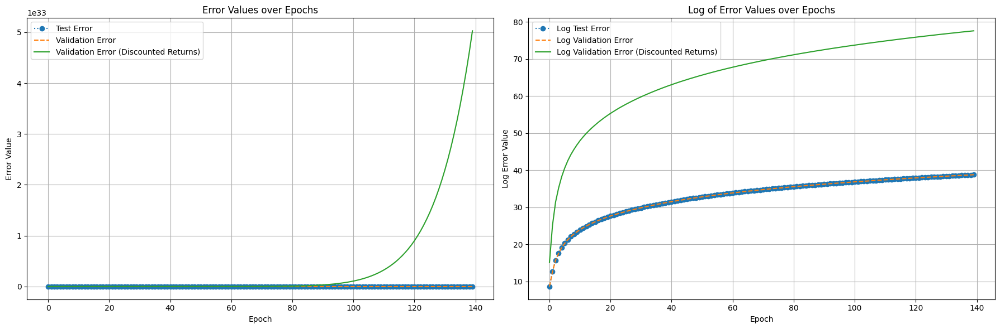

Training Progress:  70%|███████   | 140/200 [15:24:13<6:03:06, 363.11s/it, Test Error=73525297490736816.0000, Validation Error=73531326936541424.0000, Validation Error (Discounted)=5470791695146470454105712300654592.0000]

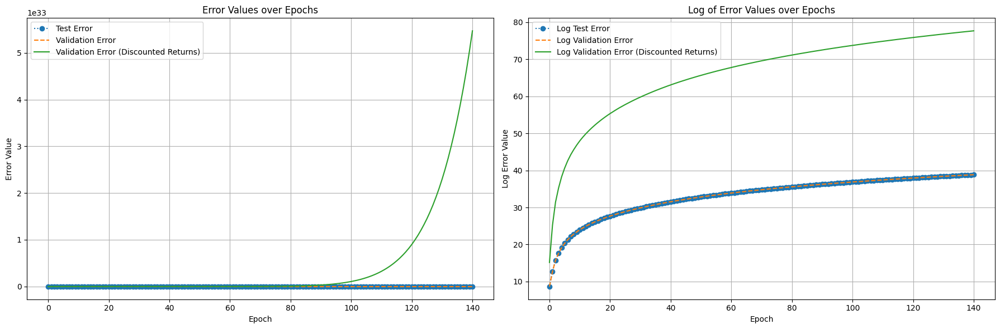

Training Progress:  70%|███████   | 141/200 [15:30:25<5:58:54, 364.99s/it, Test Error=76630118811392656.0000, Validation Error=76636403651621008.0000, Validation Error (Discounted)=5942578137849453796001377228423168.0000]

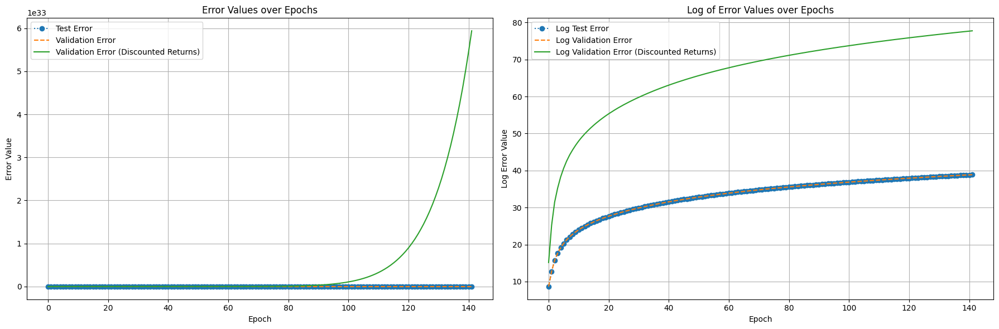

Training Progress:  71%|███████   | 142/200 [15:36:28<5:54:46, 367.02s/it, Test Error=79874719004814240.0000, Validation Error=79881269867004624.0000, Validation Error (Discounted)=6456444787708175175693499400978432.0000]

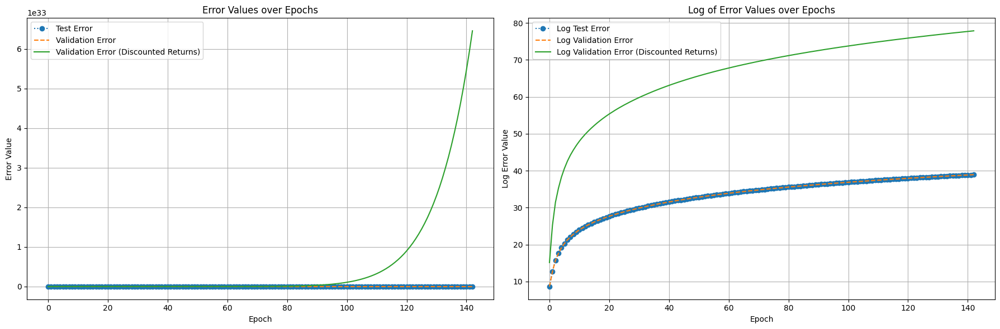

Training Progress:  72%|███████▏  | 143/200 [15:42:28<5:47:41, 366.00s/it, Test Error=83219714791005648.0000, Validation Error=83226538615204176.0000, Validation Error (Discounted)=7008529723513857702695134287626240.0000]

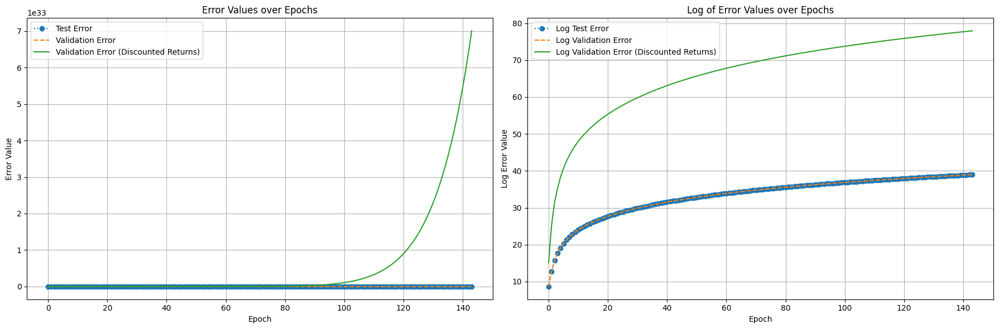

Training Progress:  72%|███████▏  | 144/200 [15:48:36<5:39:52, 364.15s/it, Test Error=86679701087934016.0000, Validation Error=86686808604443488.0000, Validation Error (Discounted)=7603432739127341871324201110994944.0000]

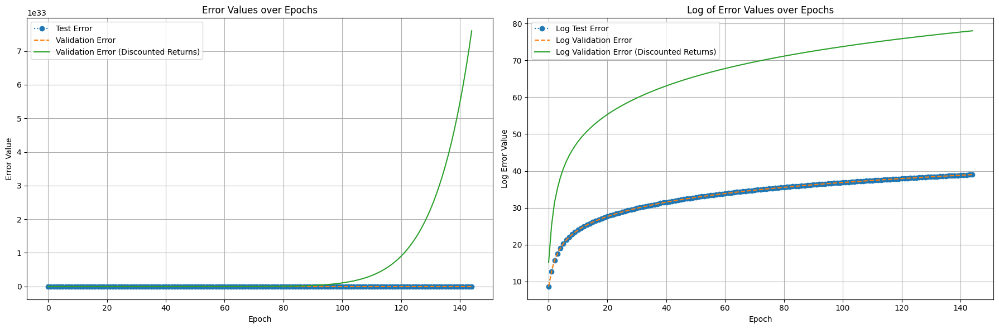

Training Progress:  72%|███████▎  | 145/200 [15:54:48<5:34:47, 365.23s/it, Test Error=90256965588619040.0000, Validation Error=90264365996231280.0000, Validation Error (Discounted)=8243953394022763102757516772114432.0000]

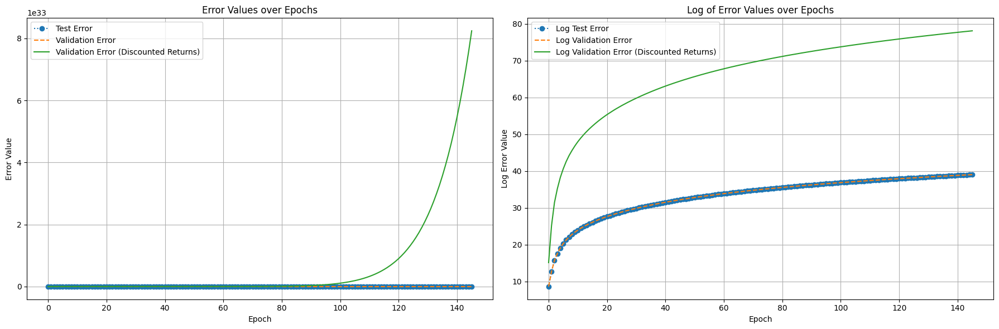

Training Progress:  73%|███████▎  | 146/200 [16:00:51<5:30:40, 367.41s/it, Test Error=93968112184719200.0000, Validation Error=93975815546471648.0000, Validation Error (Discounted)=8935805260147748924423984298065920.0000]

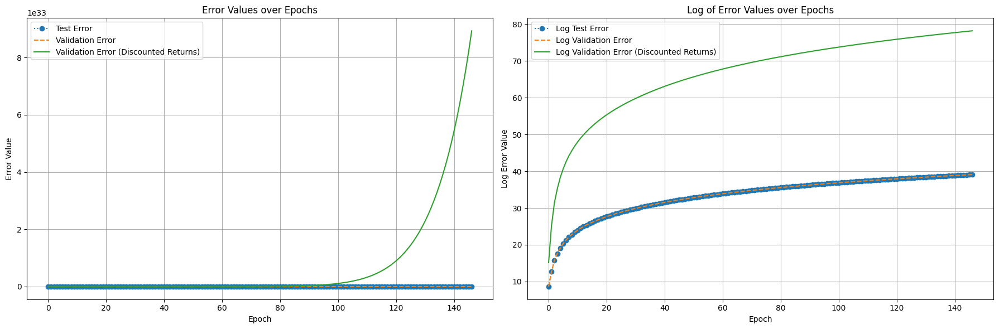

Training Progress:  74%|███████▎  | 147/200 [16:06:52<5:23:12, 365.89s/it, Test Error=97762257200314240.0000, Validation Error=97770272574839728.0000, Validation Error (Discounted)=9671999003727159889857514383081472.0000]

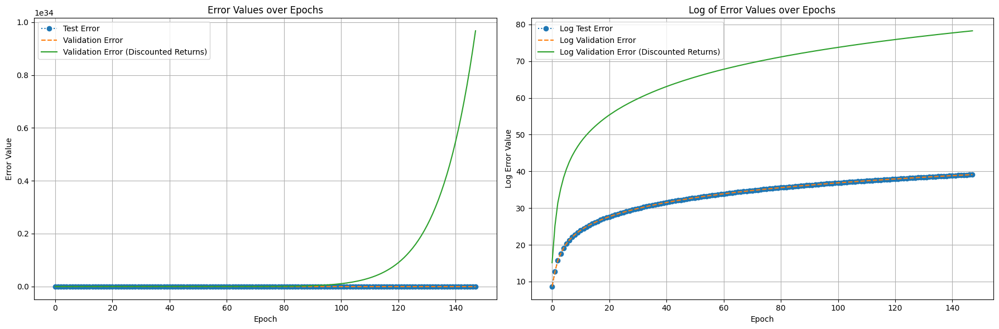

Training Progress:  74%|███████▍  | 148/200 [16:13:03<5:15:49, 364.41s/it, Test Error=101737517982730912.0000, Validation Error=101745858693376128.0000, Validation Error (Discounted)=10474568214410672834909327935406080.0000]

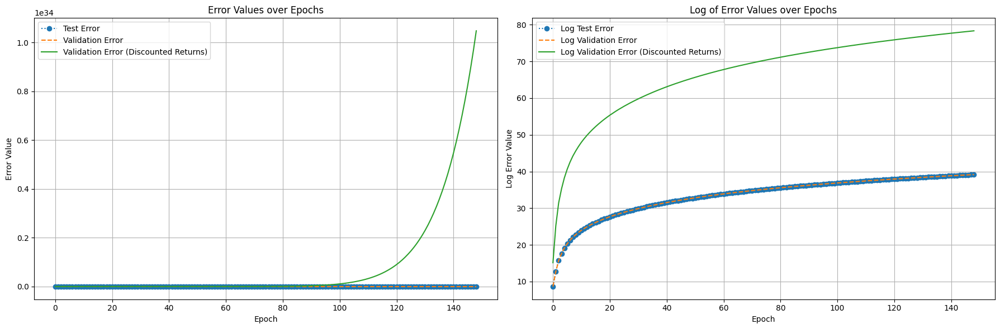

Training Progress:  74%|███████▍  | 149/200 [16:19:08<5:11:27, 366.41s/it, Test Error=105849713712996752.0000, Validation Error=105858390000224656.0000, Validation Error (Discounted)=11338424063836986430931389997121536.0000]

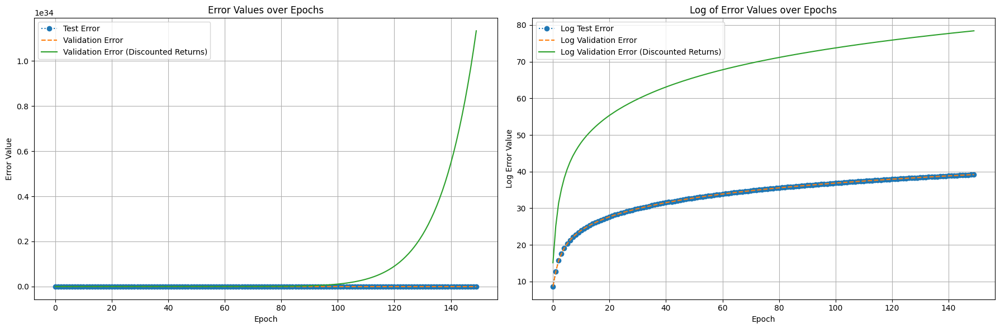

Training Progress:  75%|███████▌  | 150/200 [16:25:18<5:04:57, 365.94s/it, Test Error=110090208781066544.0000, Validation Error=110099231082934560.0000, Validation Error (Discounted)=12265014287896767541304425753608192.0000]

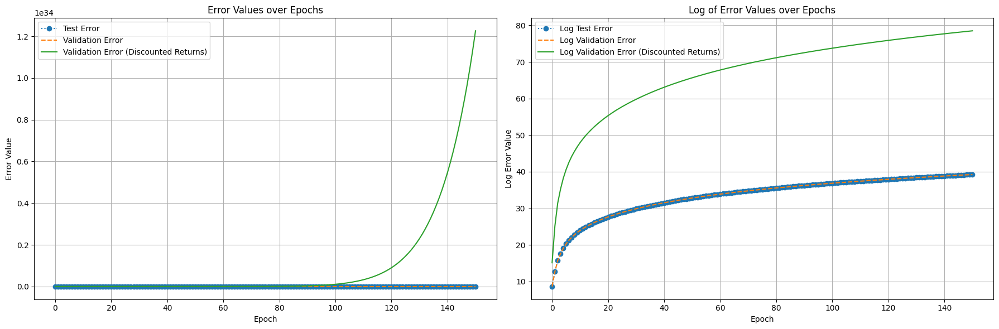

Training Progress:  76%|███████▌  | 151/200 [16:31:23<5:00:00, 367.35s/it, Test Error=114426614083504416.0000, Validation Error=114435991189589264.0000, Validation Error (Discounted)=13250302482893512772464025771442176.0000]

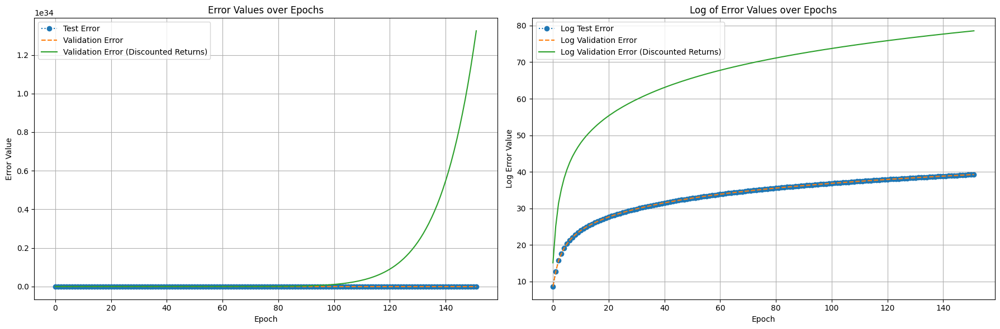

Training Progress:  76%|███████▌  | 152/200 [16:37:30<4:53:20, 366.68s/it, Test Error=118929597051201312.0000, Validation Error=118939344779659424.0000, Validation Error (Discounted)=14313679621184933926652009364062208.0000]

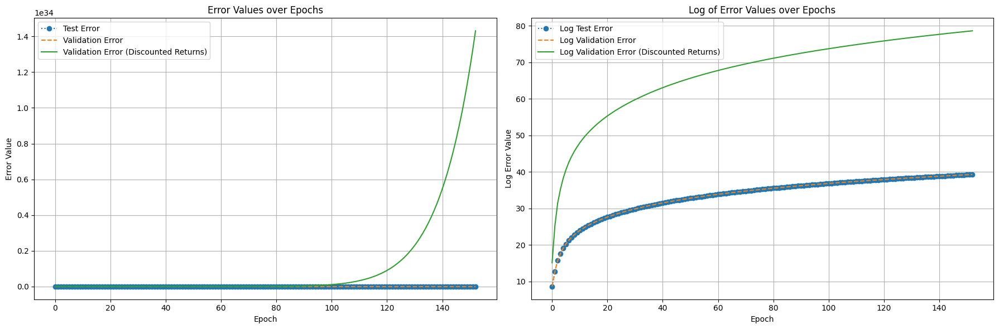

Training Progress:  76%|███████▋  | 153/200 [16:43:47<4:47:13, 366.67s/it, Test Error=123567854648347008.0000, Validation Error=123577983744377520.0000, Validation Error (Discounted)=15451937598129930034950574371241984.0000]

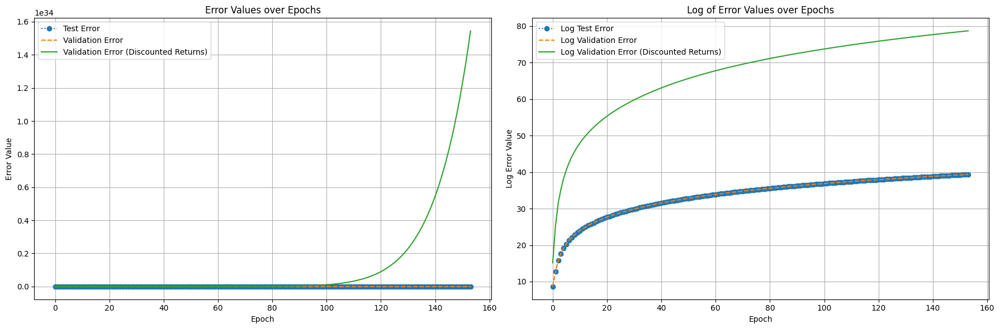

Training Progress:  77%|███████▋  | 154/200 [16:49:49<4:43:34, 369.87s/it, Test Error=128380622793668576.0000, Validation Error=128391145278183744.0000, Validation Error (Discounted)=16679040776121417646636060087681024.0000]

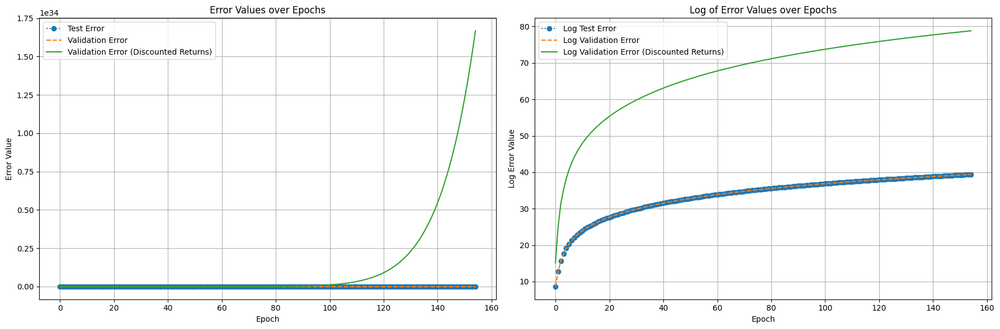

Training Progress:  78%|███████▊  | 155/200 [16:56:01<4:35:37, 367.50s/it, Test Error=133370400295064080.0000, Validation Error=133381330343012192.0000, Validation Error (Discounted)=18000738868168114557230459968815104.0000]

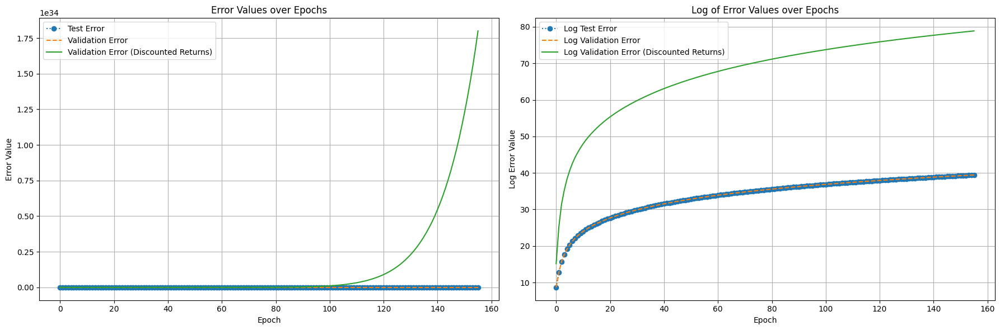

Training Progress:  78%|███████▊  | 156/200 [17:02:02<4:30:25, 368.75s/it, Test Error=138460523926002224.0000, Validation Error=138471871033129952.0000, Validation Error (Discounted)=19400999822818198580258847171018752.0000]

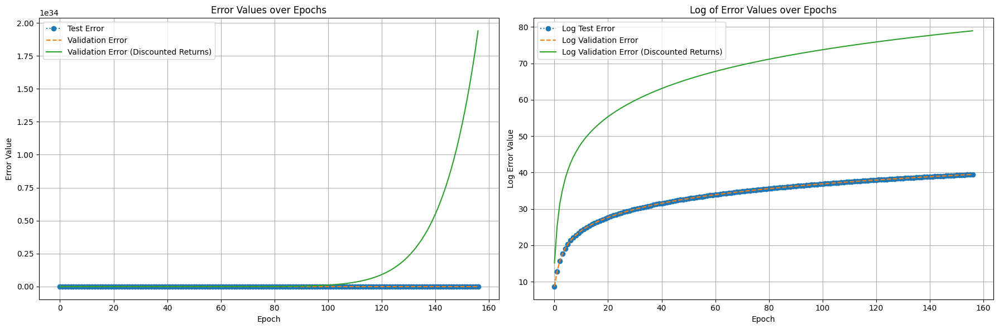

Training Progress:  78%|███████▊  | 157/200 [17:08:14<4:22:41, 366.55s/it, Test Error=143766828422896192.0000, Validation Error=143778610490599776.0000, Validation Error (Discounted)=20916489084176877857945888833404928.0000]

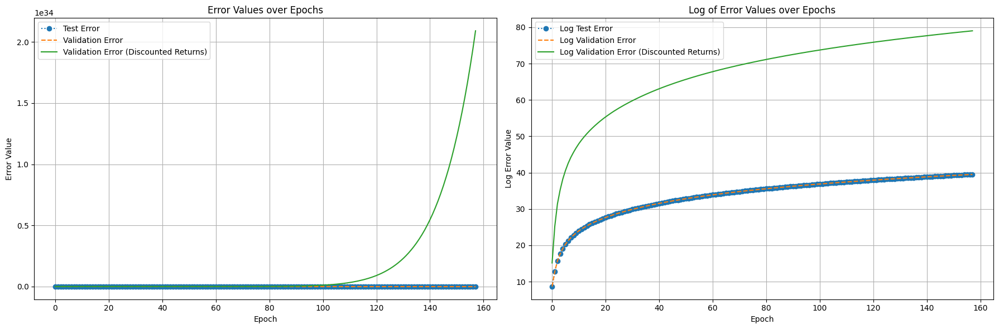

Training Progress:  79%|███████▉  | 158/200 [17:14:17<4:17:45, 368.24s/it, Test Error=149171887840274336.0000, Validation Error=149184113392350528.0000, Validation Error (Discounted)=22518815482522645448675210624499712.0000]

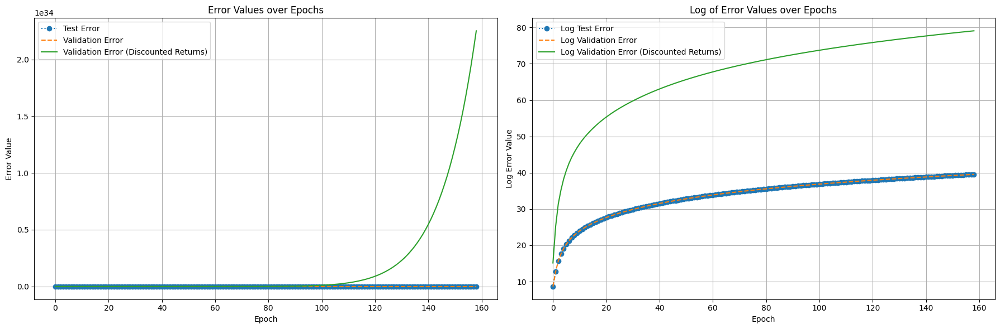

Training Progress:  80%|███████▉  | 159/200 [17:20:30<4:10:26, 366.50s/it, Test Error=154848304359038336.0000, Validation Error=154860993735435008.0000, Validation Error (Discounted)=24265169314133280214501092250091520.0000]

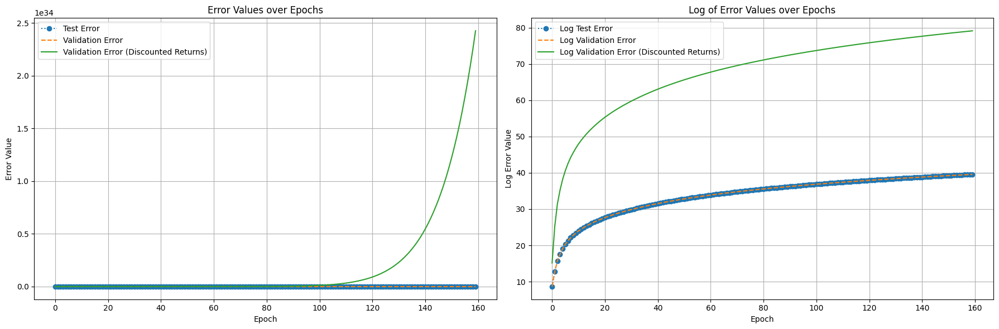

Training Progress:  80%|████████  | 160/200 [17:26:45<4:05:43, 368.60s/it, Test Error=160645121337167232.0000, Validation Error=160658283125259424.0000, Validation Error (Discounted)=26115834881000285772779159111598080.0000]

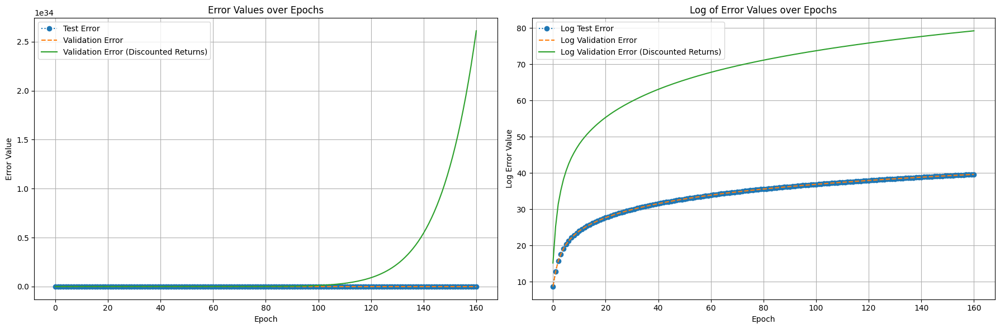

Training Progress:  80%|████████  | 161/200 [17:32:48<4:00:46, 370.44s/it, Test Error=166566956416028320.0000, Validation Error=166580603989585184.0000, Validation Error (Discounted)=28076714839673144883697796985651200.0000]

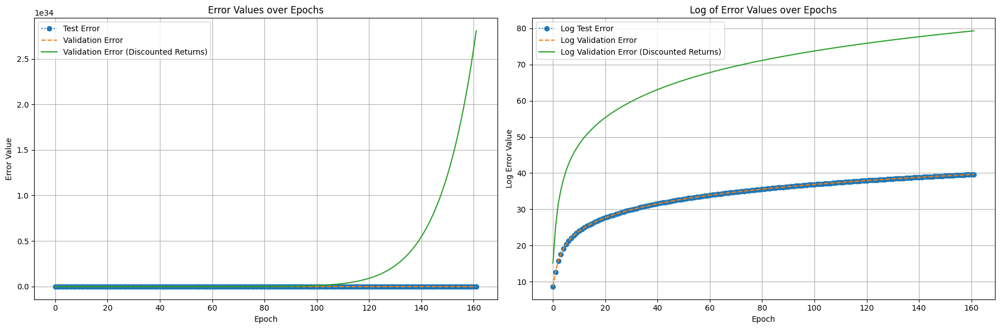

Training Progress:  81%|████████  | 162/200 [17:39:00<3:53:05, 368.05s/it, Test Error=172687234255255200.0000, Validation Error=172701382695548960.0000, Validation Error (Discounted)=30177937025611541354547217191403520.0000]

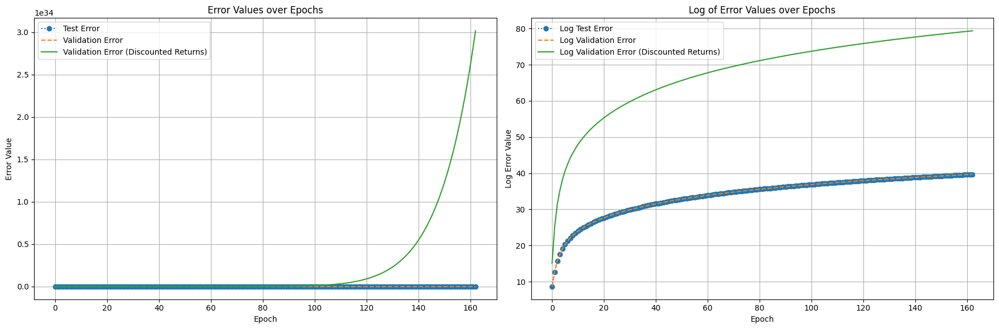

Training Progress:  82%|████████▏ | 163/200 [17:45:14<3:47:47, 369.39s/it, Test Error=179053094723537920.0000, Validation Error=179067763806911456.0000, Validation Error (Discounted)=32443955334269917722017074555912192.0000]

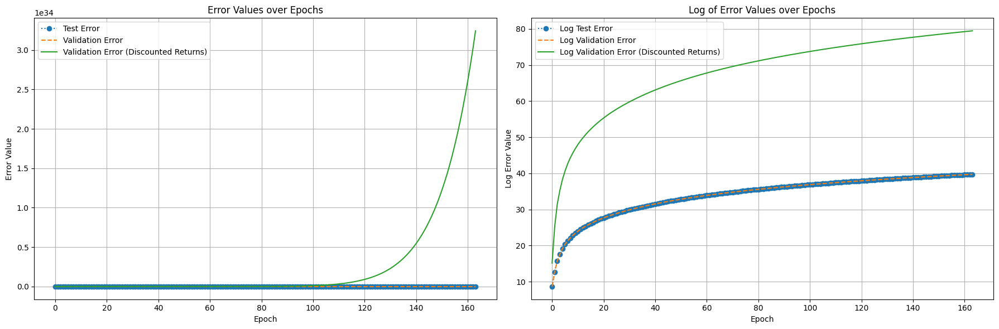

Training Progress:  82%|████████▏ | 164/200 [17:51:31<3:42:27, 370.76s/it, Test Error=185607094269436448.0000, Validation Error=185622299268920768.0000, Validation Error (Discounted)=34862538549098394495429012304691200.0000]

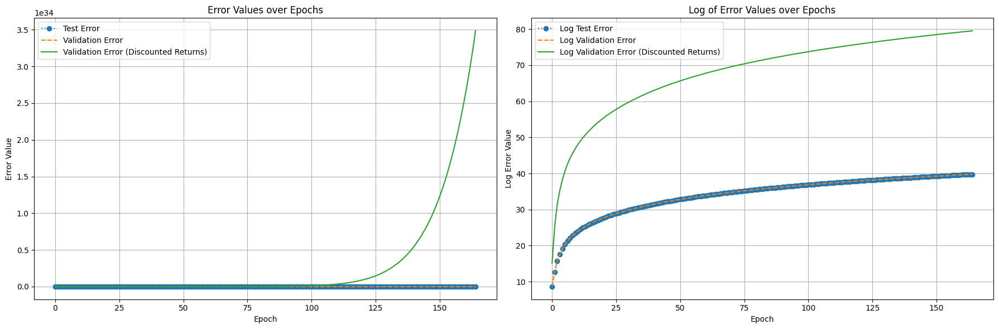

Training Progress:  82%|████████▎ | 165/200 [17:57:44<3:37:19, 372.56s/it, Test Error=192434945867328512.0000, Validation Error=192450707829502176.0000, Validation Error (Discounted)=37474557208765295955041210465255424.0000]

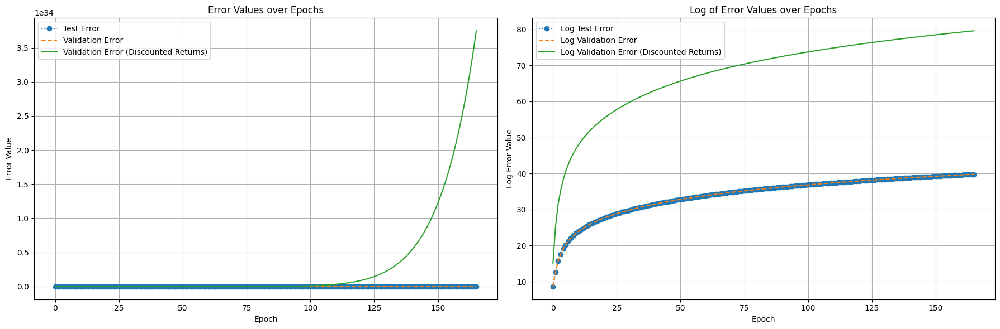

Training Progress:  83%|████████▎ | 166/200 [18:03:56<3:31:14, 372.77s/it, Test Error=199302946140925184.0000, Validation Error=199319271258072224.0000, Validation Error (Discounted)=40197148168826266960826827668455424.0000]

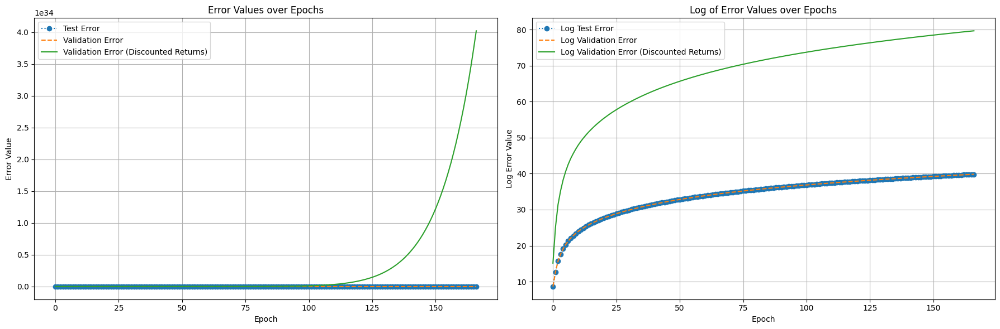

Training Progress:  84%|████████▎ | 167/200 [18:10:09<3:24:55, 372.58s/it, Test Error=206443638003639040.0000, Validation Error=206460543519923648.0000, Validation Error (Discounted)=43129000281746049784618593917337600.0000]

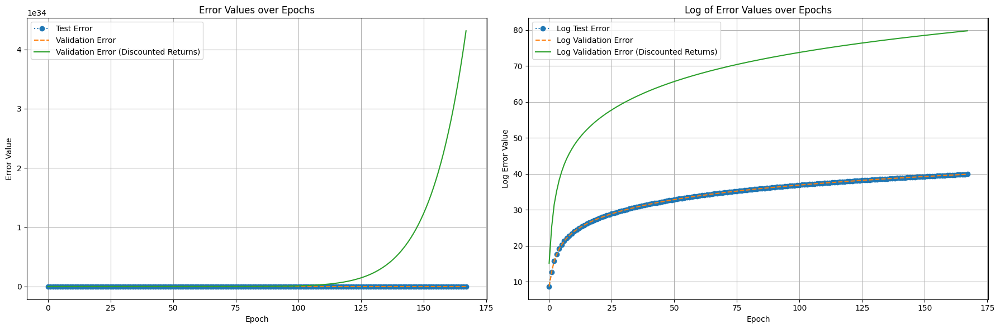

Training Progress:  84%|████████▍ | 168/200 [18:16:23<3:18:41, 372.54s/it, Test Error=213795326050830144.0000, Validation Error=213812832920995520.0000, Validation Error (Discounted)=46255437328966769566509210215120896.0000]

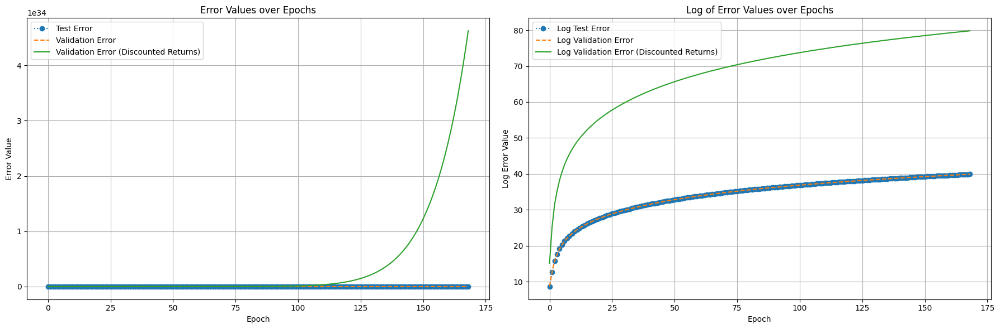

Training Progress:  84%|████████▍ | 169/200 [18:22:33<3:12:40, 372.92s/it, Test Error=221447453734975328.0000, Validation Error=221465582110896192.0000, Validation Error (Discounted)=49625779807436074627613150125490176.0000]

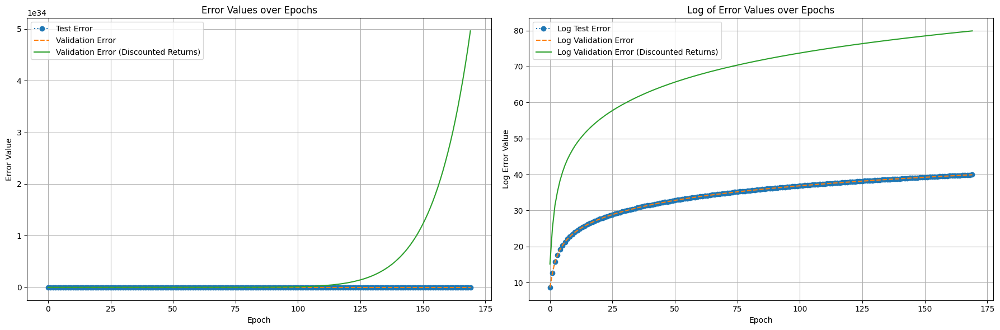

Training Progress:  85%|████████▌ | 170/200 [18:28:42<3:06:04, 372.15s/it, Test Error=229159715489761920.0000, Validation Error=229178475954210656.0000, Validation Error (Discounted)=53142504473442872279988929738833920.0000]

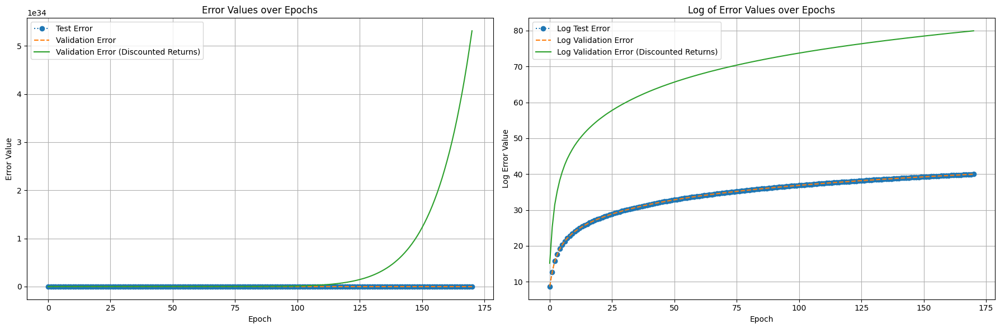

Training Progress:  86%|████████▌ | 171/200 [18:34:56<2:59:26, 371.27s/it, Test Error=237186888162543232.0000, Validation Error=237206305613245952.0000, Validation Error (Discounted)=56930775126310682436720814727364608.0000]

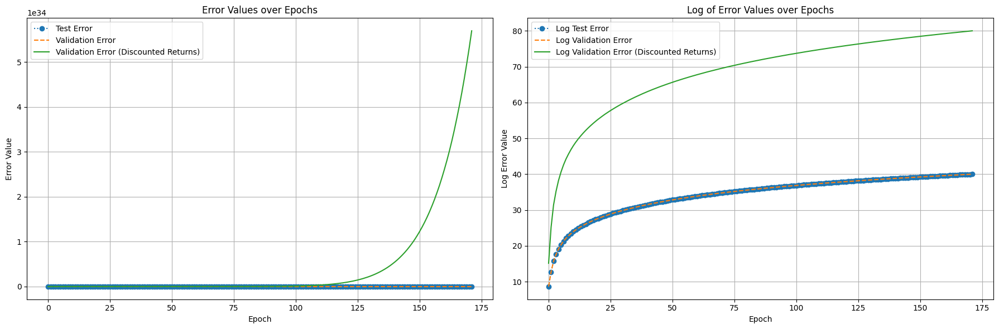

Training Progress:  86%|████████▌ | 172/200 [18:41:06<2:53:35, 371.98s/it, Test Error=245464782249878016.0000, Validation Error=245484876826628544.0000, Validation Error (Discounted)=60973770838273411888962657650212864.0000]

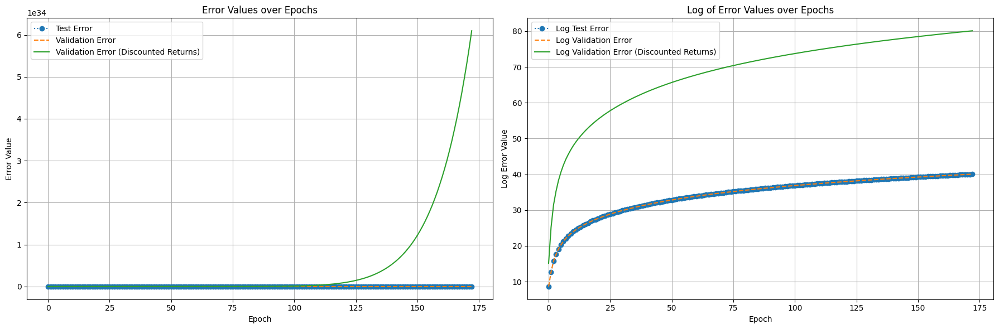

Training Progress:  86%|████████▋ | 173/200 [18:47:15<2:47:09, 371.45s/it, Test Error=253909885913369440.0000, Validation Error=253930672369822208.0000, Validation Error (Discounted)=65241456128418947465961999580528640.0000]

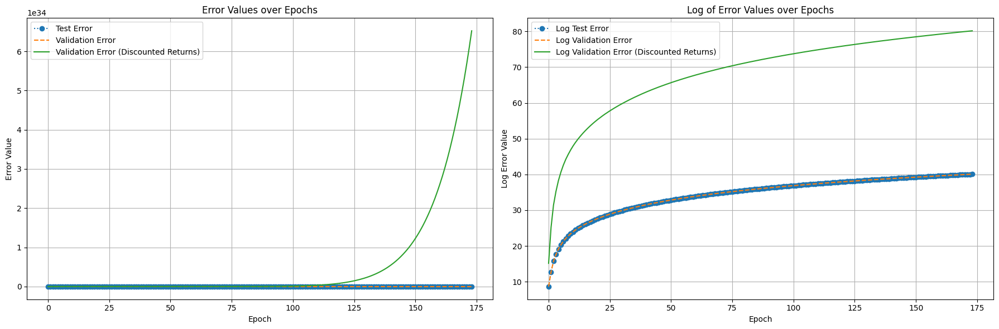

Training Progress:  87%|████████▋ | 174/200 [18:53:28<2:40:41, 370.83s/it, Test Error=262660366554483744.0000, Validation Error=262681868250096800.0000, Validation Error (Discounted)=69815633982247528774160605054500864.0000]

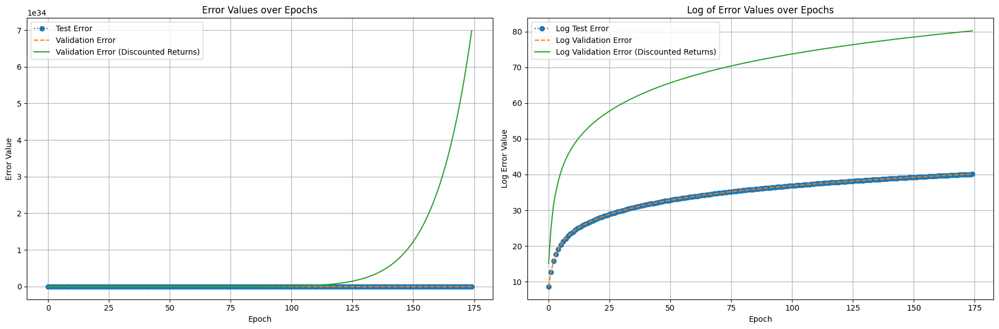

Training Progress:  88%|████████▊ | 175/200 [18:59:47<2:34:46, 371.45s/it, Test Error=271666812357847648.0000, Validation Error=271689050044343456.0000, Validation Error (Discounted)=74685637163187846851685242332250112.0000]

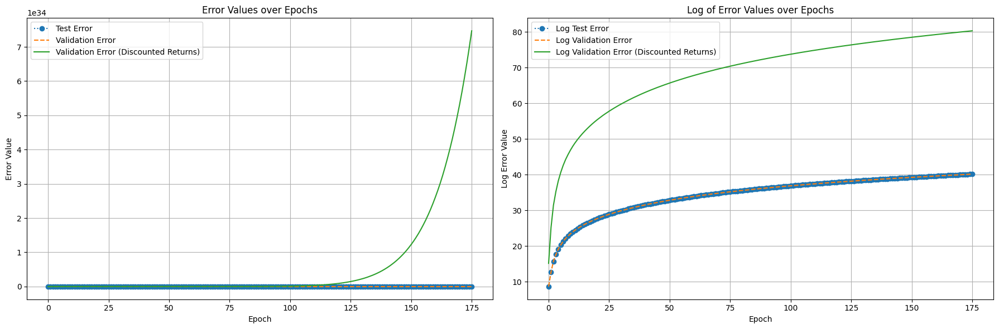

Training Progress:  88%|████████▊ | 176/200 [19:06:18<2:29:25, 373.57s/it, Test Error=280860877838852448.0000, Validation Error=280883869348366816.0000, Validation Error (Discounted)=79826386854063132453822558946459648.0000]

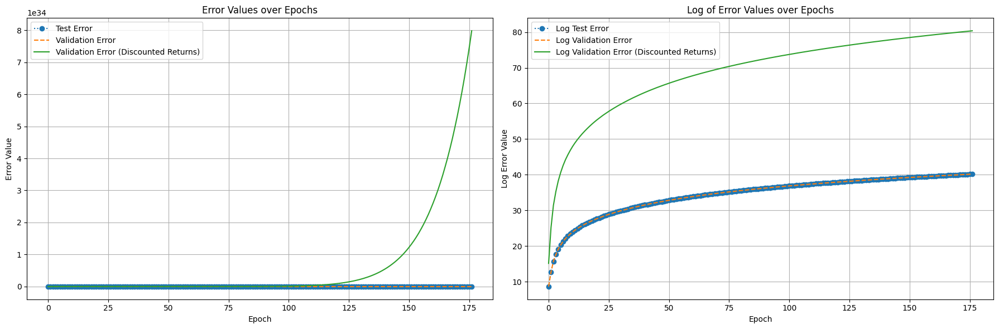

Training Progress:  88%|████████▊ | 177/200 [19:06:19<2:25:16, 378.98s/it, Test Error=280860877838852448.0000, Validation Error=280883869348366816.0000, Validation Error (Discounted)=79826386854063132453822558946459648.0000]

In [ ]:
import random
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# Split dataset into training and validation sets (80/20 split)
experience_datas = [e.data for e in experiences]
train_experiences, test_experiences = train_test_split(experience_datas, test_size=0.2, random_state=42)

# Initialize the agent
agent = DqlCnnAgent(
    state_encoder=state_encoder,
    move_encoder=move_encoder,
    experience_encoder = cnn_encoder,
    gamma=gamma,
    lr=lr,
    batch_size=batch_size
)

# List to store error metrics from each epoch
error_values = []

# Training loop with validation at each epoch
print("Starting training...")
num_epochs = 200
with tqdm(range(num_epochs), desc="Training Progress") as epoch_bar:
    for epoch in epoch_bar:
        # Shuffle training data each epoch for better generalization
        random.shuffle(train_experiences)
        
        # Training phase
        for i in range(0, len(train_experiences), batch_size):
            batch_experiences = train_experiences[i:i + batch_size]
            for experience in batch_experiences:
                agent.store_experience(experience)  # Store each experience in the batch
            agent.train()  # Train on the batch

        # Validation phase
        results = agent.validate(
            test_set=test_experiences, 
            validation_set=train_experiences, 
            validation_simulations=simulations
        )
        
        # Append validation results to error_values list
        error_values.append({
            "epoch": epoch,
            "test_error": results['test_error'],
            "validation_error": results['validation_error'],
            "validation_error_discounted_returns": results['validation_error_discounted_returns']
        })
        
        # Update progress bar with current errors
        epoch_bar.set_postfix({
            "Test Error": f"{results['test_error']:.4f}",
            "Validation Error": f"{results['validation_error']:.4f}",
            "Validation Error (Discounted)": f"{results['validation_error_discounted_returns']:.4f}"
        })
        
        # Save the model at each epoch
        agent.save(model_save_path)
        print_err(error_values)

# Save the trained model with all components
print(f"Model and components saved to {model_save_path}")

---

dql_cnn_model_v003.pth
Training Progress: 100%|██████████| 120/120 [19:31:46<00:00, 585.89s/it, Test Error=17.5490, Validation Error=17.5443, Validation Error (Discounted)=538.4413]

---



In [ ]:
# model_1 = BootstrapModel()
model_1 = DqlCnnModel(
    model_path=model_save_path,                          
    board_size=4                               
)

# model_2 = DqlCnnModel(
#     model_path=model_save_path,                          
#     board_size=4                               
# )
model_2 = BootstrapModel()


# Simulate the game using the models
game_simulation = GameSimulation.simulate_game(
    models=[model_1, model_2],  # DQL model plays against the bootstrap model
    name=f"dql_cnn_vs_bootstrap_{model_version}_simulation",
    version="v1.0.0",
    print_period=500,
    show_coordinates=True,
    max_turns=1000
)


In [ ]:
game_simulation.display()
game_simulation.save_animation()

In [ ]:
game_sequence = game_simulation._to_game_sequence()
for i, (move, game) in enumerate(zip(game_simulation.data.historical_moves, game_sequence)):
    print(f"\nCurrent Player: {game.get_current_player().player_id} \n{move}\nTurn: {i}")
    game.print()
    if i > 20:
        break